In [17]:
from __future__ import absolute_import, division, print_function
import glob
import os
import pdb
import numpy as np
import numpy.random as npr
import tensorflow as tf
import sys
import matplotlib.pyplot as plt
import pdb
import json
import getpass
from scipy import stats
from sklearn import linear_model
from numpy import linalg as LA
import numpy.random as npr
from sklearn.decomposition import PCA
import imageio
from sklearn.manifold import MDS
from scipy.spatial import distance
from sklearn.cluster import KMeans

ui = getpass.getuser()
if ui == 'laura':
    p = '/home/laura'
elif ui == 'lauradriscoll':
    p = '/Users/lauradriscoll/Documents'
elif ui == 'lndrisco':
    p = '/home/users/lndrisco'

net = 'stepnet'
PATH_YANGNET = os.path.join(p,'code/multitask-nets',net)

sys.path.insert(0, PATH_YANGNET)
from task import generate_trials, rule_name, rule_index_map, rules_dict
from network import Model
import tools
from tools_lnd import name_best_ckpt, generate_Beta_epoch, make_h_combined, same_stim_trial
from tools_lnd import get_T_inds, gen_trials_from_model_dir

PATH_TO_RECURRENT_WHISPERER = p+'/code/recurrent-whisperer'#'/home/laura/code/recurrent-whisperer'#
sys.path.insert(0, PATH_TO_RECURRENT_WHISPERER)
from RecurrentWhisperer import RecurrentWhisperer

PATH_TO_FIXED_POINT_FINDER = p+'/code/fixed-point-finder' #'/home/laura/code/fixed-point-finder-experimental'#
sys.path.insert(0, PATH_TO_FIXED_POINT_FINDER)
from FixedPointFinder import FixedPointFinder

In [2]:
task_list = ['fdgo', 'reactgo', 'delaygo', 'fdanti', 'reactanti', 'delayanti',
              'delaydm1', 'delaydm2', 'contextdelaydm1', 'contextdelaydm2', 'multidelaydm',
              'dmsgo', 'dmsnogo', 'dmcgo', 'dmcnogo']

rule_set_names = ['DelayGo', 'ReactGo', 'MemoryGo', 'DelayAnti', 'ReactAnti', 'MemoryAnti',
              'Decison1', 'Decison2', 'ContextDecison1', 'ContextDecison2', 'MultiDecison',
              'DelayDecison1', 'DelayDecison2', 'ContextDelayDecison1', 'ContextDelayDecison2', 'MultiDelayDecison',
              'DelayMatch2SampleGo', 'DelayMatch2SampleNogo', 'DelayMatch2CategoryGo', 'DelayMatch2CategoryNoGo']

In [3]:
def make_h_combined_axes(model_dir_all,tasks,epoch,count_back,count_forward,npc = 2,pc_inds = [0,1]):
    h_context_combined = []

    model = Model(model_dir_all)
    with tf.Session() as sess:
        model.restore()
        # get all connection weights and biases as tensorflow variables
        var_list = model.var_list
        # evaluate the parameters after training
        params = [sess.run(var) for var in var_list]
        # get hparams
        hparams = model.hp

        for r in range(len(tasks)):
            r_all_tasks_ind = tasks[r]

            trial = generate_trials(rules_dict['all'][r_all_tasks_ind], hparams, mode = 'random', batch_size = 100, noise_on = False, delay_fac =1)
            ind_end = np.min(trial.epochs[epoch][1],)
            epoch_inds = range(ind_end-count_back,ind_end+count_forward)

            feed_dict = tools.gen_feed_dict(model, trial, hparams)
            h_tf = sess.run(model.h, feed_dict=feed_dict) #(n_time, n_trials, n_neuron)
            h_context = h_tf[epoch_inds,:,:] # h @ end of context period
            h_context = np.reshape(h_context,(-1,np.shape(h_tf)[2]))

            #concatenate activity states across tasks
            if np.shape(h_context_combined)[0] == 0:
                h_context_combined = h_context
            else:
                h_context_combined = np.concatenate((h_context_combined, h_context), axis=0)

    pca = PCA(n_components = npc,whiten = True)
    X_pca = pca.fit_transform(np.squeeze(h_context_combined))
    print(np.shape(h_context_combined))
    D = pca.components_[pc_inds,:].T
    return D

In [4]:
def plot_h_struct_multi_context(model_dir_all,tasks,trial_set,trial_master,D,h_epoch,color_inds,
                                rot = 0,dot_alpha = .5,ha="left", va="top"):
    
    line_alpha = .1

    T_end = trial_master.epochs[h_epoch][1]
    if T_end is None:
        T_end = np.shape(trial_master.x)[0]-1

    T_start = trial_master.epochs[h_epoch][0]
    if T_start is None:
        T_start = 0
    
    model = Model(model_dir_all)
    with tf.Session() as sess:
        model.restore()
        hparams = model.hp

        for rule_ind in tasks:
            trial = same_stim_trial(trial_master, rule_ind)
            feed_dict = tools.gen_feed_dict(model, trial, hparams)
            h_tf, _ = sess.run([model.h, model.y_hat], feed_dict=feed_dict) #(n_time, n_condition, n_neuron)

            for s in trial_set:
                c = color_inds[rule_ind]
                X_trial = np.dot(h_tf[range(T_start,T_end),s,:],D)
                
                if s==trial_set[0]:
                    plt.plot(X_trial[-1,0],X_trial[-1,1],'o',c = c,alpha = dot_alpha,label = rule_set_names[rule_ind])
                    plt.text(X_trial[-1,0],X_trial[-1,1],rule_set_names[rule_ind],size=20, rotation=rot,
                             ha=ha, va=va, bbox=dict(boxstyle="square",ec='None',fc=c,alpha = dot_alpha))
                else:
                    plt.plot(X_trial[-1,0],X_trial[-1,1],'o',c = c, linewidth = .3,alpha = dot_alpha)
                    

        plt.xlabel('PC 1')
        plt.ylabel('PC 2') 
#         plt.title('Context Activity Colored by Task')

In [5]:
def plot_fp_struct_multicolor(m,tasks,trial_set,r,D,fp_epoch,axes_epoch,do_plot_FP,
                              t_num = 0,qlim = .000001,color_label = 'stim1',alpha_color = 'white',fs = 18):
    cmap=plt.get_cmap('rainbow')
    plt.rcParams.update({'font.size': fs})
    lw = 3
    al = .6

    ## plot w test set of trials
    model = Model(m)
    with tf.Session() as sess:
        model.restore()
        hparams = model.hp
        model._sigma=0

        for rule_ind in tasks:
            rule = rules_dict['all'][rule_ind]
            trial = generate_trials(rule, hparams, mode='test', batch_size = np.max(trial_set),
                                    noise_on=False, delay_fac =1)
            feed_dict = tools.gen_feed_dict(model, trial, hparams)
            h_tf, _ = sess.run([model.h, model.y_hat], feed_dict=feed_dict) #(n_time, n_condition, n_neuron)

            T_inds = get_T_inds(trial,fp_epoch) # grab epoch time indexing

            fldr = os.path.join(m,'golub_fixed_pts',rule,fp_epoch+'*')
            f_list = [f for f in glob.glob(fldr)]

            T,S,N = np.shape(h_tf)
            print(S)
            
            stim1_locs = np.min(trial.stim_locs[:,[0,2]],axis=1)
            stim2_locs = np.min(trial.stim_locs[:,[1,3]],axis=1)
            y_loc = trial.y_loc[-1,:]
            
            if color_label == 'stim1' or color_label == 'delay1':
                c_inds = stim1_locs
            elif color_label == 'stim2' or color_label == 'delay2':
                c_inds = stim2_locs
            else:
                c_inds = y_loc
            
            if do_plot_FP==0:
                for s in range(0,S,int(S/8)):
                    c = cmap(c_inds[s]/(2*np.pi))
                    X_trial = np.dot(h_tf[T_inds,s,:],D)
                    plt.plot(X_trial[0,0],X_trial[0,1],'x',c = c, alpha = al, linewidth = lw)
                    plt.plot(X_trial[:,0],X_trial[:,1],'-',c = c, alpha = al, linewidth = lw)
                    if alpha_color == 'black':
                        plt.plot(X_trial[0,0],X_trial[0,1],'x',c = 'k', alpha = .3, linewidth = lw)
                        plt.plot(X_trial[:,0],X_trial[:,1],'-',c = 'k', alpha = .3, linewidth = lw)
                    
                    if s==0:
                        plt.plot(X_trial[-1,0],X_trial[-1,1],'^',c = c, alpha = al, linewidth = lw,label = rule)
                    else:
                        plt.plot(X_trial[-1,0],X_trial[-1,1],'^',c = c, alpha = al, linewidth = lw)
                    
            elif do_plot_FP==1:
                
                c = 'gray'
                for s in range(0,S,int(S/8)):
                    X_trial = np.dot(h_tf[T_inds,s,:],D)
                    plt.plot(X_trial[0,0],X_trial[0,1],'x',c = c, alpha = al, linewidth = lw)
                    plt.plot(X_trial[:,0],X_trial[:,1],'-',c = c, alpha = al, linewidth = lw)
                    plt.plot(X_trial[-1,0],X_trial[-1,1],'^',c = c, alpha = al, linewidth = lw)
                        
                s = t_num
                filename = os.path.join(m,'golub_fixed_pts',rule,fp_epoch+'_'+str(t_num)+'.npz')

                if os.path.exists(filename):
                    print(filename)
                else:
                    filename = os.path.join(m,'golub_fixed_pts',rule,fp_epoch+'_'+str(0)+'.npz')
                    
                fp_struct = np.load(filename)
                c = cmap(c_inds[s]/(2*np.pi))

                X_trial = np.dot(h_tf[T_inds,s,:],D)
                plt.plot(X_trial[0,0],X_trial[0,1],'x',c = c, alpha = al, linewidth = lw)
                plt.plot(X_trial[:,0],X_trial[:,1],'-',c = c, alpha = al, linewidth = lw)
                plt.plot(X_trial[-1,0],X_trial[-1,1],'^',c = c, alpha = al, linewidth = lw ,label = rule)

                fp_logic = fp_struct['qstar']< qlim
                eig_decomps = comp_eig_decomp(fp_struct['J_xstar'][fp_logic,:,:])
                sorted_fps = fp_struct['xstar'][fp_logic,:]
                plot_FP(sorted_fps, D.T, eig_decomps, c)
                
            elif do_plot_FP==2:
                
                for s in range(0,S,int(S/8)):
                    filename = f_list[s]

                    if os.path.exists(filename):
                        print(filename)
                        fp_struct = np.load(filename)
                        c = cmap(c_inds[s]/(2*np.pi))
                        if fp_struct['trial_num']%4==0:

                            X_trial = np.dot(h_tf[T_inds,fp_struct['trial_num'],:],D)
                            plt.plot(X_trial[0,0],X_trial[0,1],'x',c = c, alpha = al, linewidth = lw)
                            plt.plot(X_trial[:,0],X_trial[:,1],'-',c = c, alpha = al, linewidth = lw)
                            if s==0:
                                plt.plot(X_trial[-1,0],X_trial[-1,1],'^',c = c, alpha = al, 
                                         linewidth = lw, label = rule)
                            else:
                                plt.plot(X_trial[-1,0],X_trial[-1,1],'^',c = c, alpha = al, linewidth = lw)

                            fp_logic = fp_struct['qstar']< qlim
                            eig_decomps = comp_eig_decomp(fp_struct['J_xstar'][fp_logic,:,:])
                            sorted_fps = fp_struct['xstar'][fp_logic,:]
                            plot_FP(sorted_fps, D.T, eig_decomps, c)

            plt.xlabel(r + ' Beta_' + axes_epoch + ' cos@')
            plt.ylabel(r + ' Beta_' + axes_epoch + ' sin@')
            if fp_epoch=='fix1':
                plt.title(rule_set_names[rule_ind] + ' Context')
            elif fp_epoch=='stim1':
                plt.title(rule_set_names[rule_ind] + ' Stimulus')
            elif fp_epoch=='delay1':
                plt.title(rule_set_names[rule_ind] + ' Memory')
            elif fp_epoch=='go1':
                plt.title(rule_set_names[rule_ind] + ' Response')
            

In [6]:
def make_axes(model_dir_all,rule_master,epoch,ind = -1,mod = 'either'):

    model = Model(model_dir_all)
    with tf.Session() as sess:
        model.restore()
        # get all connection weights and biases as tensorflow variables
        var_list = model.var_list
        # evaluate the parameters after training
        params = [sess.run(var) for var in var_list]
        # get hparams
        hparams = model.hp
        trial_master = generate_trials(rule_master, hparams, mode = 'test', batch_size = 400, noise_on=False, delay_fac =1)
        feed_dict = tools.gen_feed_dict(model, trial_master, hparams)
        h_tf = sess.run(model.h, feed_dict=feed_dict) #(n_time, n_trials, n_neuron)

    print(mod)
    Beta_epoch = generate_Beta_epoch(h_tf,trial_master,ind,mod = mod)
    X_pca = Beta_epoch[epoch]    
    D = np.concatenate((np.expand_dims(X_pca[:,0],axis=1),np.expand_dims(X_pca[:,1],axis=1)),axis = 1)
    return D

In [7]:
def comp_eig_decomp(Ms, sort_by='real',
                                     do_compute_lefts=True):
  """Compute the eigenvalues of the matrix M. No assumptions are made on M.

  Arguments: 
    M: 3D np.array nmatrices x dim x dim matrix
    do_compute_lefts: Compute the left eigenvectors? Requires a pseudo-inverse 
      call.

  Returns: 
    list of dictionaries with eigenvalues components: sorted 
      eigenvalues, sorted right eigenvectors, and sored left eigenvectors 
      (as column vectors).
  """
  if sort_by == 'magnitude':
    sort_fun = np.abs
  elif sort_by == 'real':
    sort_fun = np.real
  else:
    assert False, "Not implemented yet."      
  
  decomps = []
  L = None  
  for M in Ms:
    evals, R = LA.eig(M)    
    indices = np.flipud(np.argsort(sort_fun(evals)))
    if do_compute_lefts:
      L = LA.pinv(R).T  # as columns      
      L = L[:, indices]
    decomps.append({'evals' : evals[indices], 'R' : R[:, indices],  'L' : L})
  
  return decomps

In [8]:
def plot_FP(X, D, eig_decomps, c='k'):
    """Plot activity is some 2D space.

        Args:
            X: Fixed points in #Fps x Neurons
            D: Neurons x 2 plotting dims
    
        """
    S = np.shape(X)[0]
    lf = 1
    rf = 1
    
    for s in range(S):
        
        X_trial = np.dot(X[s,:],D.T)
        
        n_arg = np.argwhere(eig_decomps[s]['evals']>1)+1
        if len(n_arg)>0:
            for arg in range(np.max(n_arg)):
                rdots = np.dot(np.real(eig_decomps[s]['R'][:, arg]).T,D.T)
                ldots = np.dot(np.real(eig_decomps[s]['L'][:, arg]).T,D.T)
                overlap = np.dot(rdots,ldots.T)
                r = np.concatenate((X_trial - rf*overlap*rdots, X_trial + rf*overlap*rdots),0)
                plt.plot(r[0:4:2],r[1:4:2],'k',alpha = .5,linewidth = .5)
        
        n_arg = np.argwhere(eig_decomps[s]['evals']<.3)
        if len(n_arg)>0:
            for arg in range(np.min(n_arg),len(eig_decomps[s]['evals'])):
                rdots = np.dot(np.real(eig_decomps[s]['R'][:, arg]).T,D.T)
                ldots = np.dot(np.real(eig_decomps[s]['L'][:, arg]).T,D.T)
                overlap = np.dot(rdots,ldots.T)
                r = np.concatenate((X_trial - rf*overlap*rdots, X_trial + rf*overlap*rdots),0)
                plt.plot(r[0:4:2],r[1:4:2],'b',alpha = .5,linewidth = .5)
            
        plt.plot(X_trial[0], X_trial[1], 'o', markerfacecolor = c, markeredgecolor = 'k', 
                 markersize = 6, alpha = .5)
        
def plot_FP_specific(s,X, D, eig_decomps, c='k'):
    """Plot activity is some 2D space.

        Args:
            X: Fixed points in #Fps x Neurons
            D: Neurons x 2 plotting dims
    
        """
    lf = 1000
    rf = 1000
    
    X_trial = np.dot(X[s,:],D.T)
        
    n_arg = np.argwhere(eig_decomps[s]['evals']>1)+1
    if len(n_arg)>0:
        for arg in range(np.max(n_arg)):
            rdots = np.dot(np.real(eig_decomps[s]['R'][:, arg]).T,D.T)
            ldots = np.dot(np.real(eig_decomps[s]['L'][:, arg]).T,D.T)
            overlap = np.dot(rdots,ldots.T)
            r = np.concatenate((X_trial - rf*overlap*rdots, X_trial + rf*overlap*rdots),0)
            plt.plot(r[0:4:2],r[1:4:2],'k',alpha = .5,linewidth = .5)

    n_arg = np.argwhere(eig_decomps[s]['evals']<.3)
    if len(n_arg)>0:
        for arg in range(np.min(n_arg),len(eig_decomps[s]['evals'])):
            rdots = np.dot(np.real(eig_decomps[s]['R'][:, arg]).T,D.T)
            ldots = np.dot(np.real(eig_decomps[s]['L'][:, arg]).T,D.T)
            overlap = np.dot(rdots,ldots.T)
            r = np.concatenate((X_trial - rf*overlap*rdots, X_trial + rf*overlap*rdots),0)
            plt.plot(r[0:4:2],r[1:4:2],'b',alpha = .5,linewidth = .5)

    plt.plot(X_trial[0], X_trial[1], 'o', markerfacecolor = 'none', markeredgecolor = c, 
             markersize = 20, alpha = .5)
    
def make_FP_pcs(m,rule_master,fp_epoch,t_num,n_fps = 4):
    filename = os.path.join(m,'golub_fixed_pts',rule_master,fp_epoch+'_'+str(t_num)+'.npz')
    fp_struct = np.load(filename)
    sorted_fps = fp_struct['xstar']
    
    kmeans = KMeans(n_clusters=n_fps, random_state=0).fit(sorted_fps)
    _,fp_inds = np.unique(kmeans.labels_,return_index=True)

    pca = PCA(n_components = 2)
    fp_pca = pca.fit_transform(sorted_fps[fp_inds,:])
    D_pca = pca.components_.T
    D_use = D_pca
    
    return D_pca, sorted_fps, fp_inds

def plot_FP_jitter(m,D_use,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,rule_set,
                   xlabel = 'FP set PC1',ylabel = 'FP set PC2',rand_step_coef = 0.1,n_steps = 100,
                   lw = 3,al = .6,linestyle = '-'):

    cmap=plt.get_cmap('rainbow')
        
    model = Model(m)
    with tf.Session() as sess:
        model.restore()
        hparams = model.hp
        model._sigma=0

        for rule in rule_set:
            trial = generate_trials(rule, hparams, mode='test',noise_on=False)
            feed_dict = tools.gen_feed_dict(model, trial, hparams)
            h_tf, _ = sess.run([model.h, model.y_hat], feed_dict=feed_dict) #(n_time, n_condition, n_neuron)
            T,S,N = np.shape(h_tf)
            T_inds = get_T_inds(trial,fp_epoch) # grab epoch time indexing

            for s in range(0,S,int(S/8)):

                c_inds = trial.y_loc[-1,:]
                c = cmap(c_inds[s]/(2*np.pi))

                X_trial = np.dot(h_tf[T_inds,s,:],D_use)
                plt.plot(X_trial[0,0],X_trial[0,1],'x',c = c, alpha = al, linewidth = lw)
                plt.plot(X_trial[:,0],X_trial[:,1],linestyle,c = c, alpha = al, linewidth = lw)
                plt.plot(X_trial[-1,0],X_trial[-1,1],'^',c = c, alpha = al, linewidth = lw,markersize = 1)

        trial = generate_trials(rule_master, hparams, mode='test',noise_on=False)
        feed_dict = tools.gen_feed_dict(model, trial, hparams)
        h_tf = sess.run(model.h, feed_dict=feed_dict) #(n_time, n_condition, n_neuron)
        T_inds = get_T_inds(trial,fp_epoch)

        c_inds = trial.y_loc[-1,:]
        c = cmap(c_inds[t_num]/(2*np.pi))

        X_trial = np.dot(h_tf[T_inds,t_num,:],D_use)
        plt.plot(X_trial[0,0],X_trial[0,1],'x',c = c, alpha = al, linewidth = 5)
        plt.plot(X_trial[:,0],X_trial[:,1],linestyle,c = c, alpha = al, linewidth = 5)
        plt.plot(X_trial[-1,0],X_trial[-1,1],'^',c = c, alpha = al, linewidth = 5,markersize = 1)

    for fp_ind in fp_inds:

        x_t = np.matlib.repmat(trial.x[T_inds[1],t_num,:],n_steps,1)
        for jit in range(50):
            h0 = sorted_fps[fp_ind,:] + rand_step_coef*npr.randn(N)
            h_t = vanilla_run_with_h0(params, x_t, h0, alpha)
            jitter = np.dot(h_t,D_use)
            plt.plot(jitter[-1,0],jitter[-1,1],'^k',linewidth = .1,alpha = .1)
            plt.plot(jitter[:,0],jitter[:,1],'-k',linewidth = .1)

        h0 = sorted_fps[fp_ind,:]
        h_t = vanilla_run_with_h0(params, x_t, h0, alpha)
        jitter = np.dot(h_t,D_use)
        plt.plot(jitter[-1,0],jitter[-1,1],'^k')
        plt.plot(jitter[:,0],jitter[:,1],'-k')
        plt.plot(jitter[0,0],jitter[0,1],'xk',linewidth = 5,markersize = 10)

        h_t = vanilla_run_with_h0(params, x_t, h_tf[T_inds[0],t_num,:], alpha)
        jitter = np.dot(h_t,D_use)
        plt.plot(jitter[-1,0],jitter[-1,1],'^k',c = c)
        plt.plot(jitter[:,0],jitter[:,1],':k',c = c)
        plt.plot(jitter[0,0],jitter[0,1],'xk',c = c,linewidth = 5,markersize = 10)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(rule_master)
    
def plot_N_jitter(m,D_use,rule,fp_epoch,rand_step_coef = 0.1,n_steps = 70,n_jit = 50,
                   lw = 3,al = .6,linestyle = '-',mode = 'test', batch_size = 100):

    cmap=plt.get_cmap('rainbow')
        
    model = Model(m)
    with tf.Session() as sess:
        model.restore()
        hparams = model.hp
        model._sigma=0

        trial = generate_trials(rule, hparams, mode=mode,noise_on=False, batch_size = 100,delay_fac = 1)
        
        feed_dict = tools.gen_feed_dict(model, trial, hparams)
        h_tf, _ = sess.run([model.h, model.y_hat], feed_dict=feed_dict) #(n_time, n_condition, n_neuron)
        T,S,N = np.shape(h_tf)
        T_inds = get_T_inds(trial,fp_epoch) # grab epoch time indexing
                                
        if mode=='test':
            trial_set = range(0,S,int(S/8))
        else:
            trial_set = range(0,S,int(S/50))

        for s in trial_set:

            c_inds = trial.y_loc[-1,:]
            c = cmap(c_inds[s]/(2*np.pi))

            X_trial = np.dot(h_tf[T_inds,s,:],D_use)
            plt.plot(X_trial[0,0],X_trial[0,1],'x',c = c, alpha = al, linewidth = lw)
            plt.plot(X_trial[:,0],X_trial[:,1],linestyle,c = c, alpha = al, linewidth = lw)
            plt.plot(X_trial[-1,0],X_trial[-1,1],'^',c = c, alpha = al, linewidth = lw,markersize = 1)

            x_t = np.matlib.repmat(trial.x[T_inds[1],s,:],n_steps,1)
            for jit in range(n_jit):
                h0 = h_tf[T_inds[0],s,:] + rand_step_coef*npr.randn(N)
                h_t = vanilla_run_with_h0(params, x_t, h0, alpha)
                jitter = np.dot(h_t,D_use)
                plt.plot(jitter[-1,0],jitter[-1,1],'^',c = c,linewidth = .1,alpha = .1)
                plt.plot(jitter[:,0],jitter[:,1],'-',c = c,linewidth = .5,alpha = .5)

    plt.title(rule)
    
def get_model_params(m):
    model = Model(m)
    with tf.Session() as sess:
        model.restore()
        var_list = model.var_list
        params = [sess.run(var) for var in var_list]

    w_in = params[0]
    b_in = params[1]
    w_out = params[2]
    b_out = params[3]
    return w_in, b_in, w_out, b_out

In [12]:
net = 'stepnet'
rule = 'reactanti'
fp_epoch = 'go1'
model_n = 0
dir_specific_all = 'crystals/softplus/l2w0001'#'crystals/softplus/l2h00001'#'stepnet/crystals/softplus/'#grad_norm_both/'#'lowD/combos'#'stepnet/lowD/tanh'#'lowD/grad_norm_l2001' #' #'lowD/armnet_noreg'#lowD/combos' ##grad_norm_l2h000001' /Documents/data/rnn/multitask/varGo/lowD/most/
model_dir_all = os.path.join(p,'data/rnn/multitask/',dir_specific_all,str(model_n))
m = model_dir_all

model = Model(model_dir_all)
with tf.Session() as sess:
    model.restore()
    model._sigma=0
    var_list = model.var_list
    params = [sess.run(var) for var in var_list]
    hparams = model.hp
    trial = generate_trials(rule, hparams, mode='test', noise_on=False, batch_size = 128, delay_fac =1)
    feed_dict = tools.gen_feed_dict(model, trial, hparams)
    h_tf, y_hat_tf = sess.run([model.h, model.y_hat], feed_dict=feed_dict) #(n_time, n_condition, n_neuron)
    
    n_input = hparams['n_input']
    n_rnn = hparams['n_rnn']
    n_output = hparams['n_output']
    w_in = params[0]
    b_in = params[1]
    w_out = params[2]
    b_out = params[3]
    sigma_rec = 0#hparams['sigma_rec']
    dt = hparams['dt']
    tau = hparams['tau']
    alpha = dt/tau
    activation = hparams['activation']

# get trial shape
_,B,N = np.shape(h_tf)
trial_set = range(0,B)

# Fixed point epoch
T = trial.epochs[fp_epoch][1]

# Input during fixed point epoch
x_star = trial.x[-1,0,:]  

axes_epoch = 'go1'
rule_ind = 1

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt


In [13]:
if activation == 'softplus':
    _activation = lambda x: np.log(np.exp(x) + 1)
elif activation == 'tanh':
    _activation = lambda x: np.tanh(x)
elif activation == 'relu':
    _activation = lambda x: x * (x > 0)
elif activation == 'power':
    _activation = lambda x: (x * (x > 0))**2
elif activation == 'retanh':
    _activation = lambda x: np.tanh(x * (x > 0))

def out_affine(params, h):
    return np.dot(params[2].T,h)+params[3]

def relu(x):
    f = x * (x > 0)
    return f

def rnn_vanilla(params, h, x, alpha):
    xh = np.concatenate([x,h], axis=0)
    gate_inputs = np.dot(params[0].T,xh)+params[1]
    noise = 0
    output = _activation(gate_inputs) # + noise

    h_new = (1-alpha) * h + alpha * output
    
    return h_new

def vanilla_run_with_h0(params, x_t, h0, alpha):
    h = h0
    h_t = []
    h_t.append(np.expand_dims(h0,axis=1))
    for x in x_t:
        h = rnn_vanilla(params, np.squeeze(h), np.squeeze(x.T), alpha)
        h_t.append(np.expand_dims(h,axis=1))

    h_t = np.squeeze(np.array(h_t))  
    return h_t

def vanilla_run_at_fp(params, x_t, h0, alpha):
    h = h0
    h_t = []
    h_t.append(h)
    for x in x_t:
        h = rnn_vanilla(params, np.squeeze(h), np.squeeze(x.T), alpha)
        h_t.append(np.expand_dims(h,axis=1))
        
    return h_t

In [14]:
def plot_epochs_act_jitter(m,rule,D_use,epoch_set,epoch_order,lims = 1.5):
    for fp_epoch_ind in range(len(epoch_set)):
        fp_epoch = epoch_set[epoch_order[fp_epoch_ind]]
        ax = plt.subplot(1,len(epoch_set),fp_epoch_ind+1)
    
        plot_N_jitter(m,D_use,rule,fp_epoch,rand_step_coef = 0.1,n_steps = 70,n_jit = 20)

        plt.ylim((-lims,lims))    
        plt.xlim((-lims,lims))  
        plt.xlabel('Output ' + r' $\cos{\theta}$')

        if fp_epoch_ind==0:
            plt.ylabel('Output ' + r' $\sin{\theta}$')
        else:
            ax.get_yaxis().set_visible(False)

        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

    rule = rules_dict['all'][rule_ind]
    figpath = os.path.join(model_dir_all,'Output Prep Figure jitter',rule)
    figname = rule+'_Output_axes_Act_trials.pdf'
    if not os.path.exists(figpath):
        os.makedirs(figpath)
    plt.savefig(os.path.join(figpath,figname))
plt.show()

In [44]:
rule = 'reactgo'
m = model_dir_all
trial = gen_trials_from_model_dir(m,rule,mode='test',noise_on = False)
epoch_set = trial.epochs.keys()
print(epoch_set)

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
['go1', 'fix1']


Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
Model resto

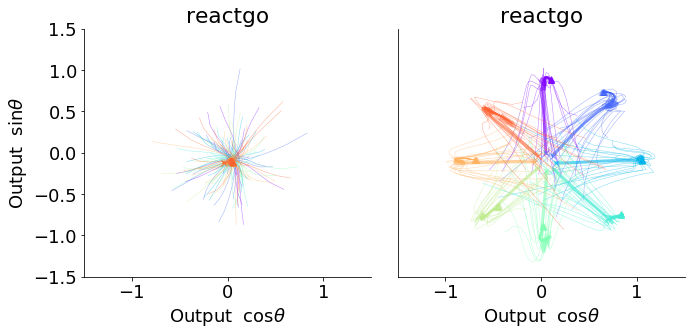

In [180]:
epoch_order = [1,0]
w_in, b_in, w_out, b_out = get_model_params(m)
D_use = w_out[:,1:]
fig = plt.figure(figsize=(len(epoch_set)*5,5),tight_layout=True,facecolor='white')
plot_epochs_act_jitter(m,rule,D_use,epoch_set,epoch_order)

In [181]:
rule = 'fdgo'
trial = gen_trials_from_model_dir(m,rule,mode='test',noise_on = False)
epoch_set = trial.epochs.keys()
print(epoch_set)

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
['stim1', 'go1', 'fix1']


Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
Model resto

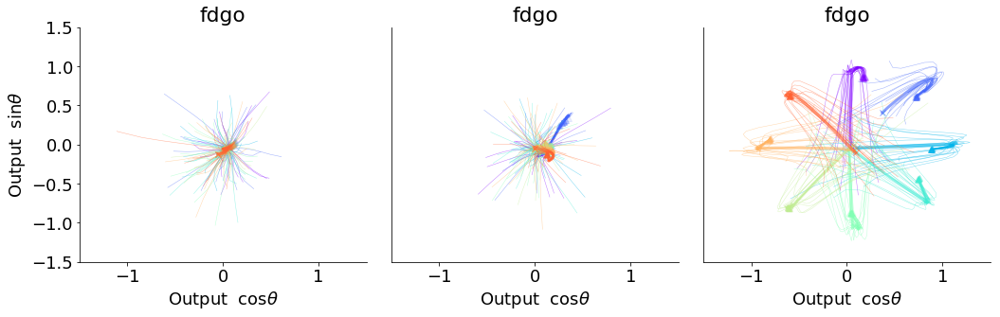

In [182]:
epoch_order = [2,0,1]
fig = plt.figure(figsize=(len(epoch_set)*5,5),tight_layout=True,facecolor='white')
plot_epochs_act_jitter(m,rule,D_use,epoch_set,epoch_order)

In [183]:
rule = 'delaygo'
trial = gen_trials_from_model_dir(m,rule,mode='test',noise_on = False)
epoch_set = trial.epochs.keys()
print(epoch_set)

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
['delay1', 'stim1', 'go1', 'fix1']


Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
Model resto

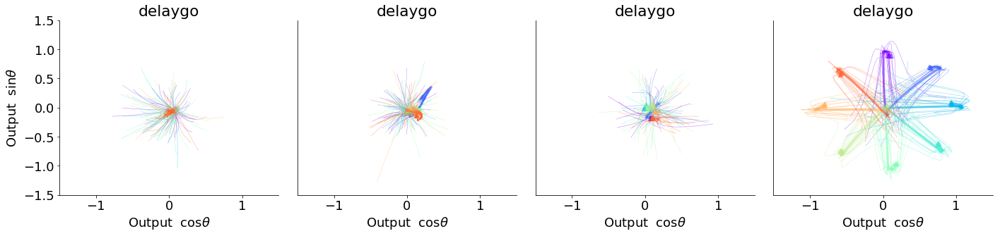

In [184]:
epoch_order = [3,1,0,2]
fig = plt.figure(figsize=(len(epoch_set)*5,5),tight_layout=True,facecolor='white')
plot_epochs_act_jitter(m,rule,D_use,epoch_set,epoch_order)

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/model.ckpt
either
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softpl

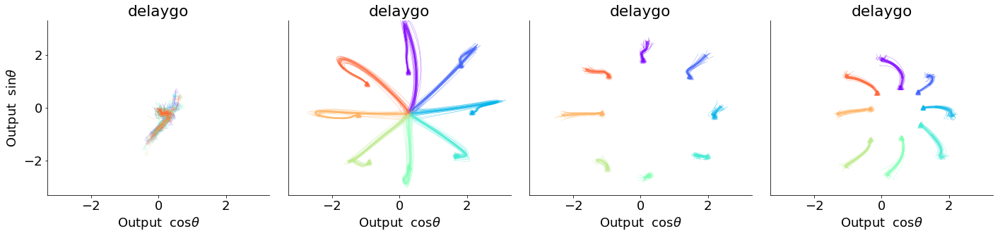

In [188]:
epoch_order = [3,1,0,2]
D_stim = make_axes(m,rule,'stim1')
fig = plt.figure(figsize=(len(epoch_set)*5,5),tight_layout=True,facecolor='white')
plot_epochs_act_jitter(m,rule,D_stim,epoch_set,epoch_order,lims = 3.5)

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/reactgo/go1_0.npz
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring 

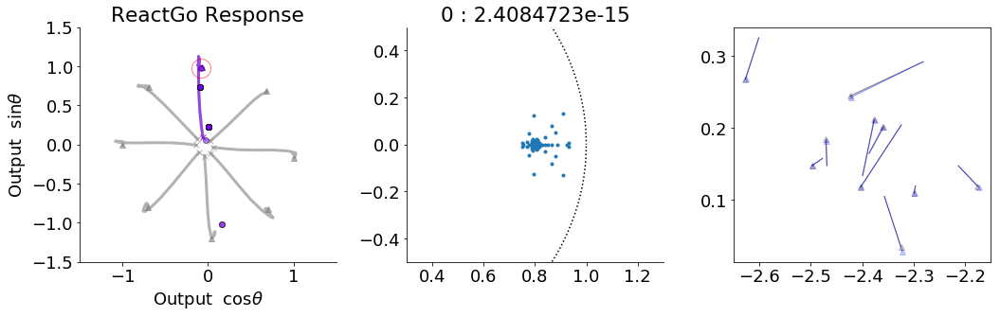

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/reactgo/go1_0.npz
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring 

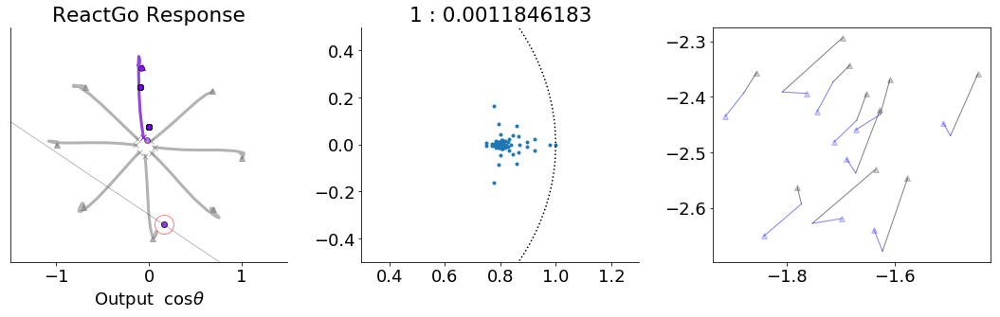

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/reactgo/go1_0.npz
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring 

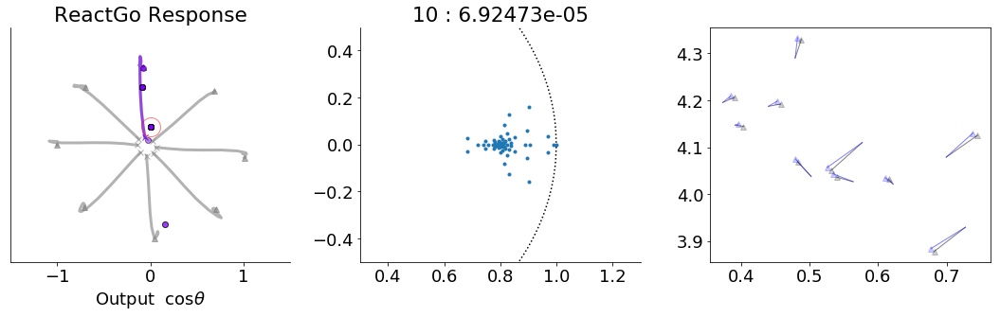

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/reactgo/go1_0.npz
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring 

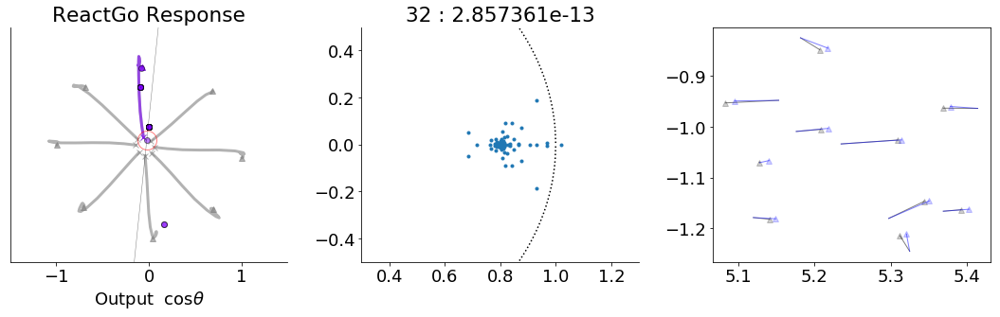

In [19]:
al = .8
lw = 1
t_num = 0
fp_epoch = 'go1'
qlim = 1
rule_ind = 1
rule_master = rules_dict['all'][rule_ind]
rand_step_coef = 0.1

filename = os.path.join(model_dir_all,'golub_fixed_pts',rule_master,fp_epoch+'_'+str(t_num)+'.npz')
fp_struct = np.load(filename)

D_use, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 4)
fp_inds = np.unique(np.concatenate(([np.argsort(fp_struct['qstar'])[0],],fp_inds)))
# fp_inds = [np.argsort(fp_struct['qstar'])[0],]
eig_decomps = comp_eig_decomp(fp_struct['J_xstar'][:,:,:])
    
S = np.shape(fp_struct['qstar'])[0]
xs = np.linspace(-1, 1, 1000)
ys = np.sqrt(1 - xs**2)

for s in fp_inds:
    fig = plt.figure(figsize=(15,5),tight_layout=True,facecolor='white')
    ax = plt.subplot(1,3,1)
    plot_fp_struct_multicolor(model_dir_all,[rule_ind],range(100),rule_master,w_out[:,1:],fp_epoch,axes_epoch,
                              do_plot_FP=1,t_num = t_num,qlim = qlim)
    plot_FP_specific(s,sorted_fps, w_out[:,1:].T, eig_decomps, c = 'r')
    plt.ylim((-1.5,1.5))    
    plt.xlim((-1.5,1.5))  
    plt.xlabel('Output ' + r' $\cos{\theta}$')

    if s==fp_inds[0]:
        plt.ylabel('Output ' + r' $\sin{\theta}$')
    else:
        ax.get_yaxis().set_visible(False)

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)  
    
    ax = plt.subplot(1,3,2)
    
#     plt.plot([1,1],[-.1,.1],':k')
    plt.plot(eig_decomps[s]['evals'].real,eig_decomps[s]['evals'].imag,'.')
    plt.plot(xs, ys,':k')
    plt.plot(xs, -ys,':k')
    plt.ylim((-.5,.5))    
    plt.xlim((.3,1.3))
    
    plt.title(str(s)+ ' : ' + str(fp_struct['qstar'][s]))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)  
    
    n_steps = 5
    ax = plt.subplot(1,3,3)
    trial = gen_trials_from_model_dir(model_dir_all,rule_master,mode='test',noise_on = False)
    T_inds = get_T_inds(trial,fp_epoch)
    x_t = np.matlib.repmat(trial.x[T_inds[1],s,:],n_steps,1)
    for jit in range(10):
        del_h = rand_step_coef*npr.randn(N)
        h0 = sorted_fps[s,:] + del_h
        
        #nonlinear system
        h_t = vanilla_run_with_h0(params, x_t, h0, alpha)
        jitter = np.dot(h_t,D_use)
        plt.plot(jitter[1,0],jitter[1,1],'^k',linewidth = .1,alpha = .2)
        plt.plot(jitter[:2,0],jitter[:2,1],'-k',linewidth = 1,alpha = .5)
        
        #linear system
        h1 = sorted_fps[s,:] + np.dot(fp_struct['J_xstar'][s,:,:],del_h)
        h_t = np.concatenate((h0[np.newaxis,:],h1[np.newaxis,:]),axis = 0)
        jitter = np.dot(h_t,D_use)
        plt.plot(jitter[1,0],jitter[1,1],'^b',linewidth = .1,alpha = .2)
        plt.plot(jitter[:2,0],jitter[:2,1],'-b',linewidth = 1,alpha = .5)

    plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt


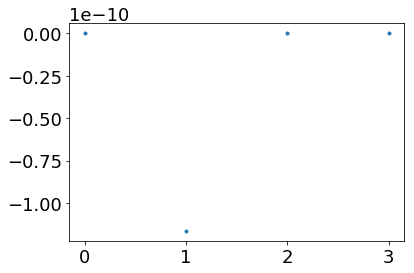

In [20]:
model = Model(model_dir_all)
with tf.Session() as sess:
    model.restore()
    model._sigma=0
    var_list = model.var_list
    params = [sess.run(var) for var in var_list]
    hparams = model.hp
    trial = generate_trials(rule, hparams, mode='test', noise_on=False)
    feed_dict = tools.gen_feed_dict(model, trial, hparams)
    
    initial_states = sorted_fps[fp_inds,:]
    initial_states_tf = tf.constant(initial_states, dtype=tf.float32)
    
    inputs = trial.x[T_inds[1:(len(fp_inds)+1)],t_num,:]
    inputs_tf = tf.constant(inputs, dtype=tf.float32)
    
    h, F = model.cell(inputs_tf, initial_states_tf)
    h_np, F_np = sess.run([h,F])
    
h0 = sorted_fps[fp_inds,:]
plt.plot(fp_struct['qstar'][fp_inds]-.5*LA.norm((h_np - h0),axis = 1)**2,'.')
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

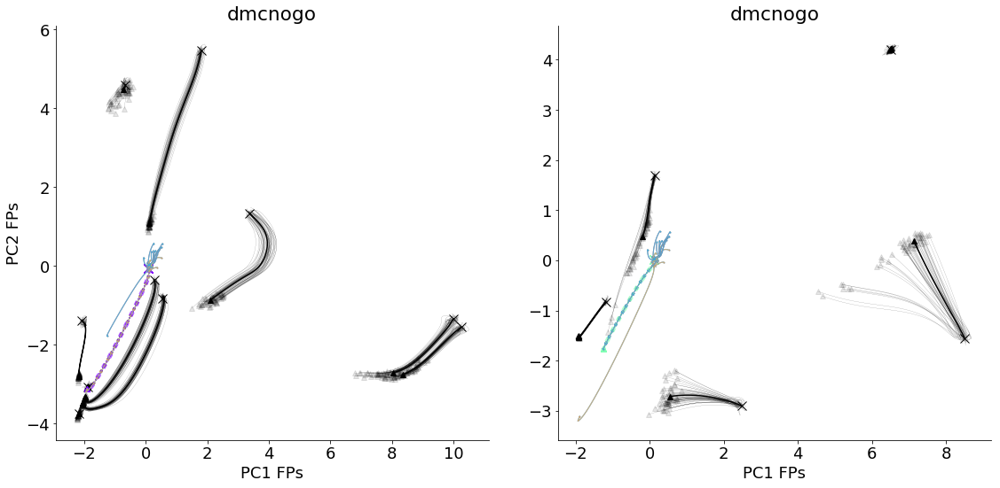

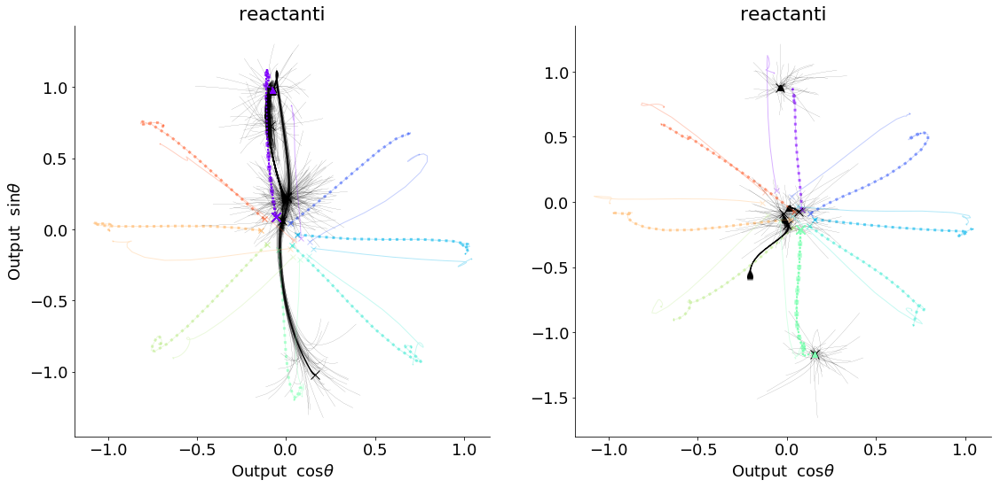

In [23]:
for fp_epoch in ['fix1','go1']:
    rule_set = ['reactgo','reactanti']
    
    t_num = 0

    fig = plt.figure(figsize=(16,8),tight_layout=True,facecolor='white')

    ax1 = plt.subplot(1,2,1)
    rule_master = rule_set[0]
    D_reactgo, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 10)
    
    if fp_epoch=='go1':
        w_in, b_in, w_out, b_out = get_model_params(m)
        D_use = w_out[:,1:]
        xlab = 'Output ' + r' $\cos{\theta}$'
        ylab = 'Output ' + r' $\sin{\theta}$'
        task_set = rule_set
    else:
        D_use = D_reactgo
        xlab = 'PC1 FPs'
        ylab = 'PC2 FPs'
        task_set = task_list
        
    for rule in task_set:
        plot_N_jitter(m,D_use,rule,fp_epoch,rand_step_coef = 0,n_steps = 100,n_jit = 0,
                       lw = 1,al = .3,linestyle = '-')
    plot_FP_jitter(model_dir_all,D_use,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,[rule_master,],
                   rand_step_coef = 0.05,linestyle = ':',n_steps = 100)

    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    plt.xlabel(xlab)
    plt.ylabel(ylab)

    ax2 = plt.subplot(1,2,2)
    rule_master = rule_set[1]
    _, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 5)
    
    for rule in task_set:
        plot_N_jitter(m,D_use,rule,fp_epoch,rand_step_coef = 0,n_steps = 100,n_jit = 0,
                       lw = 1,al = .3,linestyle = '-')
        plot_FP_jitter(model_dir_all,D_use,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,[rule_master,],
                   rand_step_coef = 0.05,linestyle = ':',n_steps = 100)

    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    plt.xlabel(xlab)
    plt.ylabel(' ')

    figpath = os.path.join(model_dir_all,'Output Prep Figure jitter','fp_jitter')
    figname = rule_set[0]+'_'+rule_set[1]+'_'+fp_epoch+'.pdf'
    if not os.path.exists(figpath):
        os.makedirs(figpath)
    plt.savefig(os.path.join(figpath,figname))
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

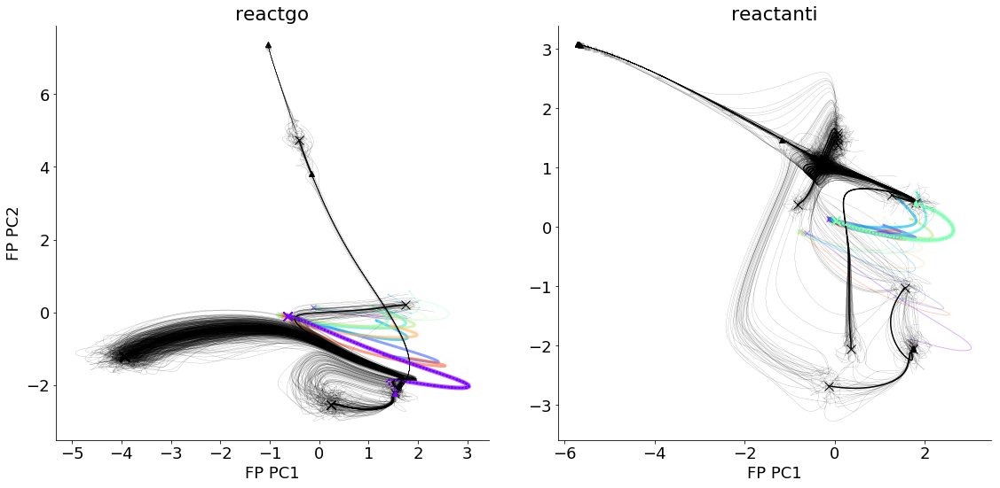

In [47]:
rule_set = ['reactgo','reactanti']
w_in, b_in, w_out, b_out = get_model_params(m)
D_use = w_out[:,1:]
t_num = 0

fig = plt.figure(figsize=(16,8),tight_layout=True,facecolor='white')

ax1 = plt.subplot(1,2,1)
rule_master = 'reactgo'
D_reactgo, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 20)
plot_N_jitter(m,D_reactgo,'reactanti',fp_epoch,rand_step_coef = 0,n_steps = 100,n_jit = 0,
                   lw = 1,al = .3,linestyle = '-')
plot_FP_jitter(model_dir_all,D_reactgo,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,[rule_master,],
               rand_step_coef = 0.15,n_steps = 500)

ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
plt.xlabel('FP PC1')
plt.ylabel('FP PC2')

ax2 = plt.subplot(1,2,2)
rule_master = 'reactanti'
_, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 20)
plot_N_jitter(m,D_reactgo,'reactgo',fp_epoch,rand_step_coef = 0,n_steps = 100,n_jit = 0,
                   lw = 1,al = .3,linestyle = '-')
plot_FP_jitter(model_dir_all,D_reactgo,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,[rule_master,],
               rand_step_coef = 0.15,linestyle = '-',n_steps = 500)


ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
plt.xlabel('FP PC1')
plt.ylabel(' ')

figpath = os.path.join(model_dir_all,'Output Prep Figure jitter','fp_jitter')
figname = 'reactgo_reactanti.pdf'
if not os.path.exists(figpath):
    os.makedirs(figpath)
plt.savefig(os.path.join(figpath,figname))
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

Text(0,0.5,'FP PC2')

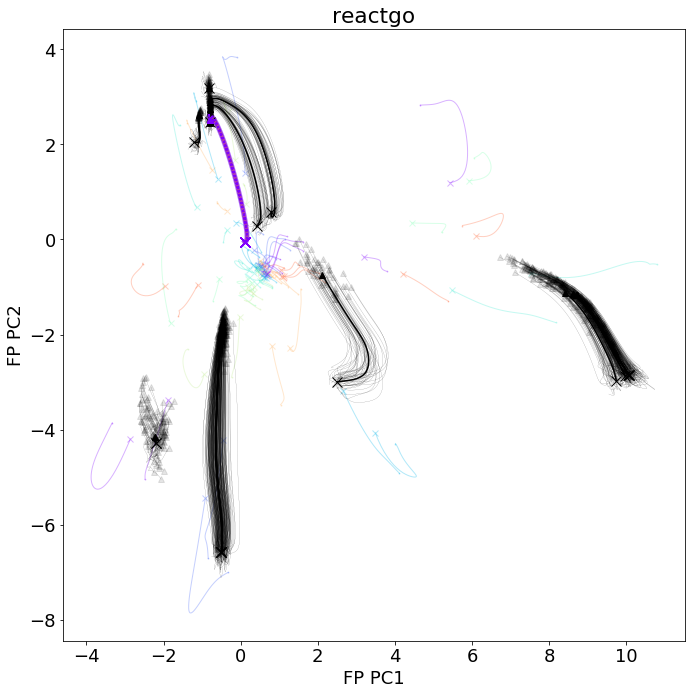

In [51]:
t_num = 0
fp_epoch = 'fix1'
rule_master = 'reactgo'
D_fps, sorted_fps, fp_inds = make_FP_pcs(m,rule_master,fp_epoch,t_num,n_fps = 20)

fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')
for rule in ['delaygo','delayanti','dmsgo','dmsnogo','delaydm1', 'delaydm2', 'contextdelaydm1', 
             'contextdelaydm2', 'multidelaydm']:
    plot_N_jitter(m,D_fps,rule,'delay1',rand_step_coef = 0,n_steps = 100,n_jit = 0,
                   lw = 1,al = .3,linestyle = '-')
    
plot_FP_jitter(model_dir_all,D_fps,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,[rule_master,],
               rand_step_coef = 0.1,n_steps = 100)

ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
plt.xlabel('FP PC1')
plt.ylabel('FP PC2')

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt


Text(0,0.5,'FP PC2')

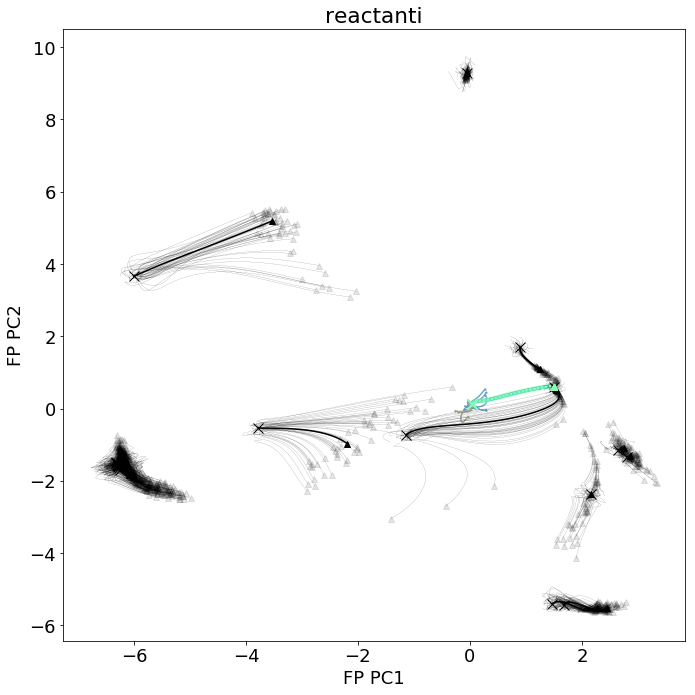

In [49]:
t_num = 0
fp_epoch = 'fix1'
rule_master = 'reactanti'
D_fps, sorted_fps, fp_inds = make_FP_pcs(m,rule_master,fp_epoch,t_num,n_fps = 20)

fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')
for rule in task_list:
    plot_N_jitter(m,D_fps,rule,fp_epoch,rand_step_coef = 0,n_steps = 100,n_jit = 0,
                   lw = 1,al = .3,linestyle = '-')
    
plot_FP_jitter(model_dir_all,D_fps,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,[rule_master,],
               rand_step_coef = 0.1,n_steps = 100)

ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
plt.xlabel('FP PC1')
plt.ylabel('FP PC2')

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

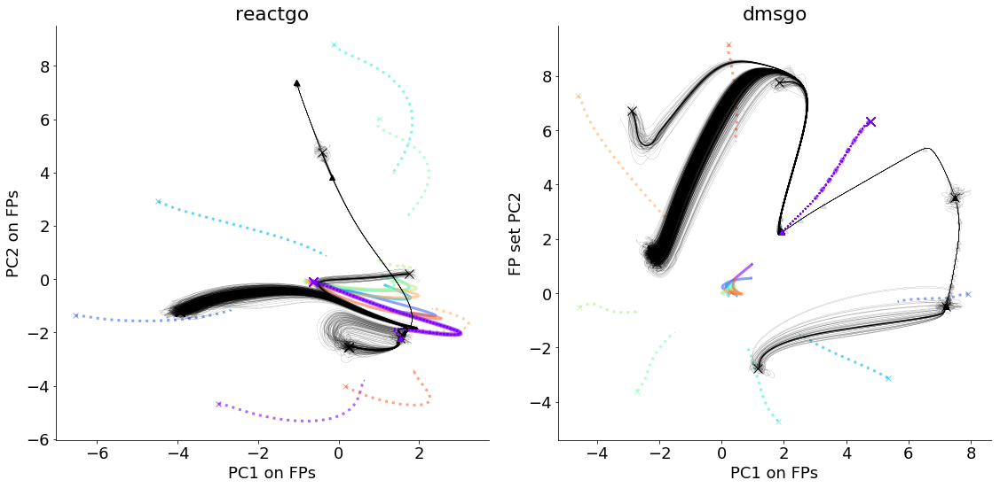

In [120]:
rule_set = ['reactgo','dmsgo']
w_in, b_in, w_out, b_out = get_model_params(m)
D_use = w_out[:,1:]
t_num = 0

fig = plt.figure(figsize=(16,8),tight_layout=True,facecolor='white')

ax1 = plt.subplot(1,2,1)
rule_master = rule_set[0]
D_reactgo, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 20)
plot_N_jitter(m,D_reactgo,rule_set[1],rand_step_coef = 0,n_steps = 100,n_jit = 0,
                   lw = 3,al = .6,linestyle = ':')
plot_FP_jitter(m,D_reactgo,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,[rule_master,],
               rand_step_coef = 0.1,n_steps = 500)

ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
plt.xlabel('PC1 on FPs')
plt.ylabel('PC2 on FPs')

ax2 = plt.subplot(1,2,2)
rule_master = rule_set[1]
D_dmsgo, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 20)
plot_N_jitter(m,D_dmsgo,rule_set[0],rand_step_coef = 0,n_steps = 100,n_jit = 0,
                   lw = 3,al = .6,linestyle = '-')
plot_FP_jitter(m,D_dmsgo,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,[rule_master,],
               rand_step_coef = 0.1,linestyle = ':',n_steps = 500)


ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
plt.xlabel('PC1 on FPs')

figpath = os.path.join(model_dir_all,'Output Prep Figure jitter','fp_jitter')
figname = rule_set[0]+'_'+rule_set[1]+'.pdf'
if not os.path.exists(figpath):
    os.makedirs(figpath)
plt.savefig(os.path.join(figpath,figname))
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

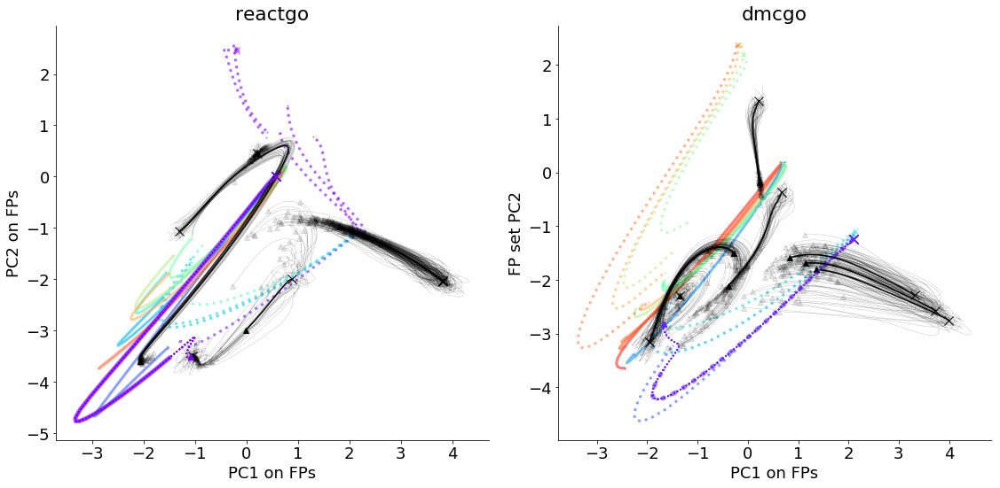

In [133]:
rule_set = ['reactgo','dmcgo']
w_in, b_in, w_out, b_out = get_model_params(m)
D_use = w_out[:,1:]
t_num = 0

fig = plt.figure(figsize=(16,8),tight_layout=True,facecolor='white')

ax1 = plt.subplot(1,2,1)
rule_master = rule_set[0]
D_reactgo, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 8)
plot_N_jitter(m,D_dmsgo,rule_set[1],fp_epoch,rand_step_coef = 0,n_steps = 100,n_jit = 0,
                   lw = 3,al = .6,linestyle = ':',mode = 'random', batch_size =100)
plot_FP_jitter(m,D_dmsgo,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,[rule_master,],
               rand_step_coef = 0.1,n_steps = 70)

ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)
plt.xlabel('PC1 on FPs')
plt.ylabel('PC2 on FPs')

ax2 = plt.subplot(1,2,2)
rule_master = rule_set[1]
D_dmcgo, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 8)
plot_N_jitter(m,D_dmsgo,rule_set[0],fp_epoch,rand_step_coef = 0,n_steps = 100,n_jit = 0,
                   lw = 3,al = .6,linestyle = '-',mode = 'random', batch_size =100)
plot_FP_jitter(m,D_dmsgo,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,[rule_master,],
               rand_step_coef = 0.1,linestyle = ':',n_steps = 70)


ax2.spines['right'].set_visible(False)
ax2.spines['top'].set_visible(False)
plt.xlabel('PC1 on FPs')

figpath = os.path.join(model_dir_all,'Output Prep Figure jitter','fp_jitter')
figname = rule_set[0]+'_'+rule_set[1]+'.pdf'
if not os.path.exists(figpath):
    os.makedirs(figpath)
plt.savefig(os.path.join(figpath,figname))
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

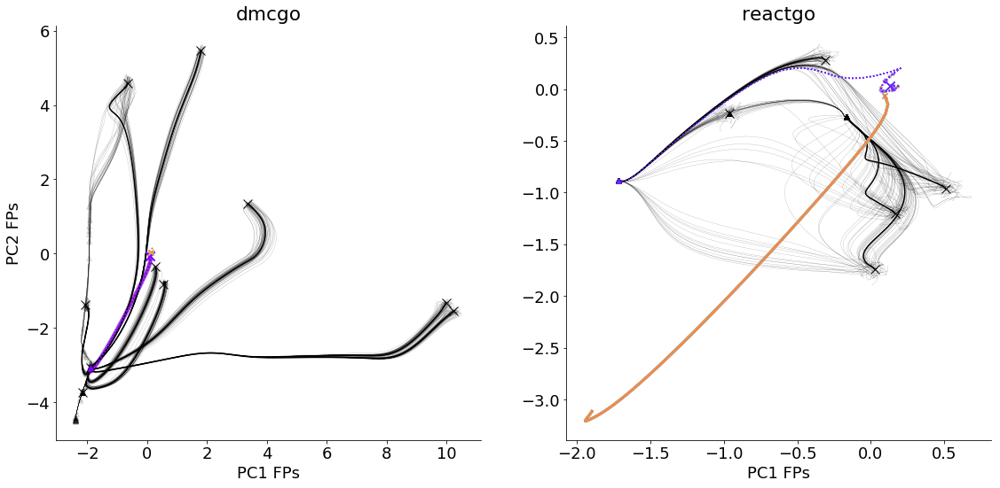

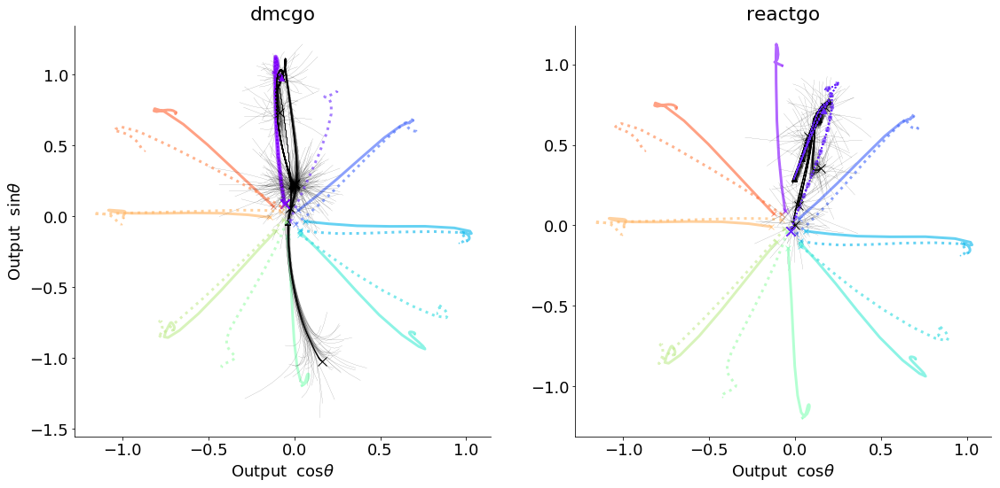

In [135]:
for fp_epoch in ['fix1','go1']:
    rule_set = ['reactgo','dmcgo']
    
    t_num = 0

    fig = plt.figure(figsize=(16,8),tight_layout=True,facecolor='white')

    ax1 = plt.subplot(1,2,1)
    rule_master = rule_set[0]
    D_reactgo, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 10)
    
    if fp_epoch=='go1':
        w_in, b_in, w_out, b_out = get_model_params(m)
        D_use = w_out[:,1:]
        xlab = 'Output ' + r' $\cos{\theta}$'
        ylab = 'Output ' + r' $\sin{\theta}$'
    else:
        D_use = D_reactgo
        xlab = 'PC1 FPs'
        ylab = 'PC2 FPs'
        
    plot_FP_jitter(model_dir_all,D_use,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,[rule_master,],
                   rand_step_coef = 0.05,n_steps = 100)
    plot_N_jitter(m,D_use,rule_set[1],fp_epoch,rand_step_coef = 0,n_steps = 100,n_jit = 0,
                       lw = 3,al = .6,linestyle = ':')

    ax1.spines['right'].set_visible(False)
    ax1.spines['top'].set_visible(False)
    plt.xlabel(xlab)
    plt.ylabel(ylab)

    ax2 = plt.subplot(1,2,2)
    rule_master = rule_set[1]
    _, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 5)
    plot_FP_jitter(model_dir_all,D_use,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,[rule_master,],
                   rand_step_coef = 0.05,linestyle = ':',n_steps = 100)
    plot_N_jitter(m,D_use,rule_set[0],fp_epoch,rand_step_coef = 0,n_steps = 100,n_jit = 0,
                       lw = 3,al = .6,linestyle = '-')

    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    plt.xlabel(xlab)
    plt.ylabel(' ')

    figpath = os.path.join(model_dir_all,'Output Prep Figure jitter','fp_jitter')
    figname = rule_set[0]+'_'+rule_set[1]+'_'+fp_epoch+'.pdf'
    if not os.path.exists(figpath):
        os.makedirs(figpath)
    plt.savefig(os.path.join(figpath,figname))
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

/Users/lauradriscoll/anaconda2/envs/tensorflow/lib/python2.7/site-packages/sklearn/linear_model/base.py:485: RuntimeWarning: internal gelsd driver lwork query error, required iwork dimension not returned. This is likely the result of LAPACK bug 0038, fixed in LAPACK 3.2.2 (released July 21, 2010). Falling back to 'gelss' driver.
  linalg.lstsq(X, y)


Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt


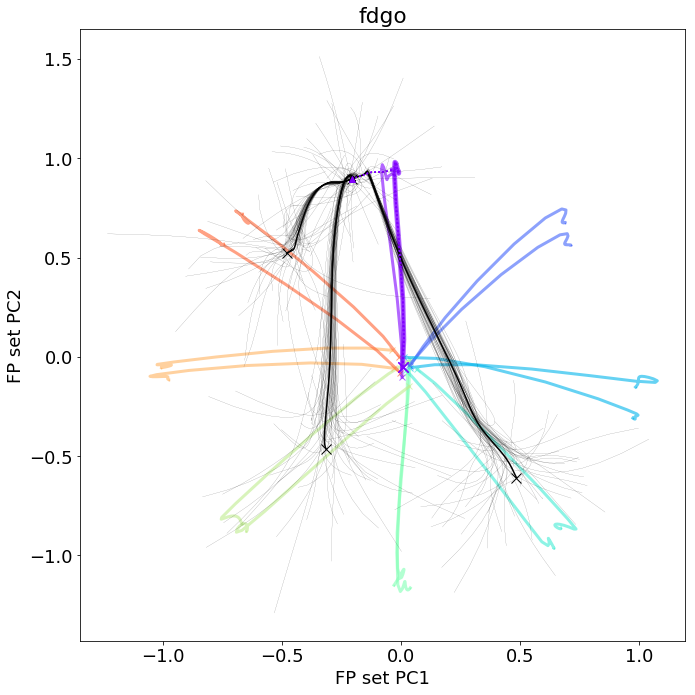

In [46]:
rule_set = ['fdgo','fdanti']
rule_master = rule_set[0]

w_in, b_in, w_out, b_out = get_model_params(m)
t_num = 0
D_reactgo, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num)
D_stim = make_axes(model_dir_all,rule_master,fp_epoch)
filename = os.path.join(model_dir_all,'golub_fixed_pts',rule_master,fp_epoch+'_'+str(t_num)+'.npz')
# fp_struct = np.load(filename)
# fp_inds = [np.argsort(fp_struct['qstar'])[0],]
fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')
plot_FP_jitter(model_dir_all,w_out[:,1:],rule_master,t_num,fp_epoch,sorted_fps,fp_inds,rule_set,rand_step_coef = 0.1)
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

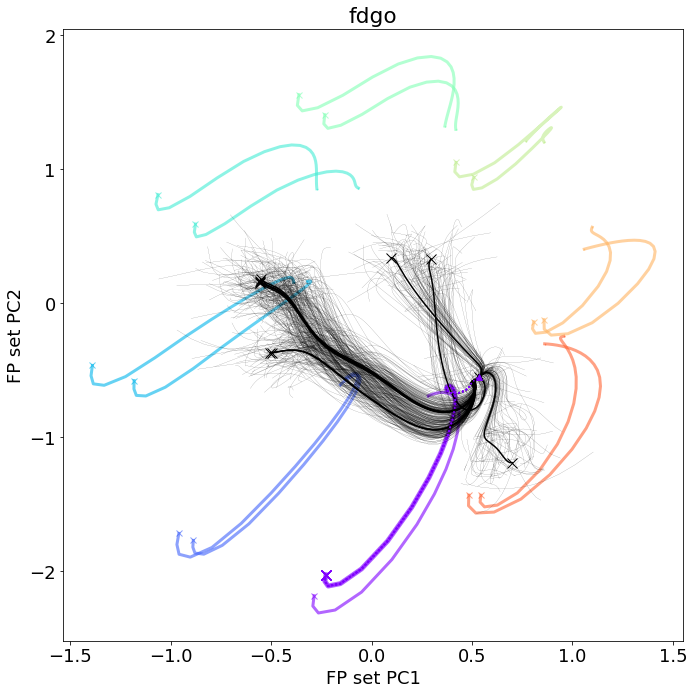

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt


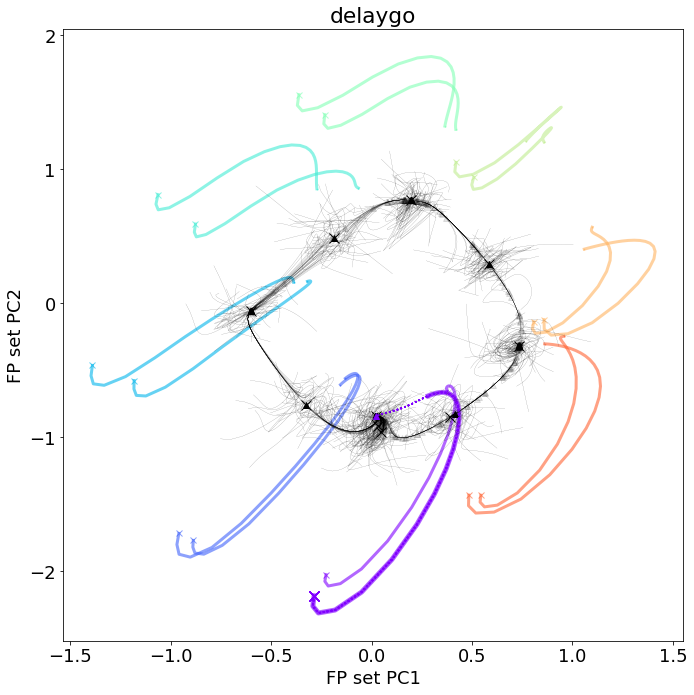

In [68]:
rule_set = ['fdgo','delaygo']
rule_master = rule_set[0]

w_in, b_in, w_out, b_out = get_model_params(m)
t_num = 0
D_reactgo, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 10)
D_stim = make_axes(model_dir_all,rule_master,fp_epoch)
filename = os.path.join(model_dir_all,'golub_fixed_pts',rule_master,fp_epoch+'_'+str(t_num)+'.npz')
# fp_struct = np.load(filename)
# fp_inds = [np.argsort(fp_struct['qstar'])[0],]
fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')
plot_FP_jitter(model_dir_all,D_stim,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,rule_set,rand_step_coef = 0.15,n_steps = 500)
plt.show()

rule_set = ['fdgo','delaygo']
rule_master = rule_set[1]

_, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 10)
fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')
plot_FP_jitter(model_dir_all,D_stim,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,rule_set,rand_step_coef = 0.15,n_steps = 500)
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

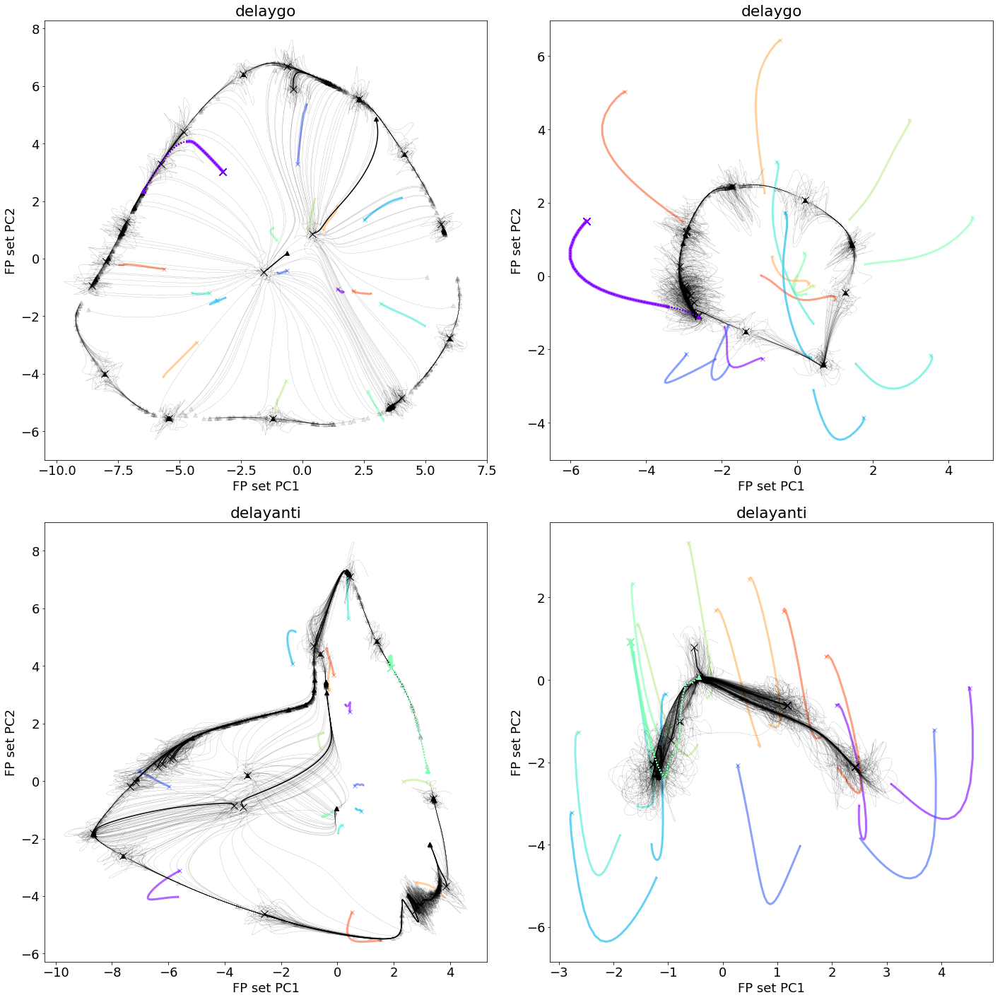

In [52]:
rule_set = ['delaygo','delayanti']
epoch_set = ['delay1','go1']
w_in, b_in, w_out, b_out = get_model_params(m)
t_num = 0

fig = plt.figure(figsize=(20,20),tight_layout=True,facecolor='white')

for fpi in range(len(epoch_set)):
    
    fp_epoch = epoch_set[fpi]

    rule_master = rule_set[0]
    D_A, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 20)
    plt.subplot(2,2,fpi+1)
    plot_FP_jitter(model_dir_all,D_A,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,rule_set,
                   rand_step_coef = 0.2,n_steps = 500)
    
    rule_master = rule_set[1]
    D_B, sorted_fps, fp_inds = make_FP_pcs(model_dir_all,rule_master,fp_epoch,t_num,n_fps = 20)
    plt.subplot(2,2,fpi+3)
    plot_FP_jitter(model_dir_all,D_B,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,rule_set,
                   rand_step_coef = 0.2,n_steps = 500)
    
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/m

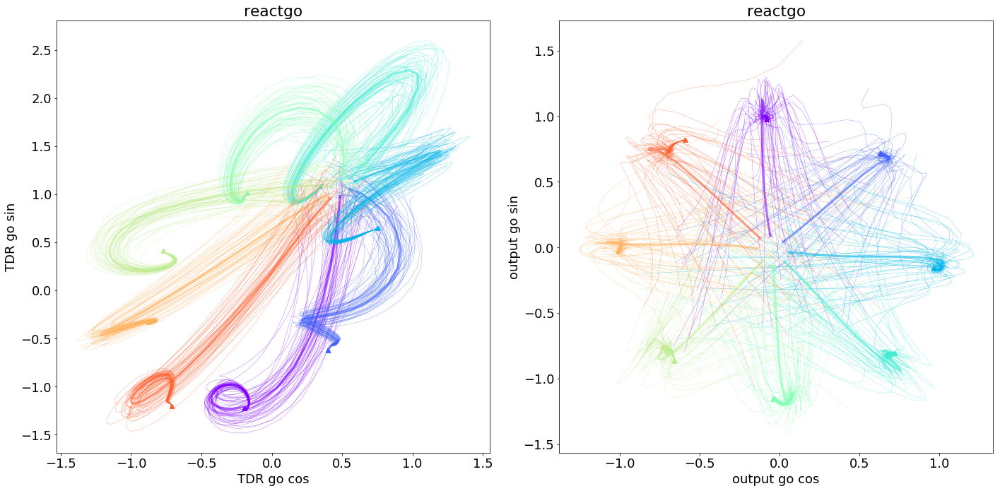

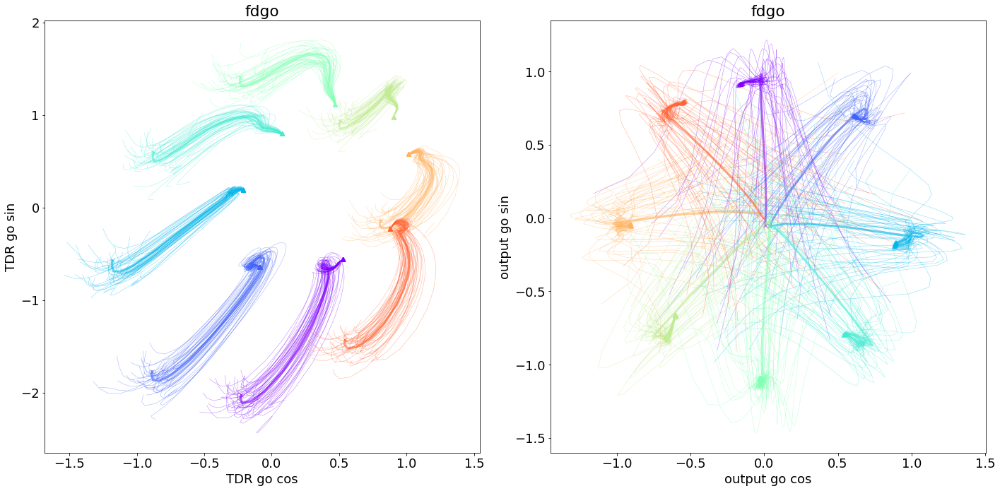

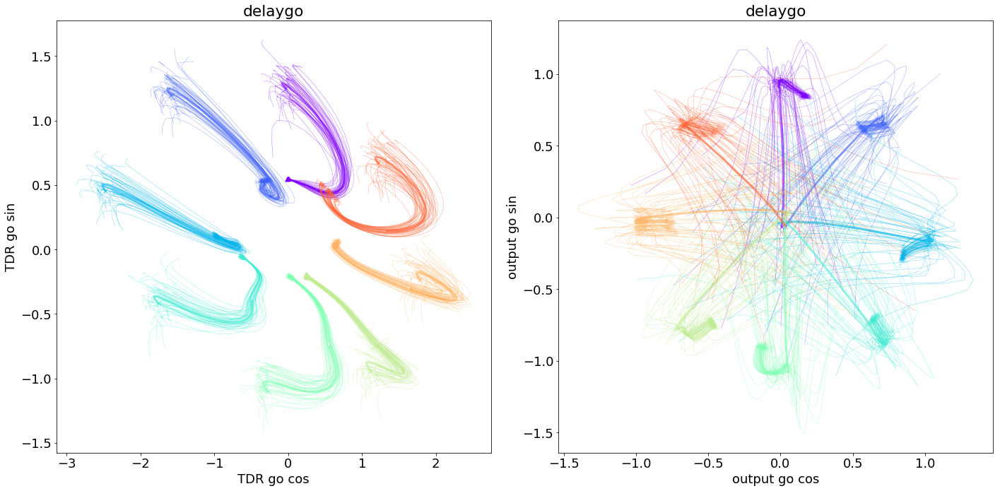

In [71]:
fig_size_fac = 10
rule_set = ['reactgo','fdgo','delaygo']
# fig = plt.figure(figsize=(fig_size_fac*len(rule_set),fig_size_fac),tight_layout=True,facecolor='white')

for ri in range(len(rule_set)):
    fig = plt.figure(figsize=(2*fig_size_fac,fig_size_fac),tight_layout=True,facecolor='white')
    
    rule = rule_set[ri]
    D_epoch = make_axes(model_dir_all,rule,fp_epoch)
    
    plt.subplot(1,2,1)
    plot_N_jitter(m,D_epoch,rule,rand_step_coef = 0.15,n_steps = 130,n_jit = 50)
    plt.xlabel('TDR go cos')
    plt.ylabel('TDR go sin')
    
    plt.subplot(1,2,2)
    plot_N_jitter(m,w_out[:,1:],rule,rand_step_coef = 0.15,n_steps = 70,n_jit = 50)
    plt.xlabel('output go cos')
    plt.ylabel('output go sin')
    
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/model.ckpt
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/

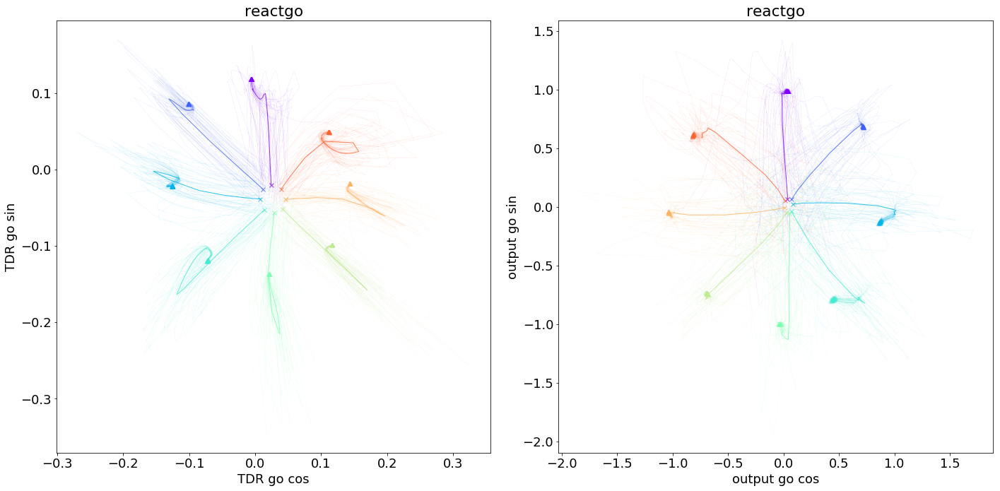

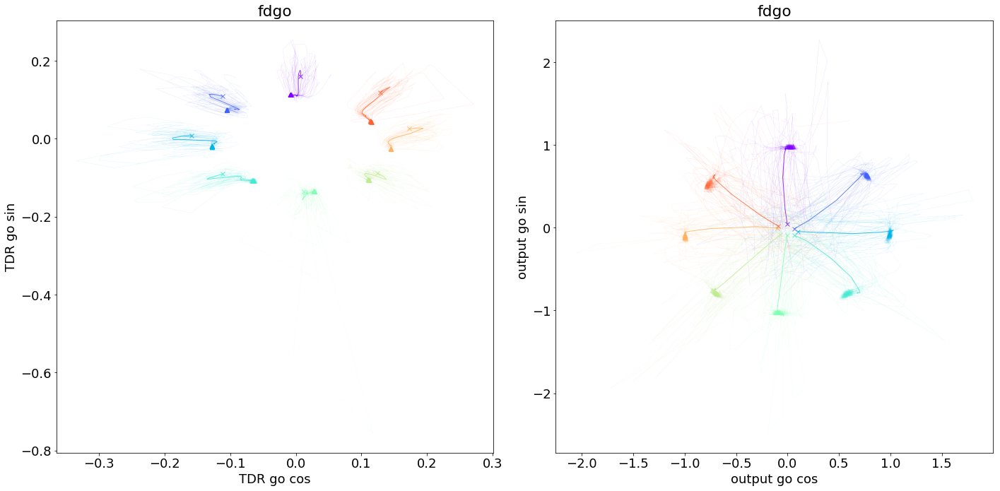

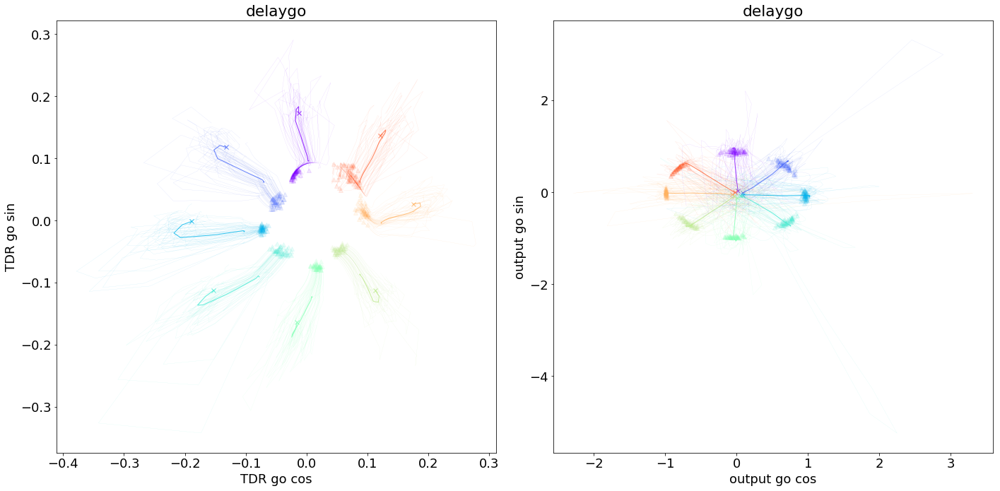

In [139]:
fig_size_fac = 10
rule_set = ['reactgo','fdgo','delaygo']
# fig = plt.figure(figsize=(fig_size_fac*len(rule_set),fig_size_fac),tight_layout=True,facecolor='white')

for ri in range(len(rule_set)):
    fig = plt.figure(figsize=(2*fig_size_fac,fig_size_fac),tight_layout=True,facecolor='white')
    
    rule = rule_set[ri]
    D_epoch = make_axes(model_dir_all,rule,fp_epoch)
    
    plt.subplot(1,2,1)
    plot_N_jitter(m,D_epoch,rule,t_num,rand_step_coef = 0.015,n_steps = 130,n_jit = 50)
    plt.xlabel('TDR go cos')
    plt.ylabel('TDR go sin')
    
    plt.subplot(1,2,2)
    plot_N_jitter(m,w_out[:,1:],rule,t_num,rand_step_coef = 0.015,n_steps = 70,n_jit = 50)
    plt.xlabel('output go cos')
    plt.ylabel('output go sin')
    
plt.show()

In [ ]:
fig_size_fac = 10
rule_set = ['reactgo','fdgo','delaygo']
# fig = plt.figure(figsize=(fig_size_fac*len(rule_set),fig_size_fac),tight_layout=True,facecolor='white')

for ri in range(len(rule_set)):
    fig = plt.figure(figsize=(fig_size_fac,fig_size_fac),tight_layout=True,facecolor='white')
    rule = rule_set[ri]
    D_epoch = make_axes(model_dir_all,rule,fp_epoch)
    plot_N_jitter(m,D_use,rule,t_num,rand_step_coef = 0.01,n_steps = 500,n_jit = 50)
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/model.ckpt
either
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/soft

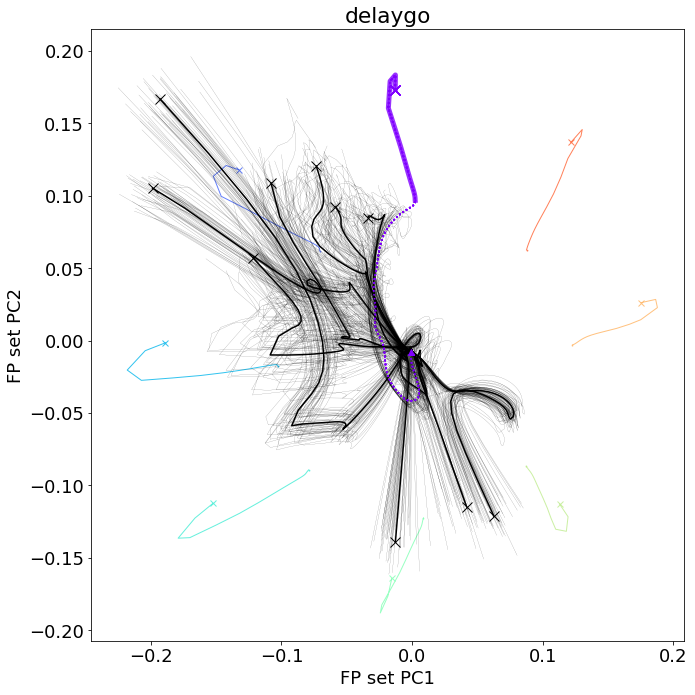

In [117]:
rule_set = ['delaygo',]
rule_master = 'delaygo'
# D_stim = make_axes(model_dir_all,rule_master,fp_epoch)

t_num = 0
D_delaygo, sorted_fps, fp_inds = make_FP_pcs(m,rule_master,fp_epoch,t_num,n_fps = 10)

D_epoch = make_axes(model_dir_all,rule_master,fp_epoch)

fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')
plot_FP_jitter(m,D_epoch,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,rule_set,rand_step_coef = 0.01)
# plt.xlim([-.2,.2])
# plt.ylim([-.2,.2])
plt.show()

In [ ]:
rule_set = ['delaygo',]
rule_master = 'delaygo'
# D_stim = make_axes(model_dir_all,rule_master,fp_epoch)

t_num = 0
D_delaygo, sorted_fps, fp_inds = make_FP_pcs(m,rule_master,fp_epoch,t_num,n_fps = 10)

D_epoch = make_axes(model_dir_all,rule_master,fp_epoch)

fig = plt.figure(figsize=(10,10),tight_layout=True,facecolor='white')
plot_FP_jitter(m,D_epoch,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,rule_set,rand_step_coef = 0.01)
# plt.xlim([-.2,.2])
# plt.ylim([-.2,.2])
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt


/Users/lauradriscoll/anaconda2/envs/tensorflow/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

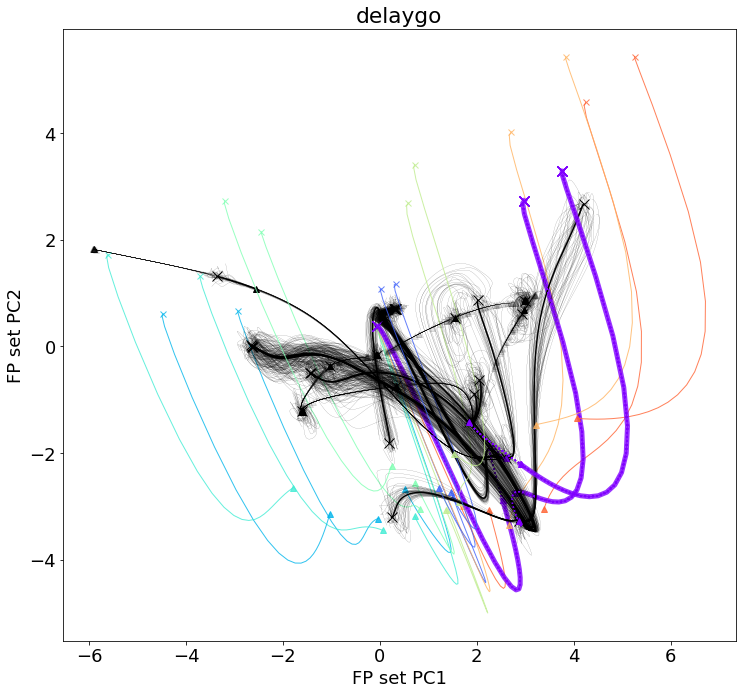

In [207]:
rule_set = ['fdgo',]
rule_master = 'fdgo'
t_num = 0
D_use, sorted_fps, fp_inds = make_FP_pcs(m,rule_master,fp_epoch,t_num)

rule_set_all = ['reactgo','fdgo','delaygo']

fig = plt.figure(figsize=(10*len(rule_set_all),10),tight_layout=True,facecolor='white')
for rule_master in rule_set_all:
    rule_set = [rule_master,]

    _, sorted_fps, fp_inds = make_FP_pcs(m,rule_master,fp_epoch,t_num)
    
    ax = plt.subplot(1,len(rule_set_all),1)
    plot_FP_jitter(m,D_use,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,rule_set)
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

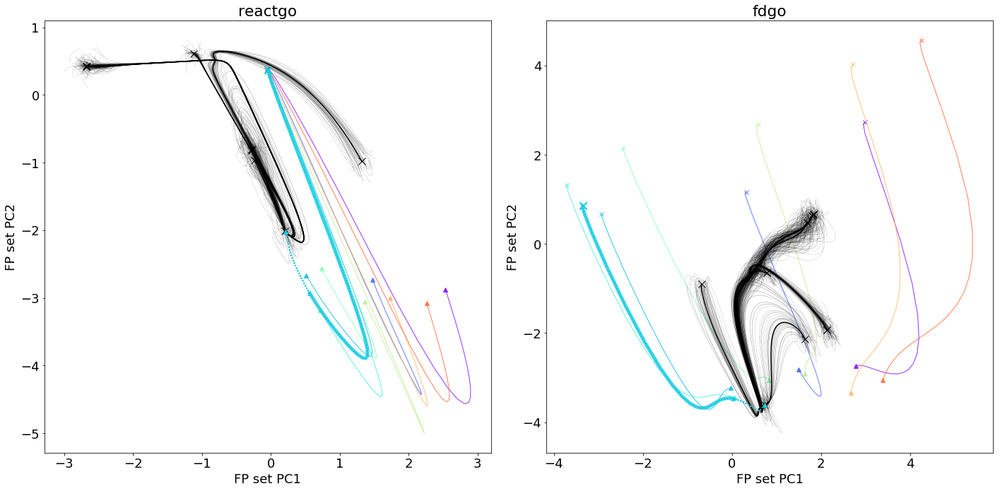

In [213]:
rule_set = ['fdgo',]
rule_master = 'fdgo'
t_num = 120
D_use, sorted_fps, fp_inds = make_FP_pcs(m,rule_master,fp_epoch,0)

rule_set_all = ['reactgo','fdgo',]

fig = plt.figure(figsize=(10*len(rule_set_all),10),tight_layout=True,facecolor='white')

for ri in range(len(rule_set_all)):
    rule_master = rule_set_all[ri]
    rule_set = [rule_master,]

    _, sorted_fps, fp_inds = make_FP_pcs(m,rule_master,fp_epoch,t_num)
    
    ax = plt.subplot(1,len(rule_set_all),ri+1)
    plot_FP_jitter(m,D_use,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,rule_set)
    
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model resto

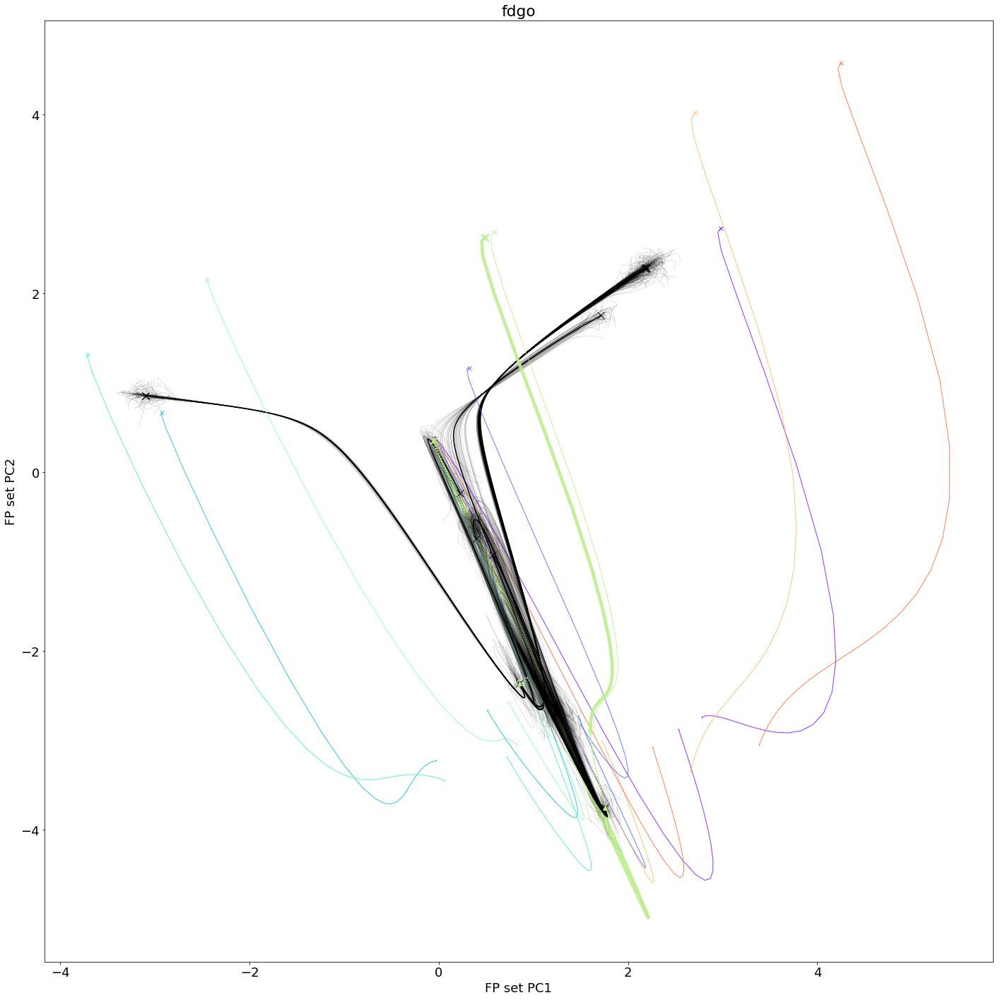

In [61]:
t_num = 248
D_use = D_fdgo
rule_set_all = ['reactgo','fdgo',]

fig = plt.figure(figsize=(20,20),tight_layout=True,facecolor='white')

for ri in range(len(rule_set_all)):
    rule_master = rule_set_all[ri]
    rule_set = [rule_master,]

    _, sorted_fps, fp_inds = make_FP_pcs(m,rule_master,fp_epoch,t_num)
    
#     ax = plt.subplot(1,len(rule_set_all),ri+1)
    plot_FP_jitter(m,D_use,rule_master,t_num,fp_epoch,sorted_fps,fp_inds,rule_set)
    
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt
Model restored from file: /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/model.ckpt


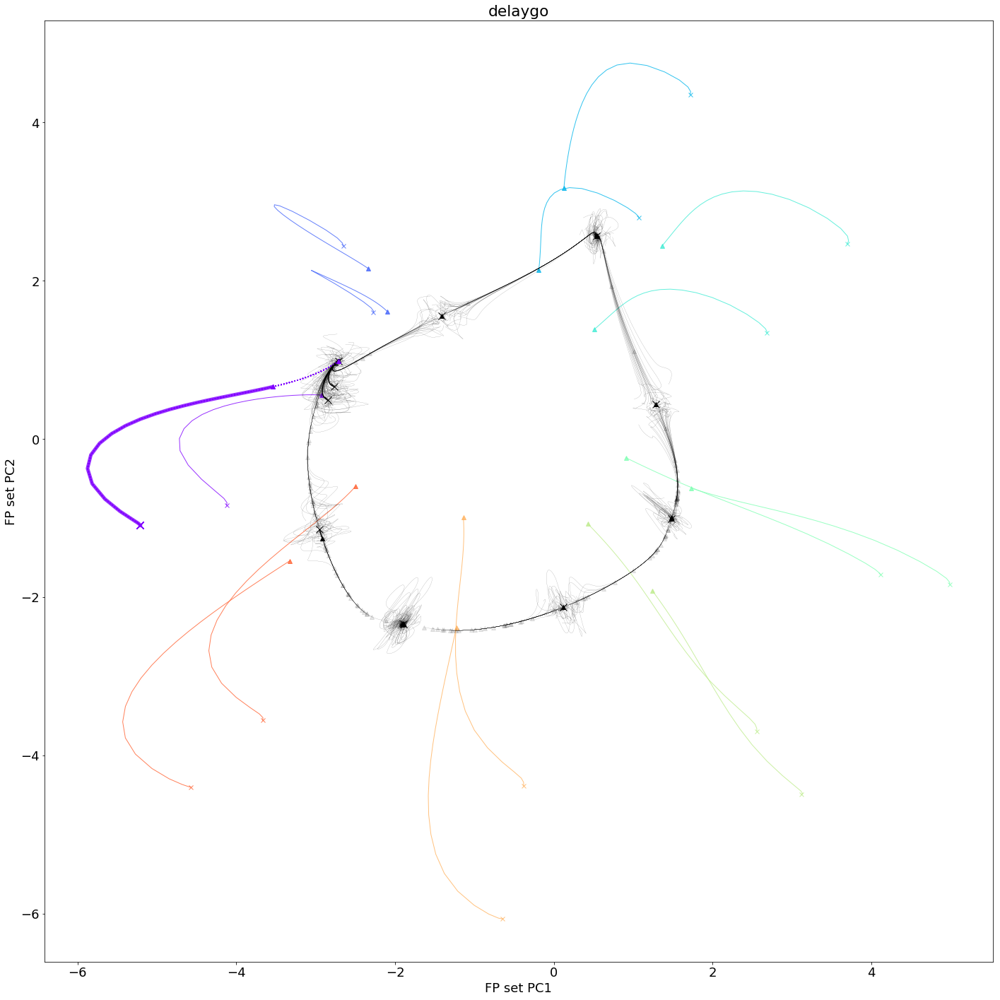

In [187]:
rule_set = ['fdgo','delaygo']
rule_master = rule_set[1]

D_pca, sorted_fps, fp_inds = make_FP_pcs(m,rule_master,fp_epoch,t_num)

fig = plt.figure(figsize=(20,20),tight_layout=True,facecolor='white')
plot_FP_jitter(m,D_pca,rule_master,t_num,fp_epoch,rule_set)
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


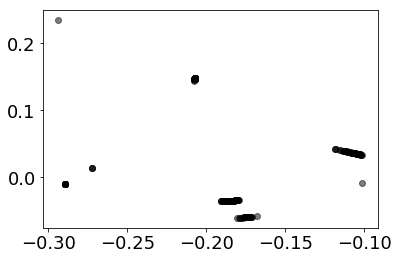

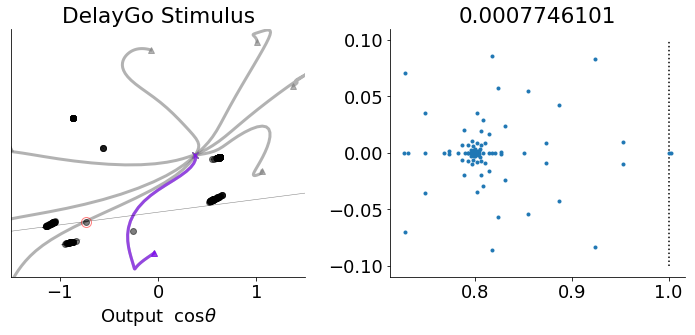

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


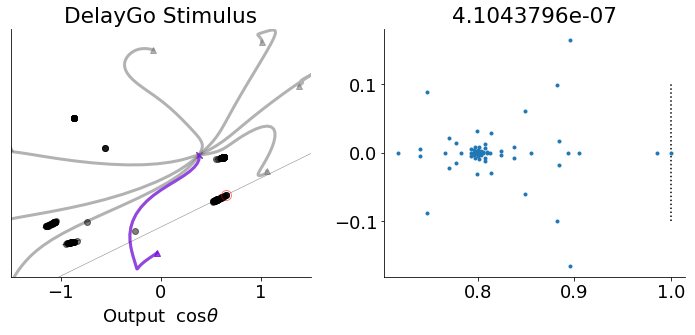

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


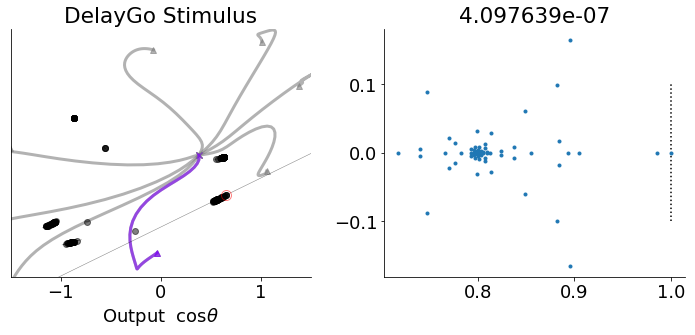

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


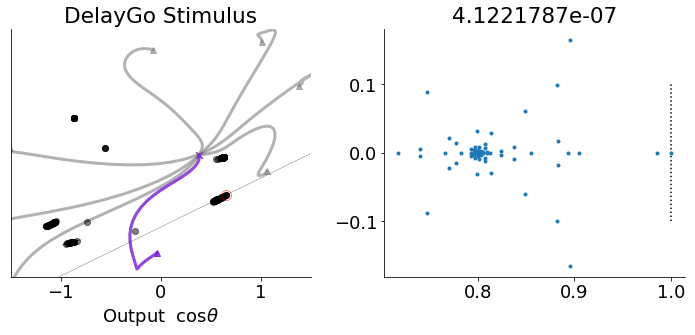

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


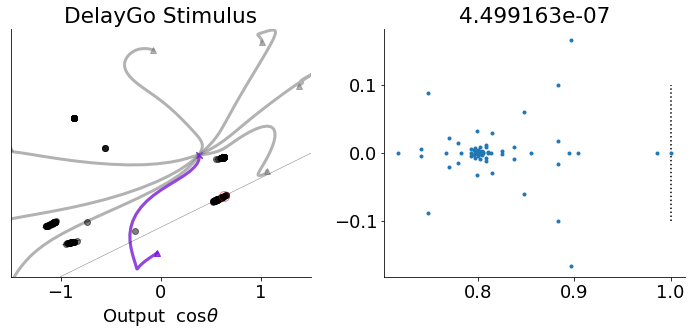

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


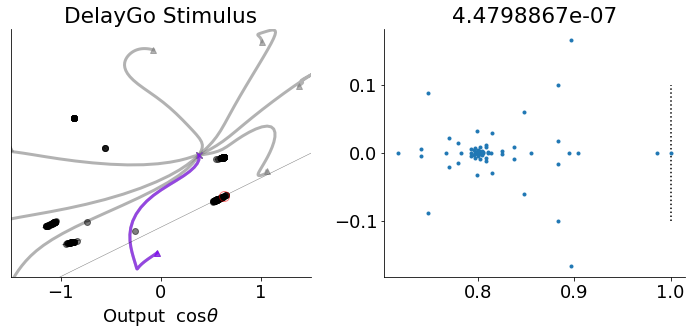

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


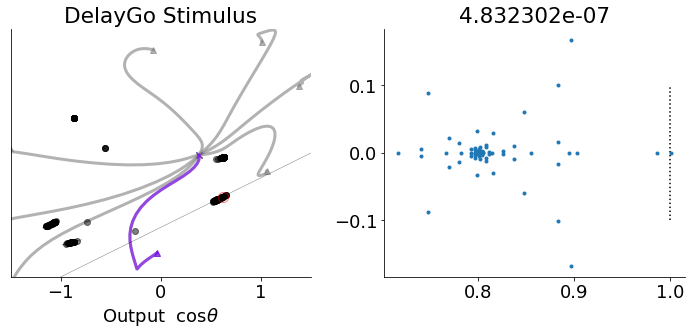

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


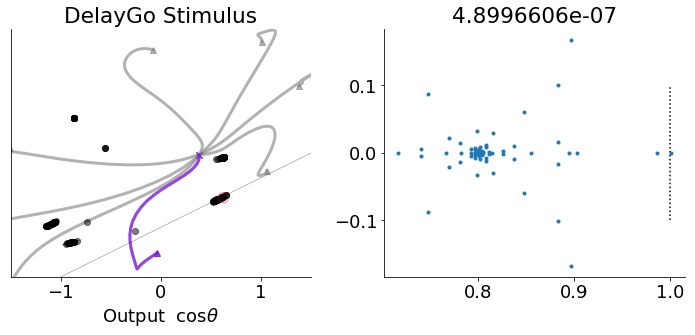

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


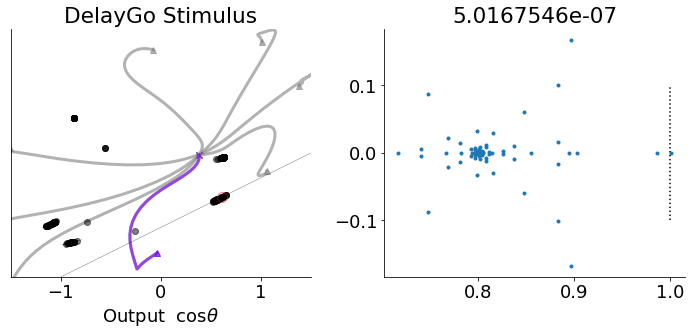

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


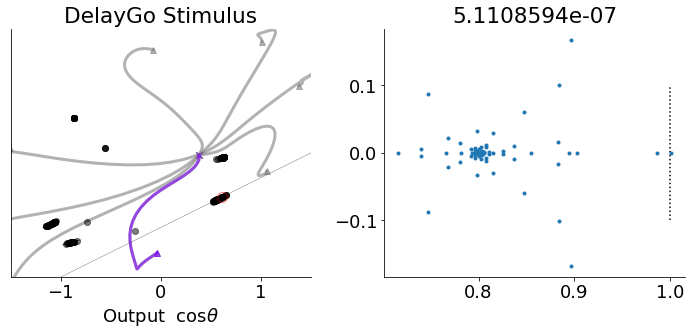

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


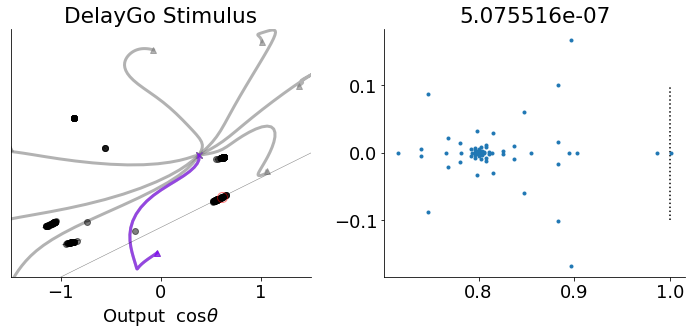

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


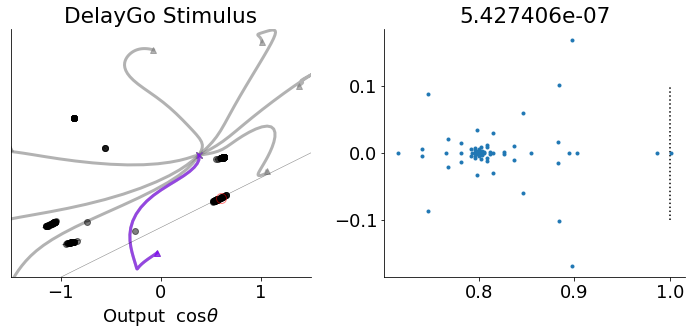

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


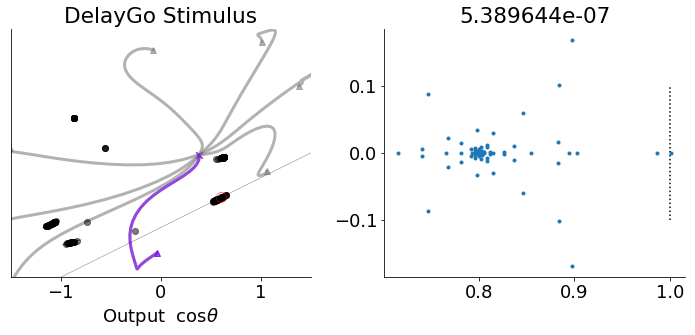

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


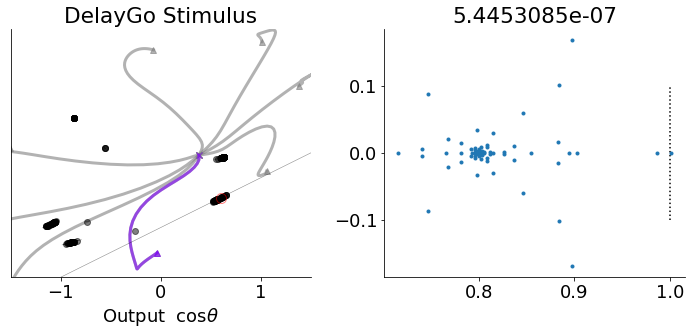

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


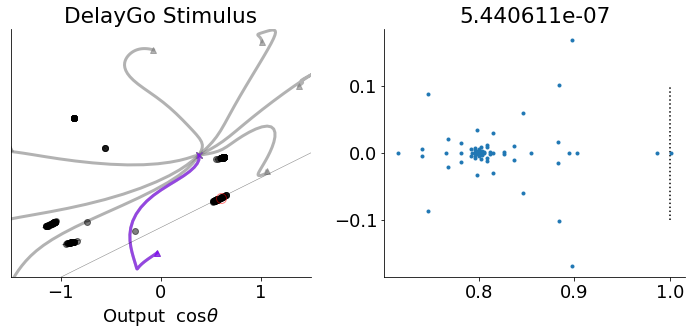

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


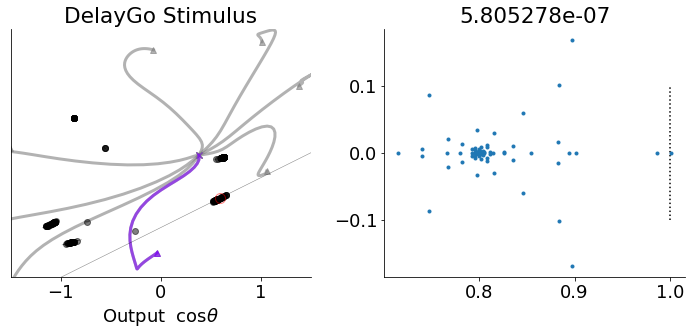

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


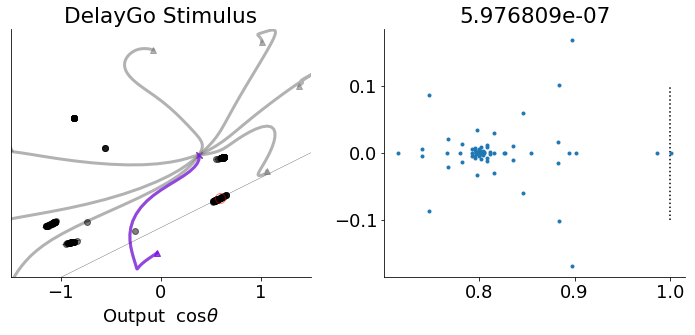

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


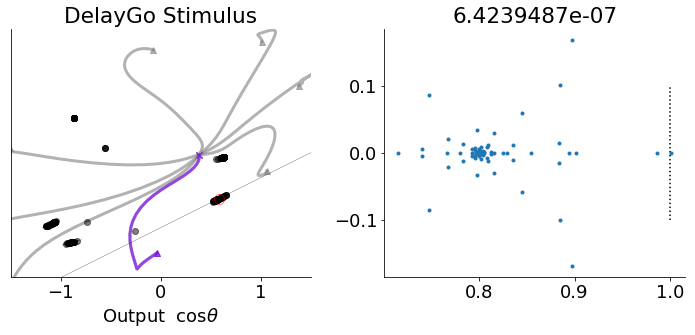

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


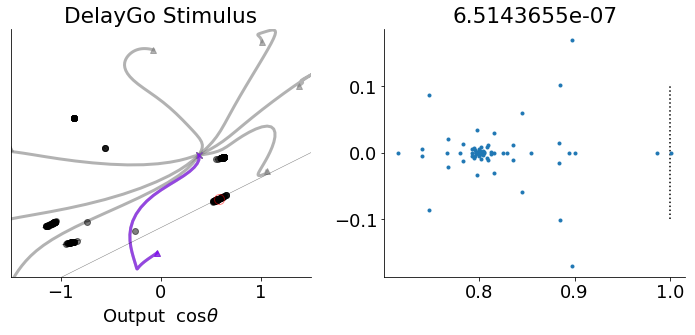

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


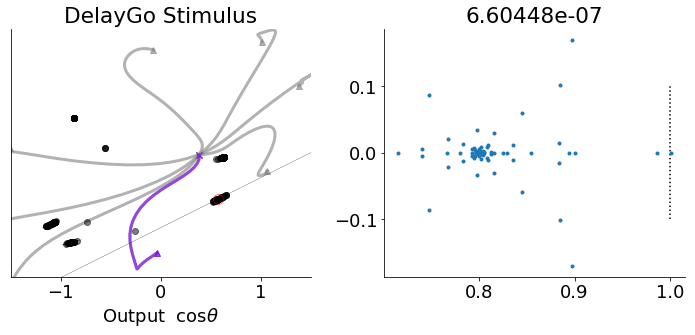

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


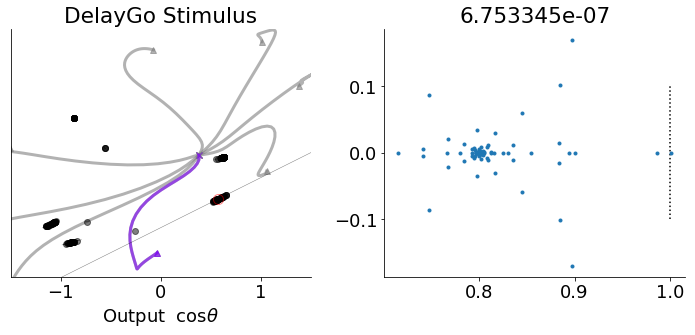

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


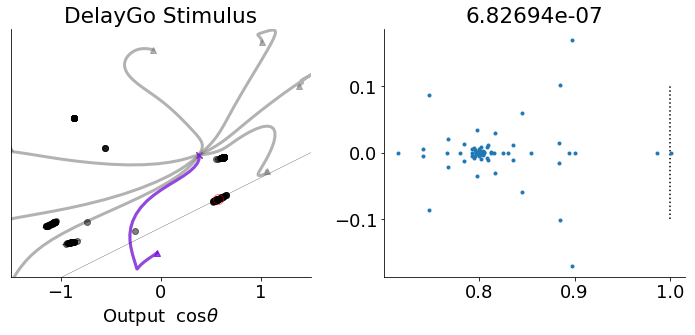

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


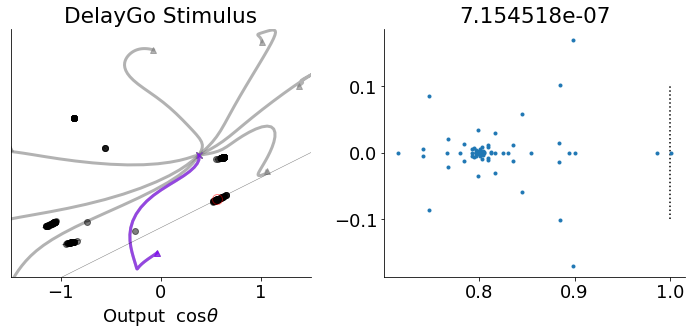

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


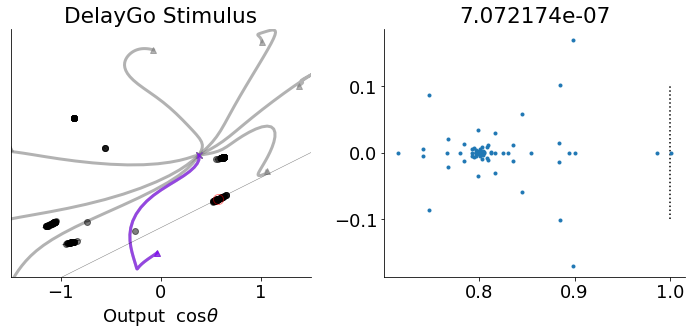

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


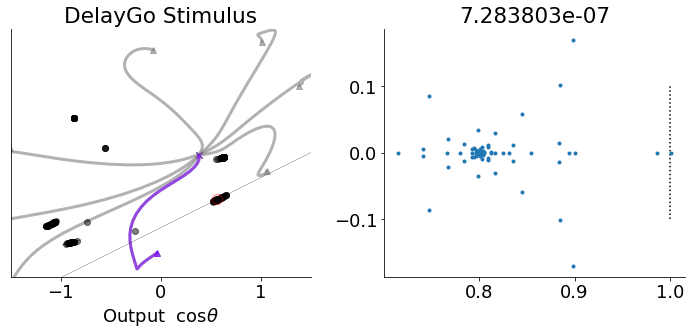

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


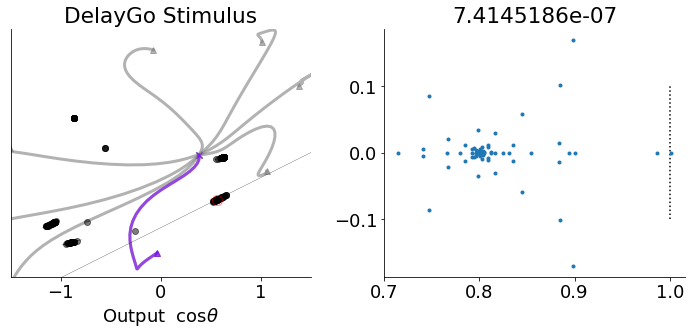

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


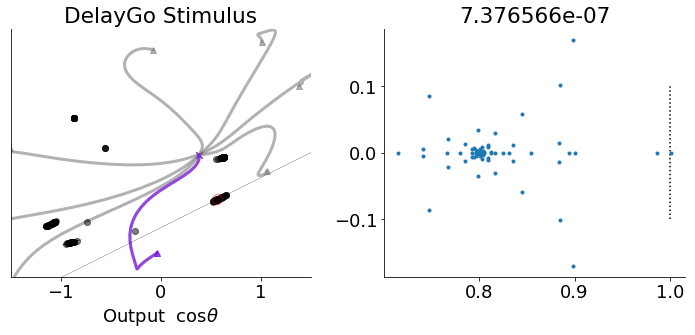

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


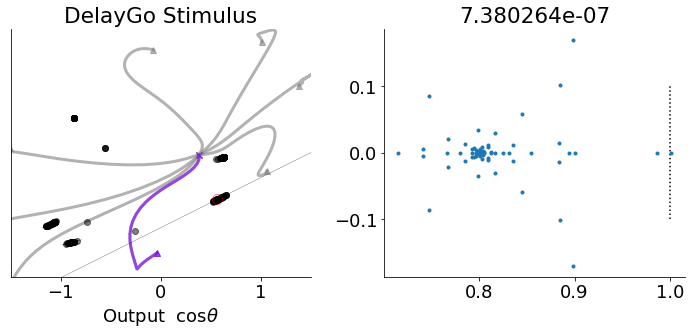

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


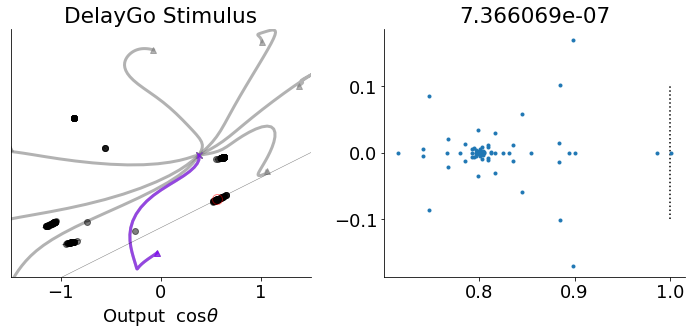

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


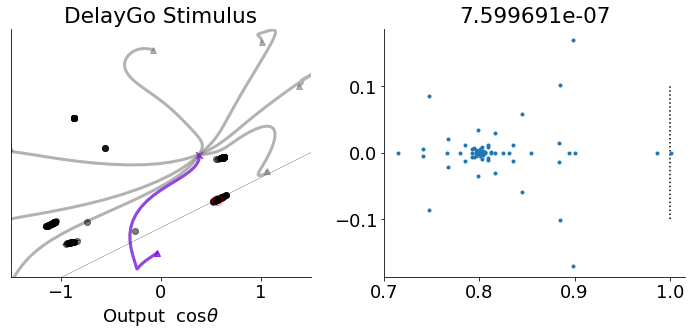

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


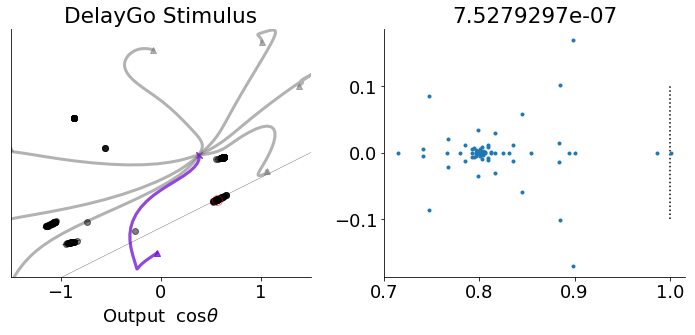

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


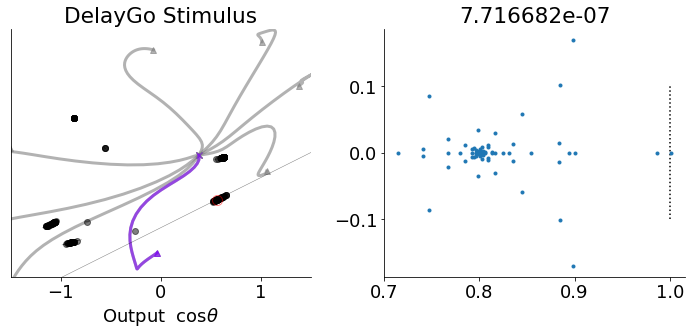

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


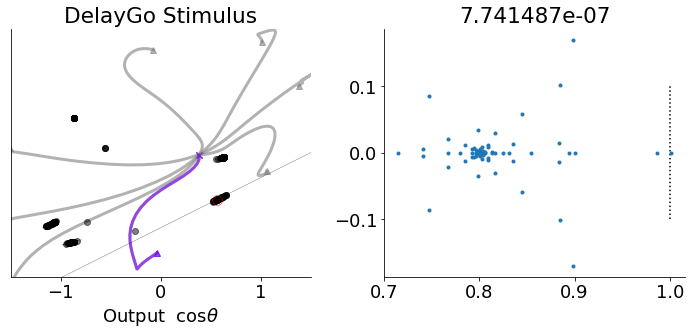

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


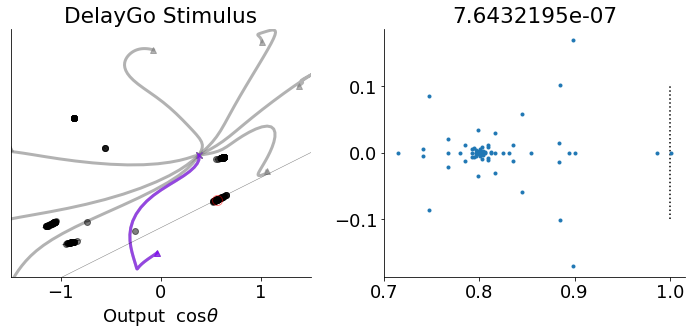

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


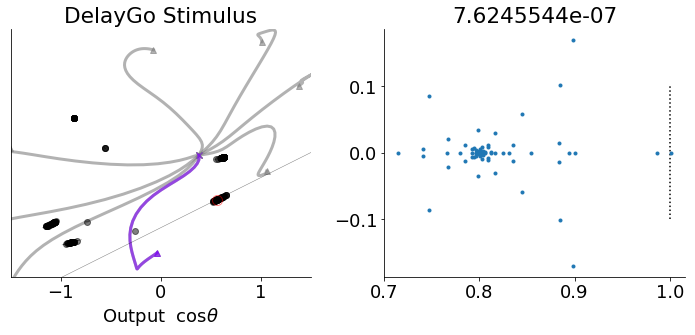

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


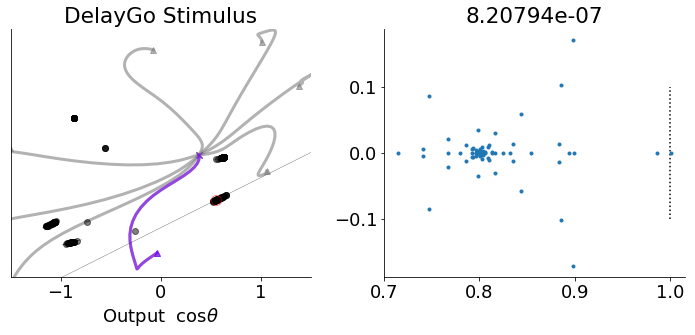

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


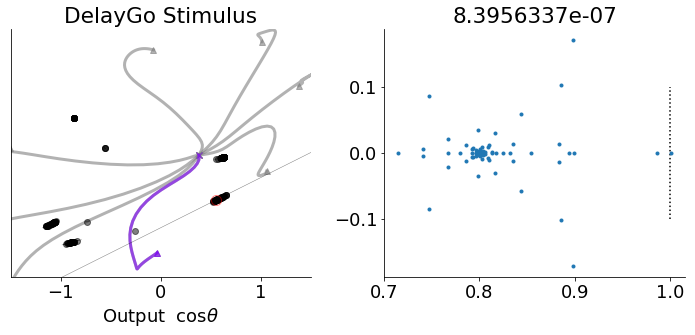

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


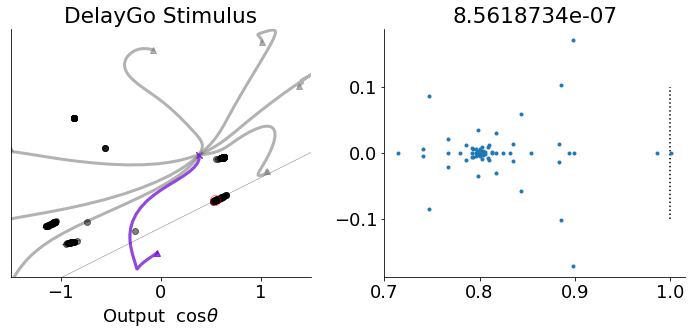

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


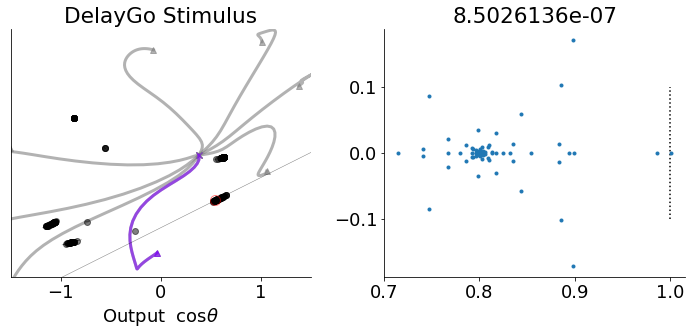

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


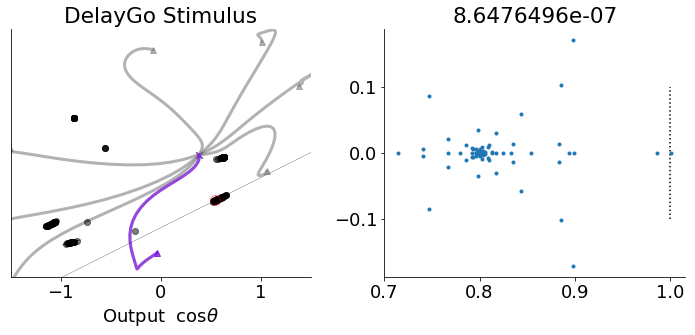

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


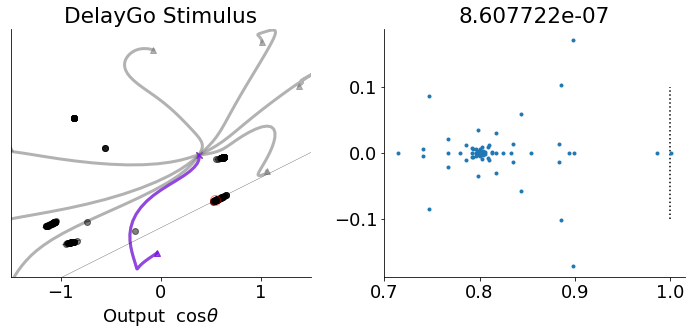

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


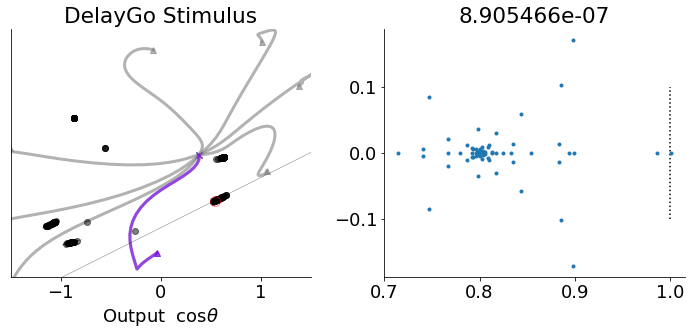

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


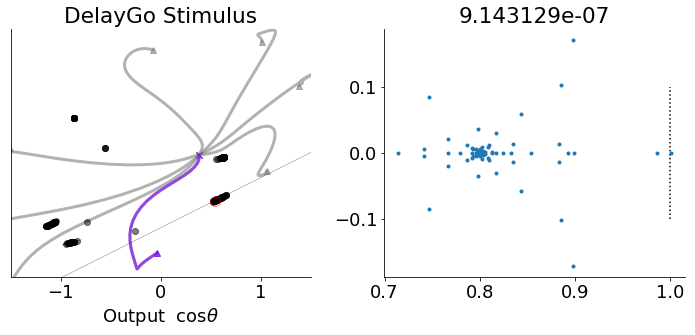

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


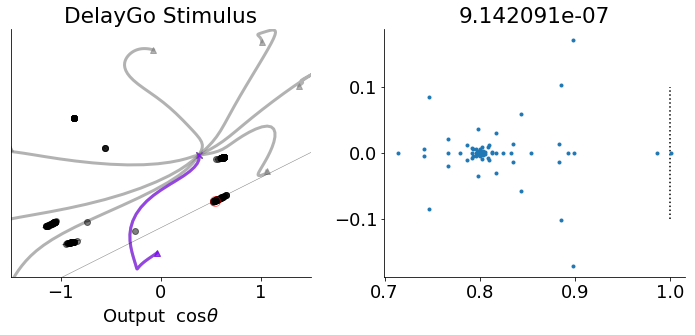

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


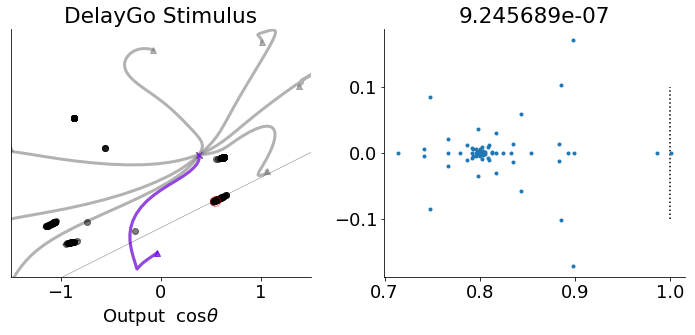

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


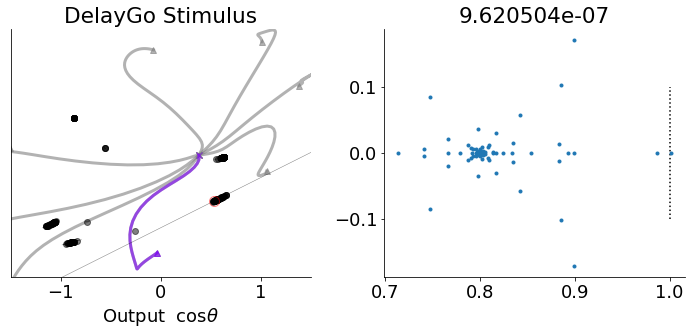

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


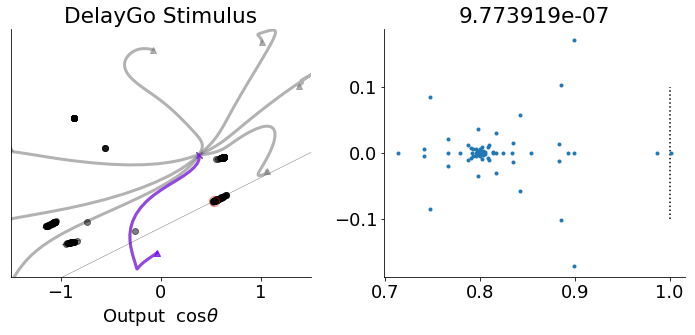

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


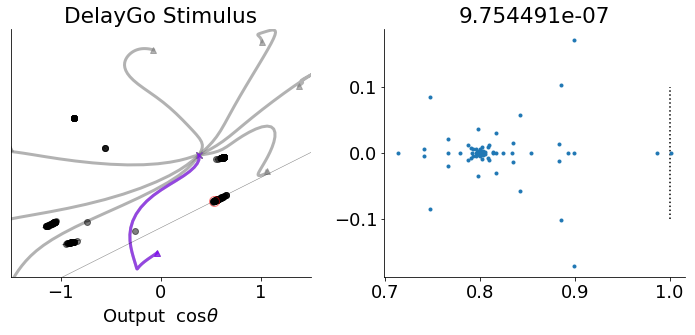

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


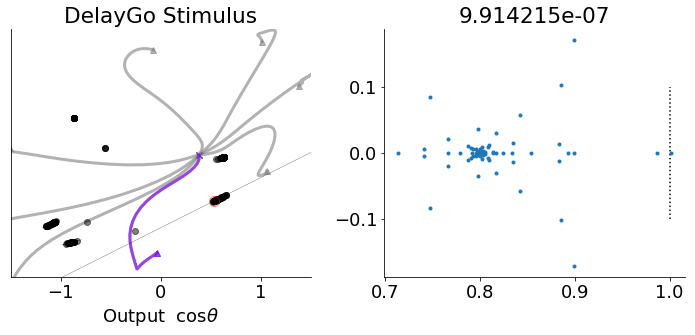

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


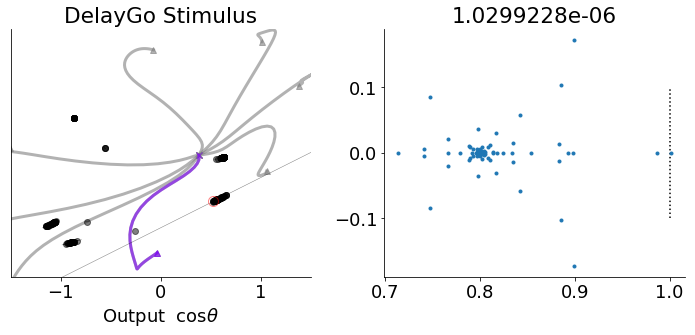

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


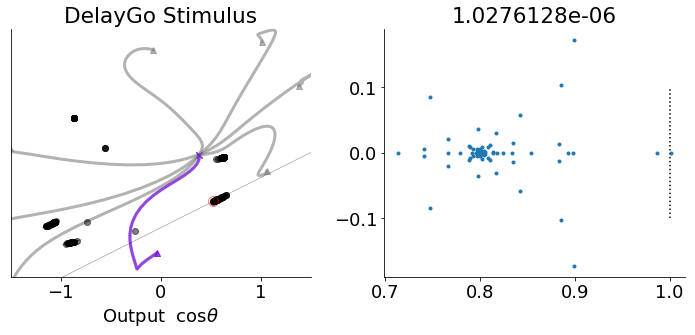

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


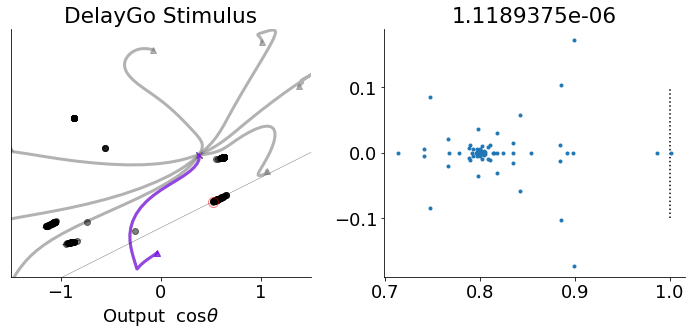

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


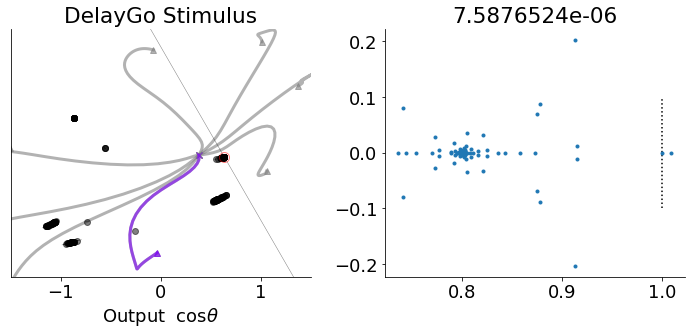

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


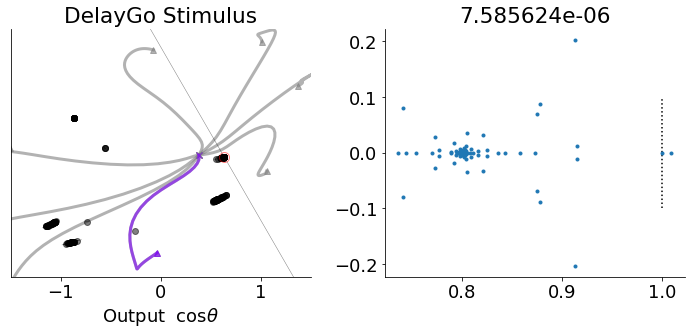

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


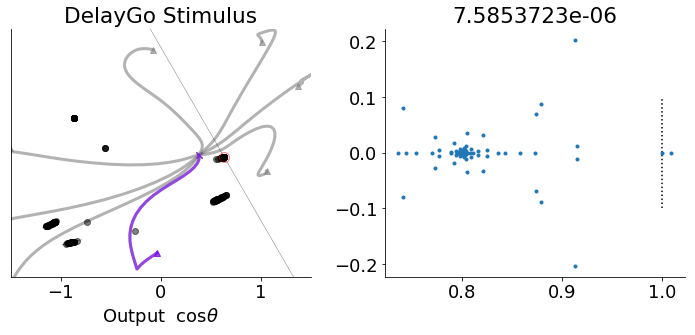

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


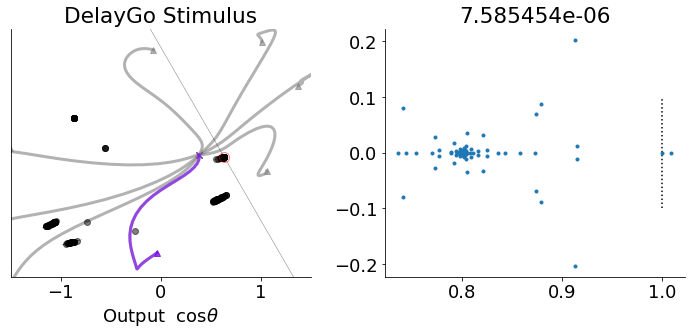

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


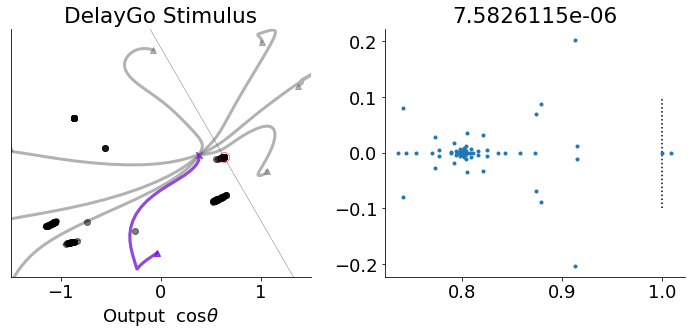

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


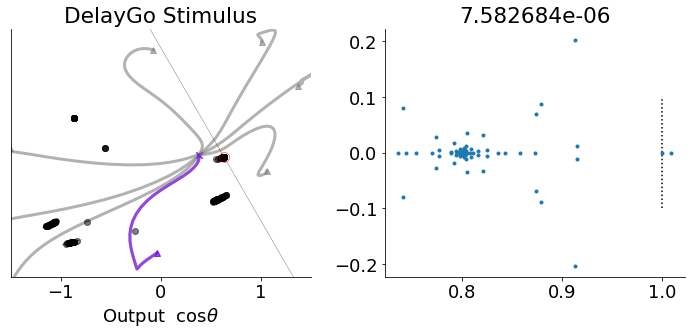

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


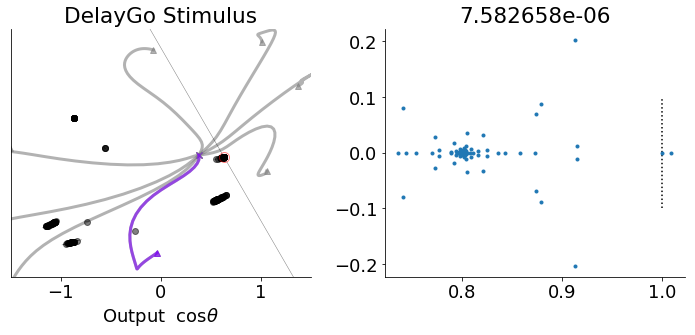

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


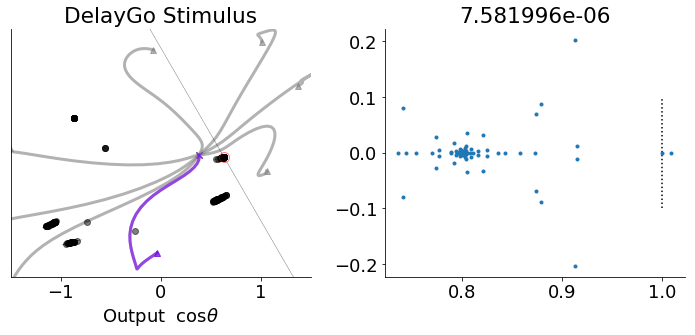

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


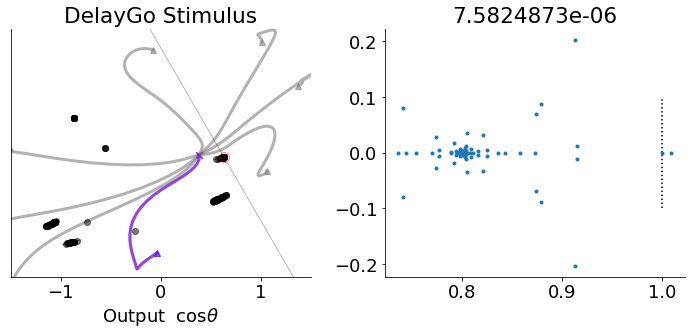

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


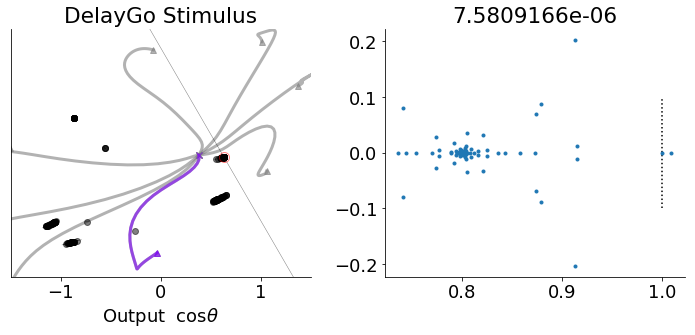

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


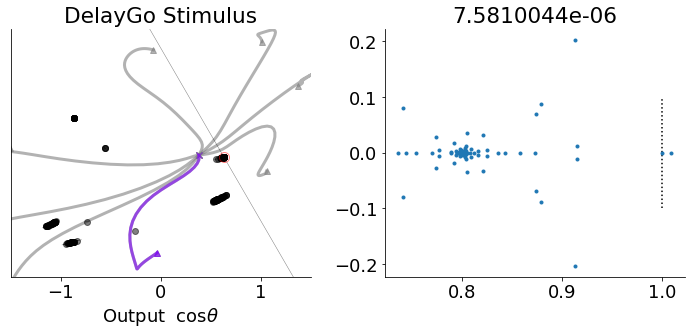

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


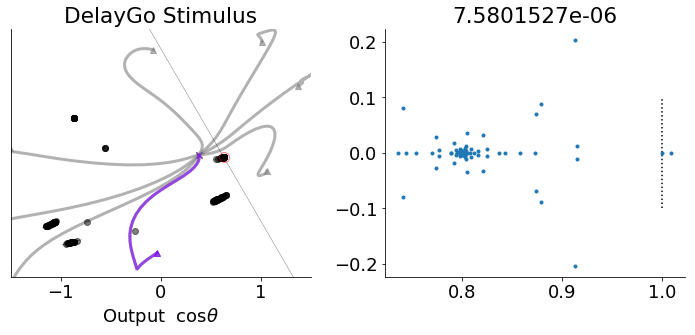

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


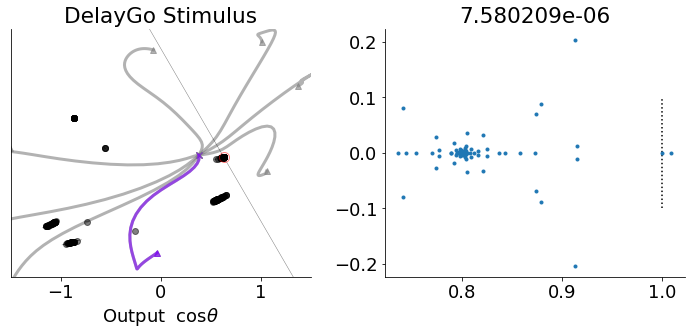

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


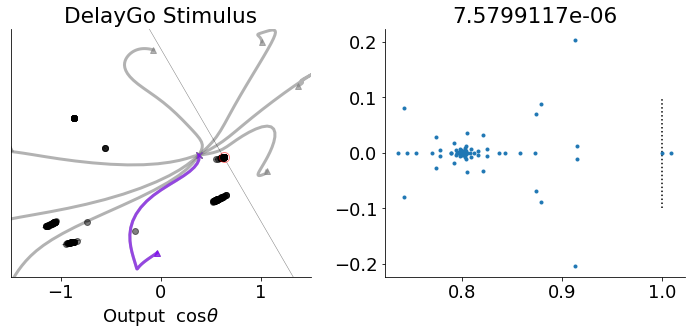

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


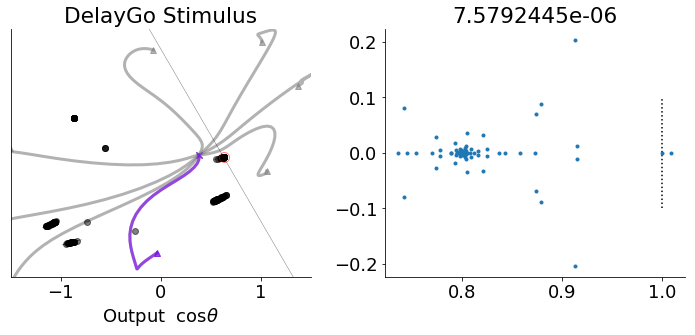

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


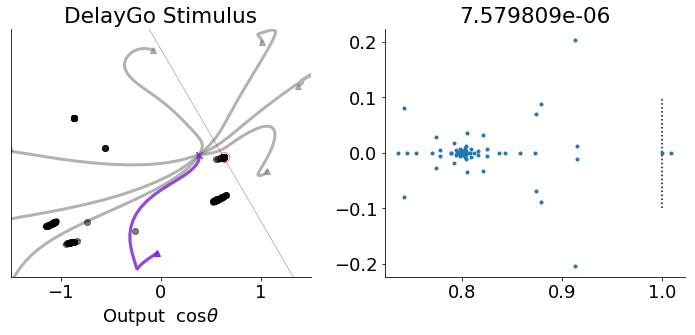

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


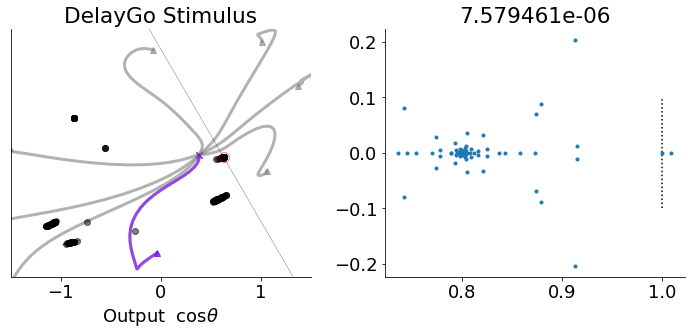

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


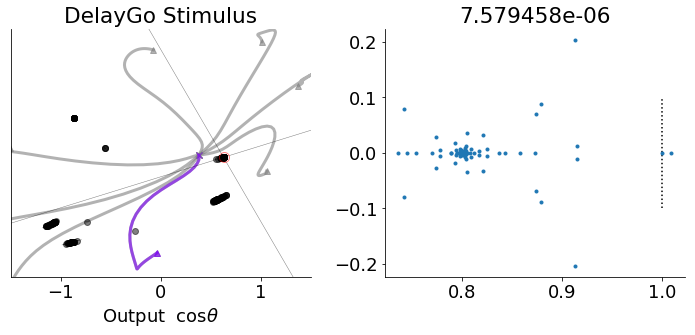

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


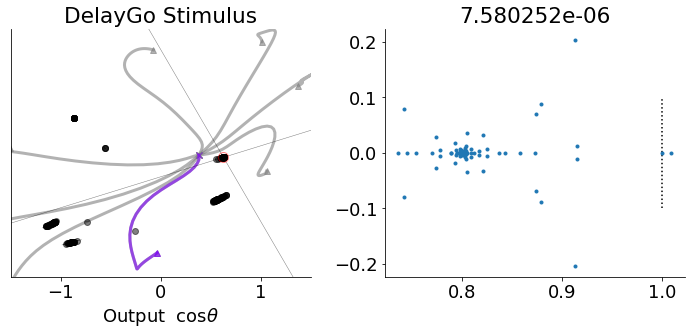

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


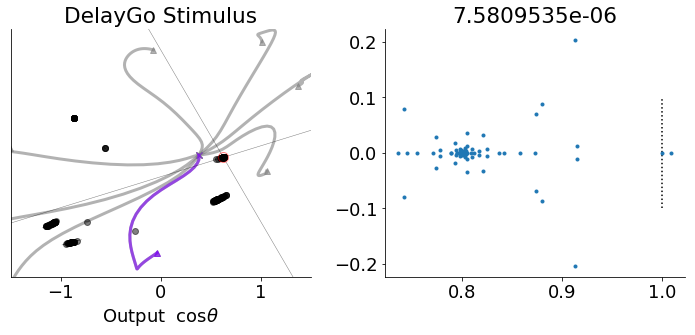

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


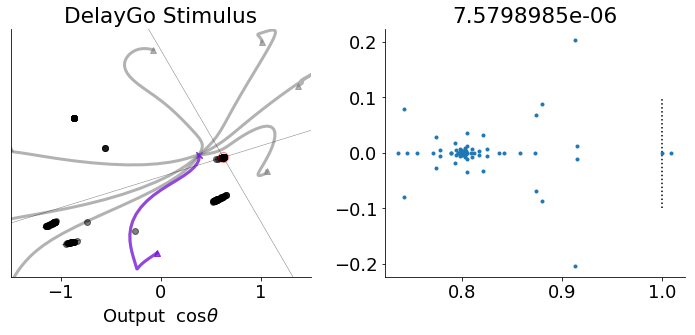

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


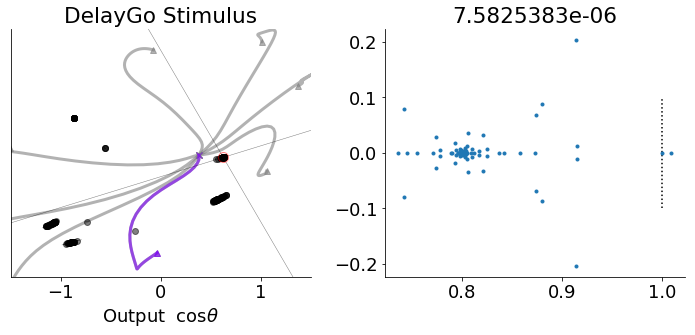

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


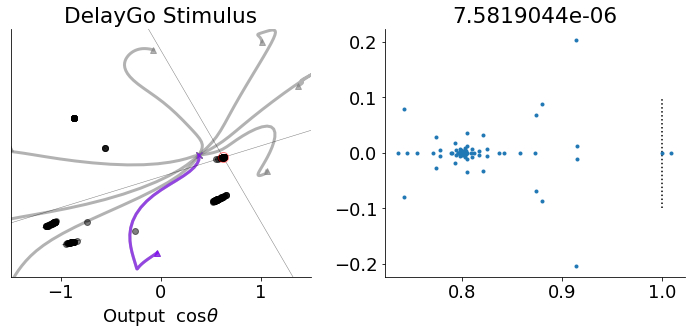

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


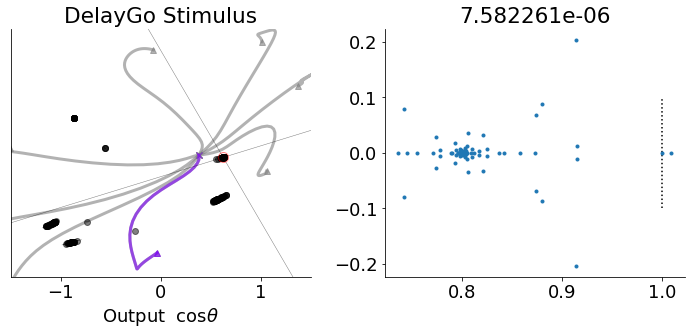

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


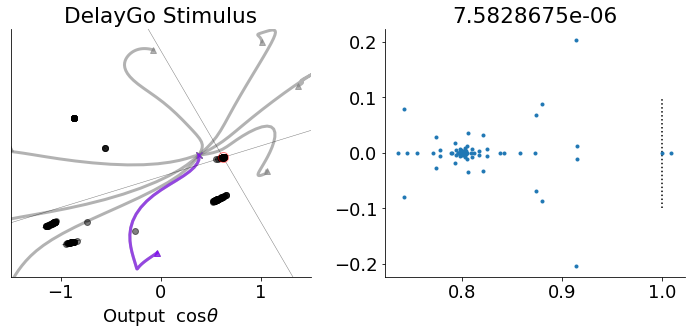

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


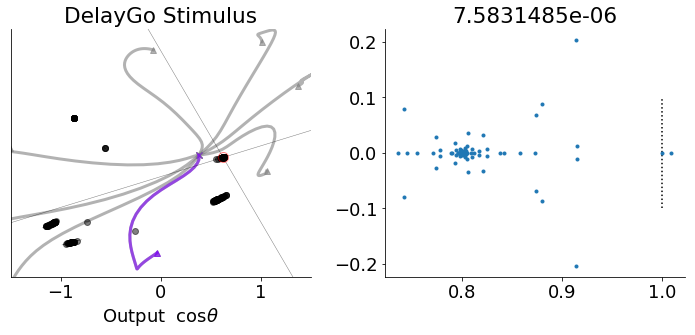

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


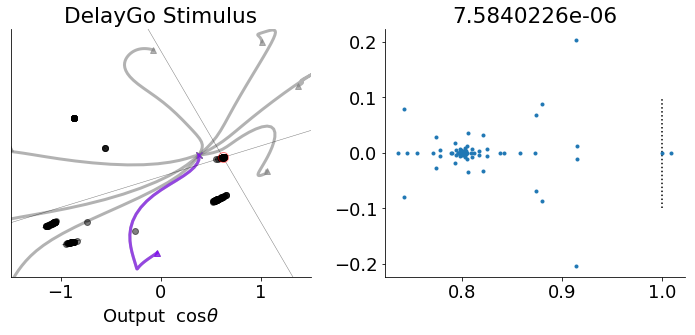

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


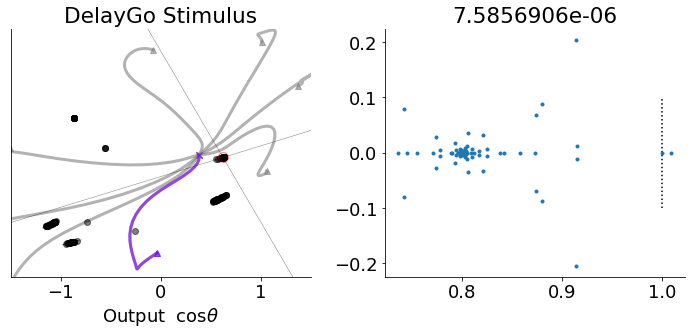

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


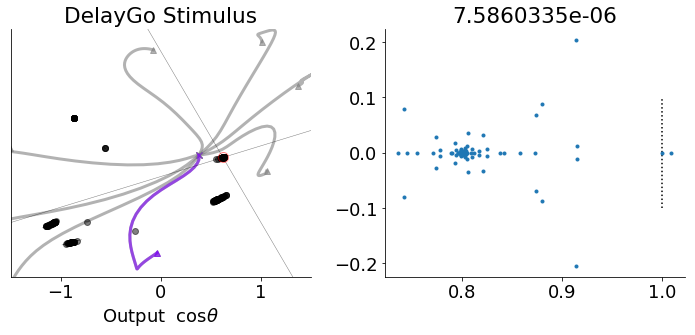

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


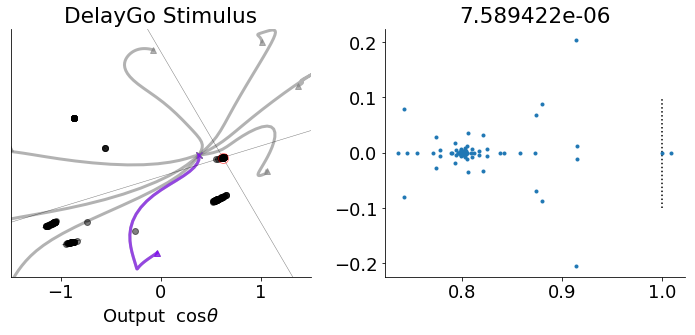

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


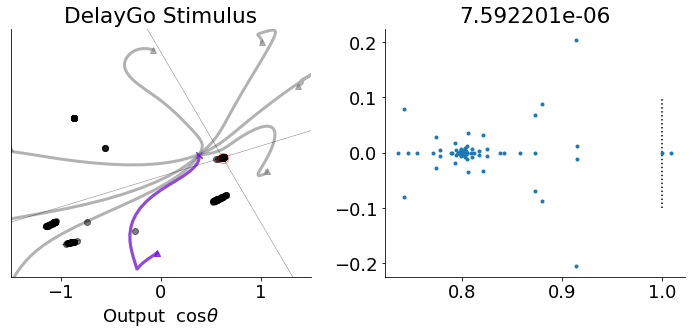

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


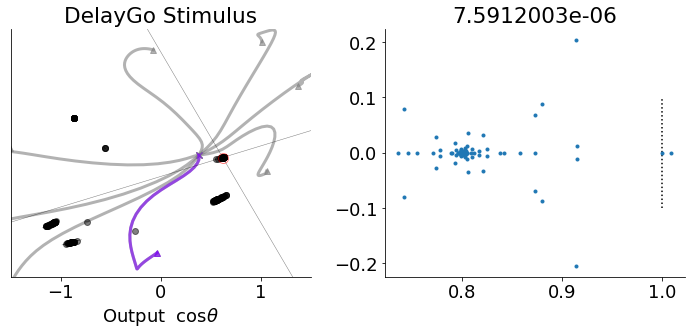

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


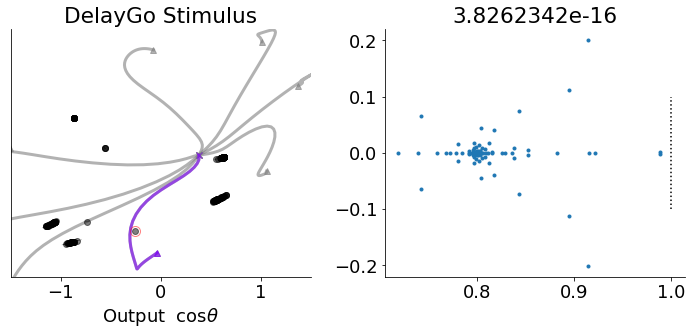

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


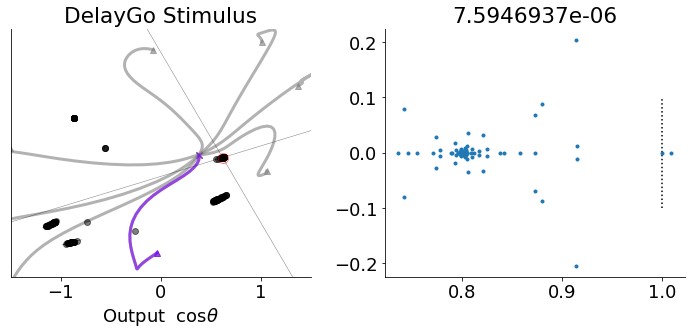

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


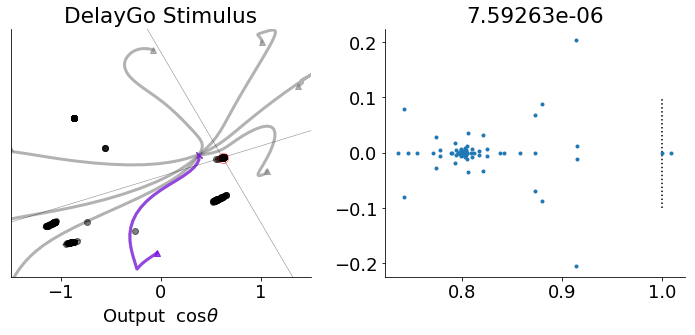

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


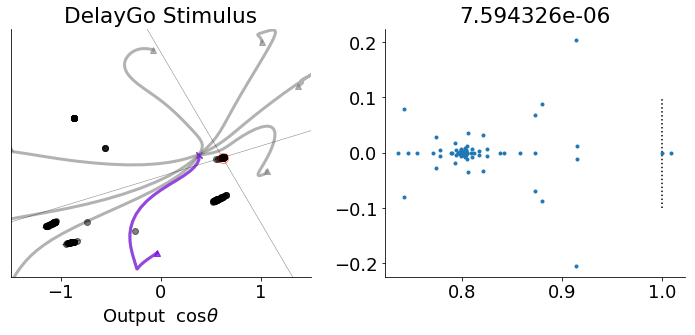

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


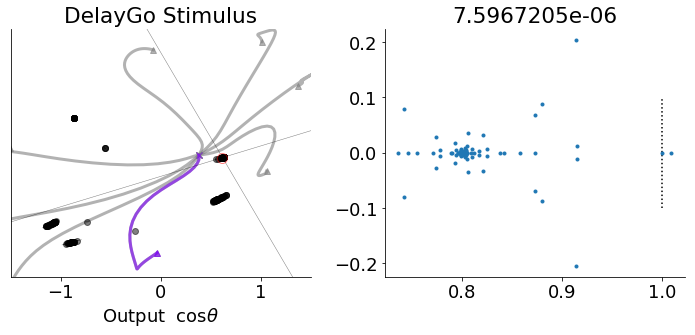

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


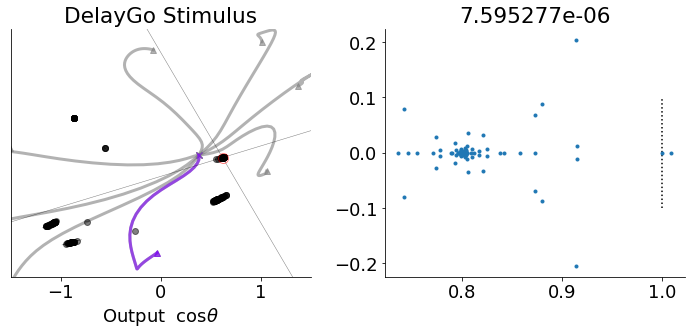

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


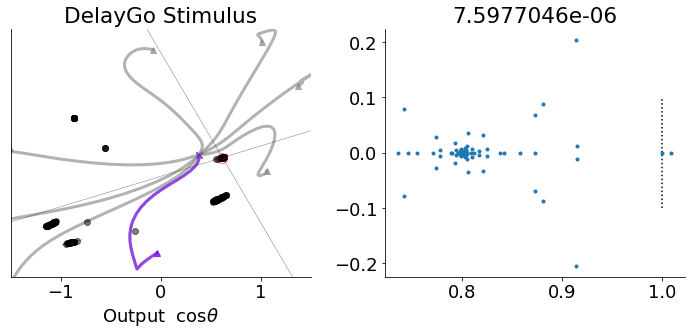

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


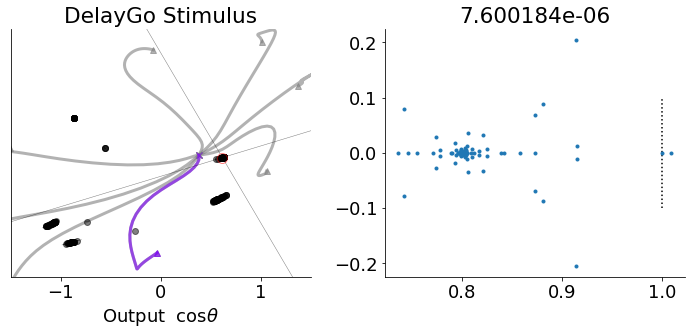

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


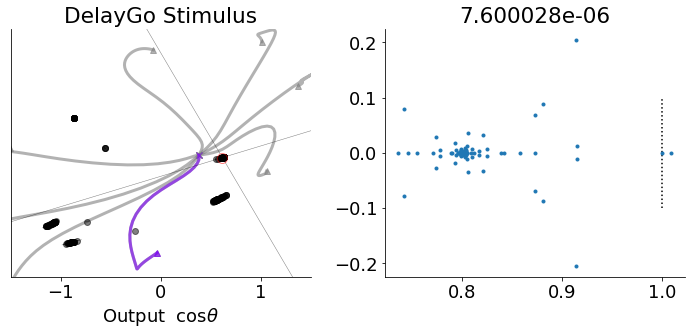

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


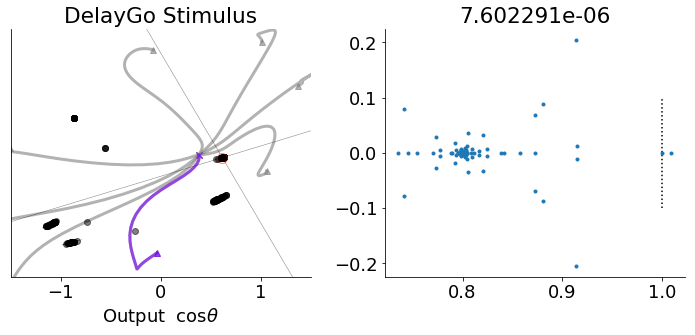

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


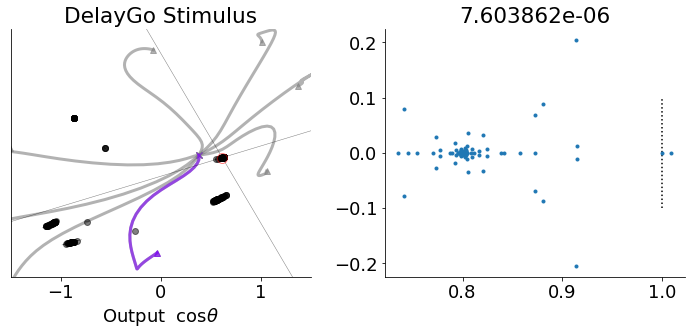

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


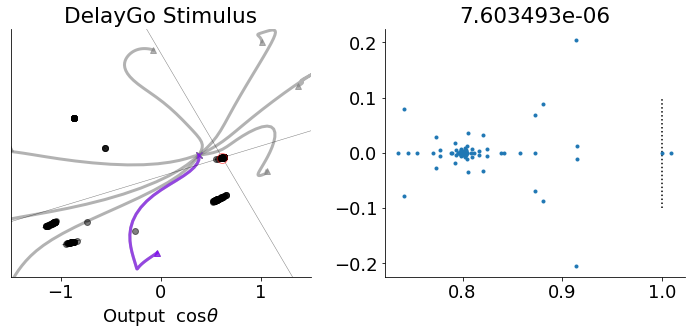

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


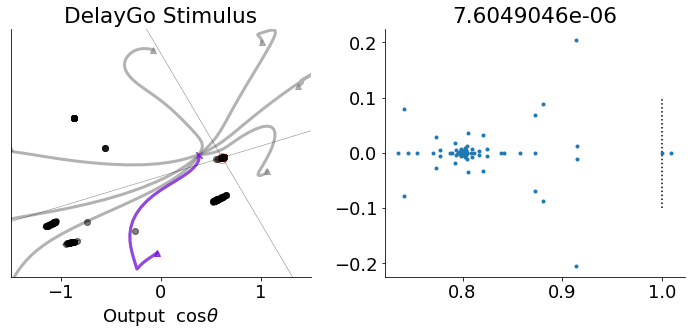

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


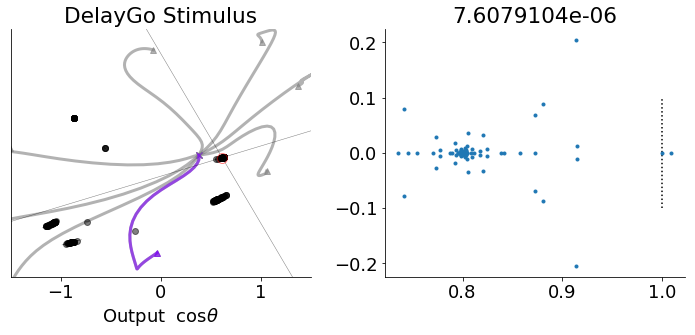

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


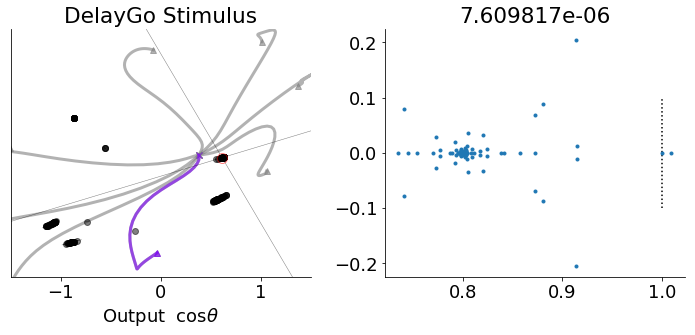

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


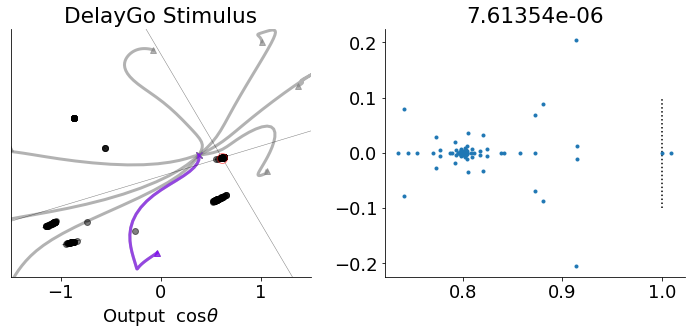

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


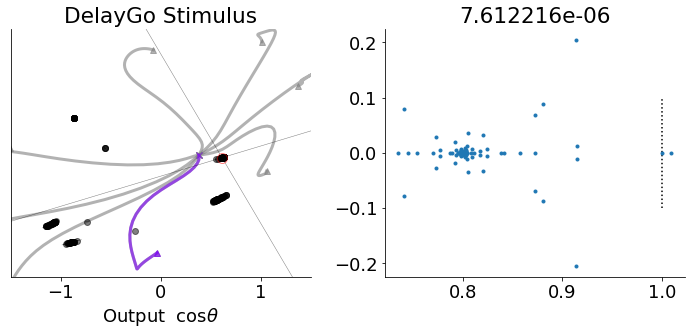

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


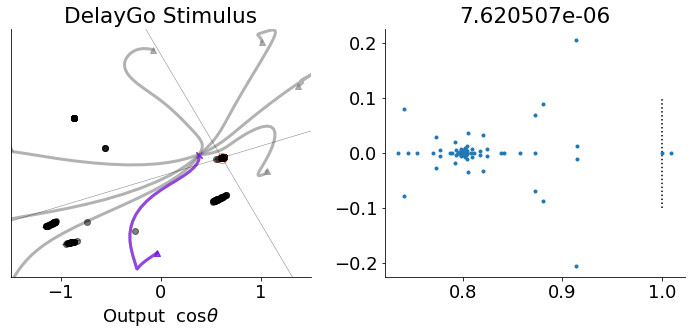

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


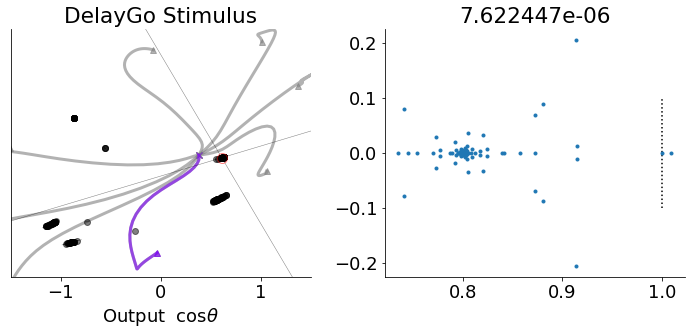

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


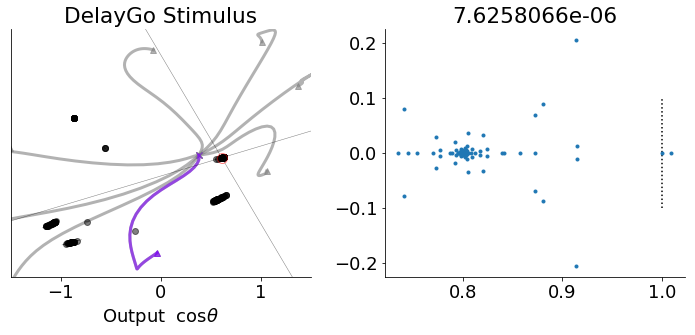

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


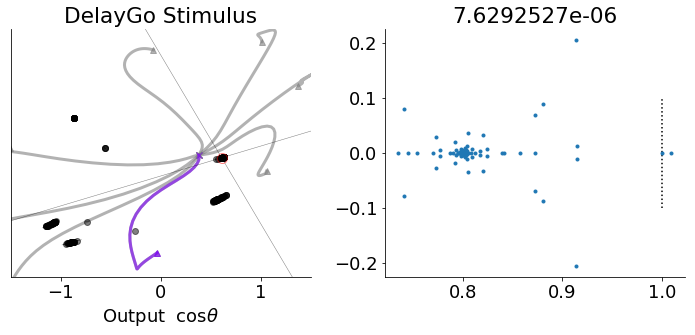

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


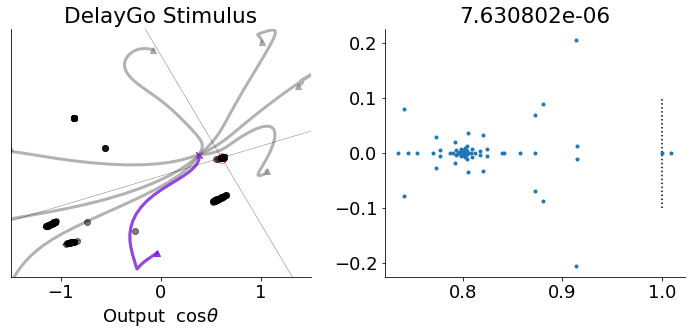

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


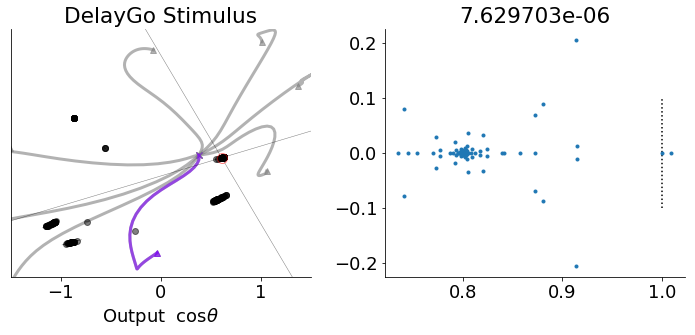

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


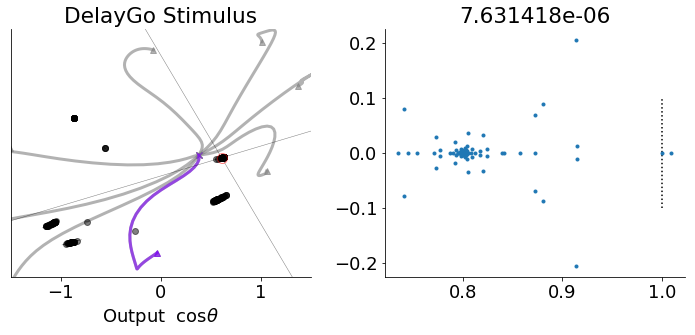

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


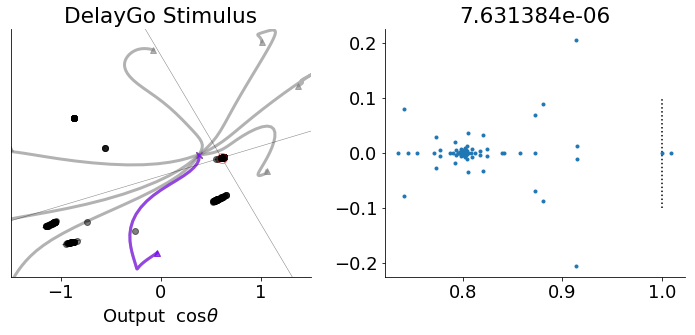

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


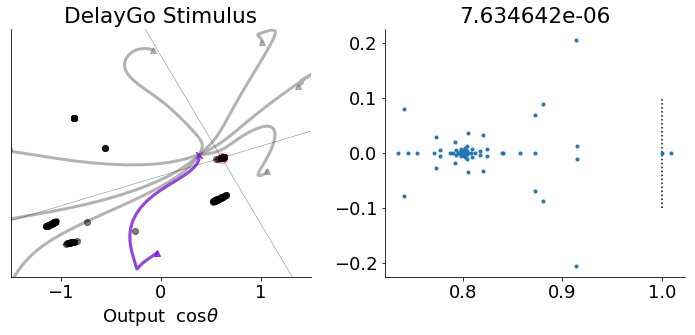

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


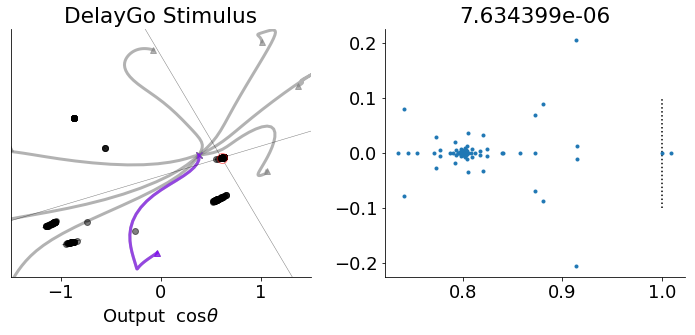

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


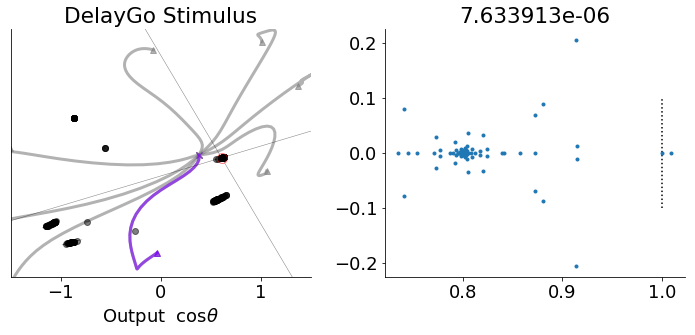

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


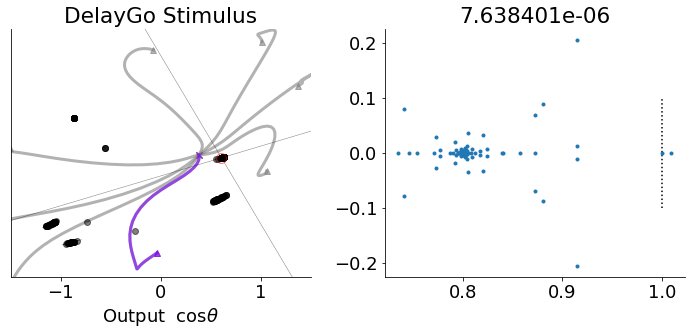

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


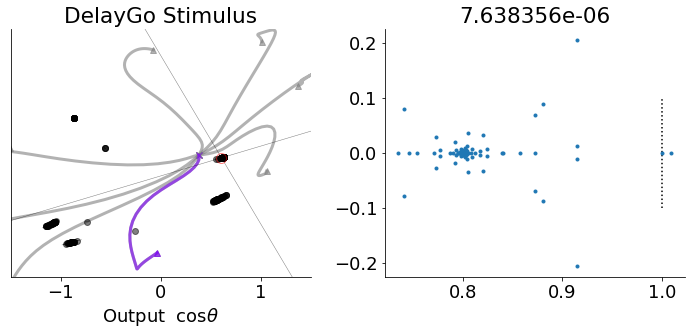

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


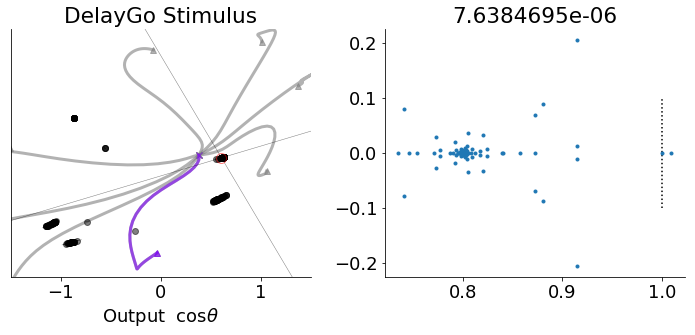

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


KeyboardInterrupt: 

In [117]:
t_num = 0
rule_ind = 0
fp_epoch = 'stim1'
epoch_order = range(len(epoch_set))
rule = rules_dict['all'][rule_ind]
qlim = 1#.0000001
filename = os.path.join(model_dir_all,'golub_fixed_pts',rule,fp_epoch+'_'+str(t_num)+'.npz')
fp_struct = np.load(filename)

fp_logic = fp_struct['qstar']< 1
eig_decomps = comp_eig_decomp(fp_struct['J_xstar'][fp_logic,:,:])
sorted_fps = fp_struct['xstar'][fp_logic,:]
plot_FP(sorted_fps, D.T, eig_decomps, c)

S = np.shape(fp_struct['qstar'])[0]
for s in range(S):
    fig = plt.figure(figsize=(10,5),tight_layout=True,facecolor='white')
    ax = plt.subplot(1,2,1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(100),rule,D_stim,fp_epoch,axes_epoch,
                              do_plot_FP=1,t_num = t_num,qlim = qlim)
    plot_FP_specific(s,sorted_fps, D_stim.T, eig_decomps, c = 'r')
    plt.ylim((-1.5,1.5))    
    plt.xlim((-1.5,1.5))  
    plt.xlabel('Output ' + r' $\cos{\theta}$')

    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$')
    else:
        ax.get_yaxis().set_visible(False)

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)  
    
    ax = plt.subplot(1,2,2)
    
    plt.plot([1,1],[-.1,.1],':k')
    plt.plot(eig_decomps[s]['evals'].real,eig_decomps[s]['evals'].imag,'.')
    
    plt.title(str(fp_struct['qstar'][s]))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)  
    plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0

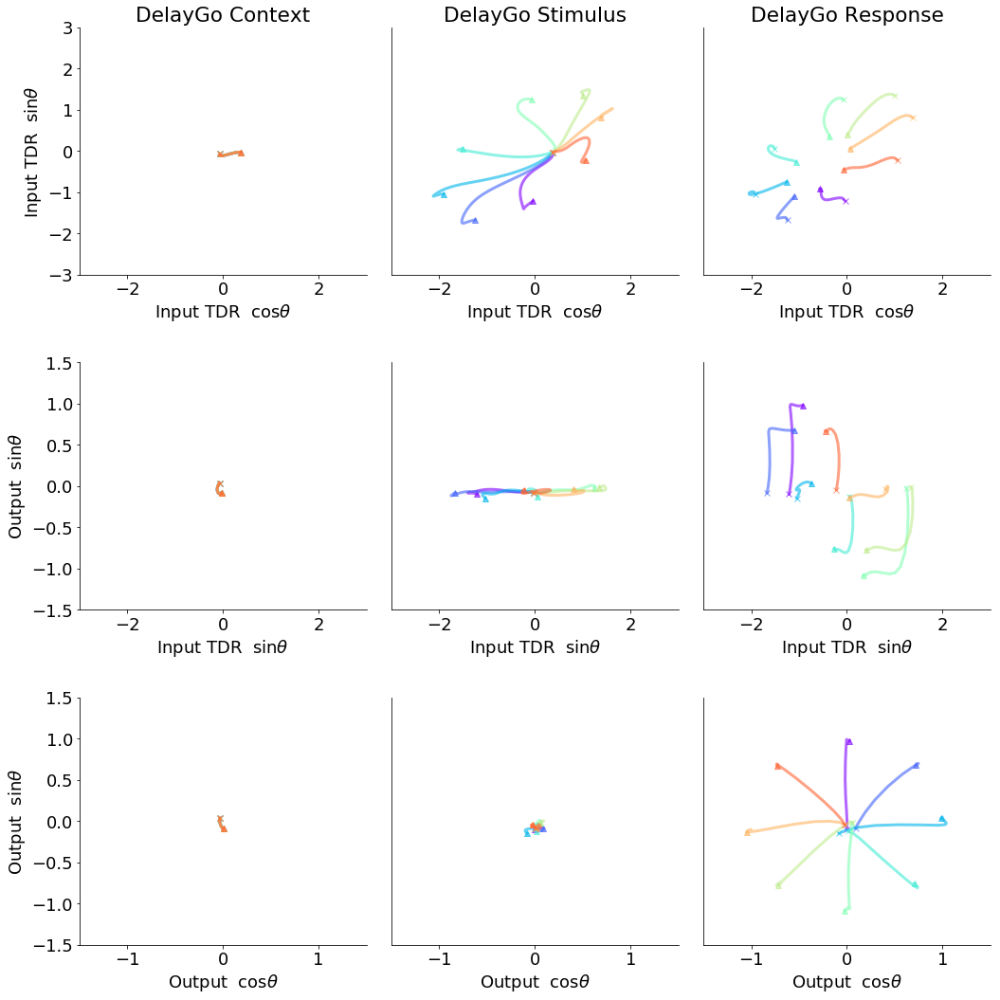

In [107]:
axes_epoch = 'stim1'
rule_ind = 0
do_plot = 0
nr = 3
t_num = 0
qlim = .0000001
input_lim = 3

epoch_set = ['fix1','stim1','go1']
epoch_order = range(3)
rule = rules_dict['all'][rule_ind]
fig = plt.figure(figsize=(len(epoch_set)*5,nr*5),tight_layout=True,facecolor='white')

for fp_epoch_ind in range(len(epoch_set)):
    fp_epoch = epoch_set[epoch_order[fp_epoch_ind]]
    D_stim = make_axes(model_dir_all,ckpt_n_dir,rule,axes_epoch)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_stim,fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.ylim((-input_lim,input_lim))    
    plt.xlim((-input_lim,input_lim))  
    plt.xlabel('Input TDR ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Input TDR ' + r' $\sin{\theta}$')
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+len(epoch_set))
    D_innout = np.concatenate((D_stim[:,1:],w_out[:,2:]),axis = 1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_innout,fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.title(' ')
    plt.xlim((-input_lim,input_lim))
    plt.ylim((-1.5,1.5))  
    plt.xlabel('Input TDR ' + r' $\sin{\theta}$') 
    
    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$')
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+2*len(epoch_set))
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,w_out[:,1:],fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.title(' ')
    plt.ylim((-1.5,1.5))    
    plt.xlim((-1.5,1.5))  
    plt.xlabel('Output ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$')
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
figpath = os.path.join(model_dir_all,'Output Prep Figure',rule)
figname = rule+'_Output_axes_Act_trials.pdf'
if not os.path.exists(figpath):
    os.makedirs(figpath)
plt.savefig(os.path.join(figpath,figname))
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
400
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kern

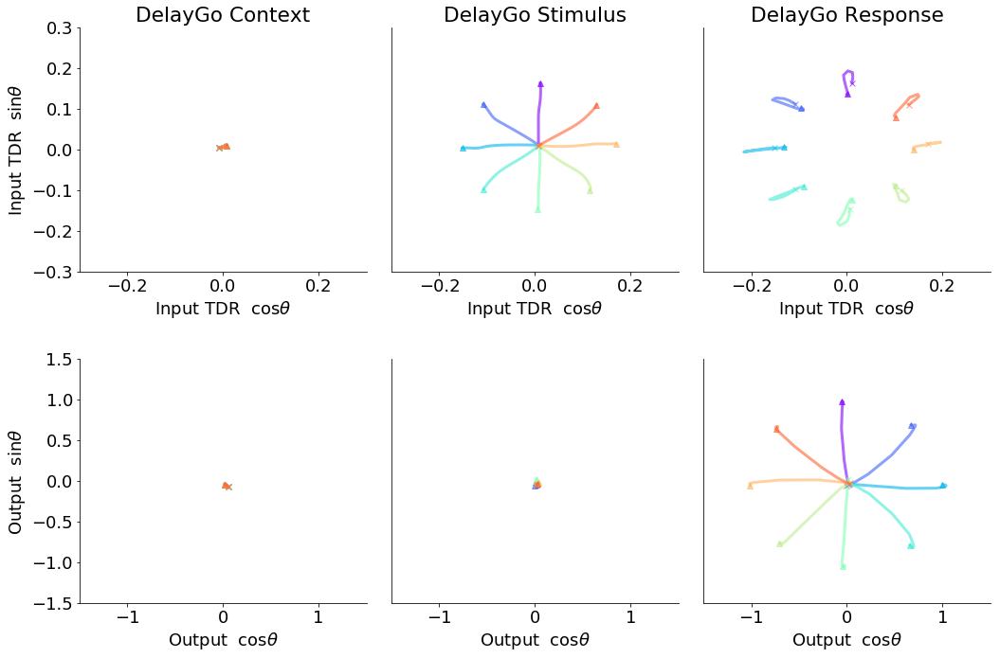

In [25]:
axes_epoch = 'stim1'
rule_ind = 0
do_plot = 0
nr = 2
t_num = 0
qlim = .0000001
input_lim = .3

epoch_set = ['fix1','stim1','go1']
epoch_order = range(3)
rule = rules_dict['all'][rule_ind]
fig = plt.figure(figsize=(len(epoch_set)*5,nr*5),tight_layout=True,facecolor='white')

for fp_epoch_ind in range(len(epoch_set)):
    fp_epoch = epoch_set[epoch_order[fp_epoch_ind]]
    D_stim = make_axes(model_dir_all,ckpt_n_dir,rule,axes_epoch)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_stim,fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.ylim((-input_lim,input_lim))    
    plt.xlim((-input_lim,input_lim))  
    plt.xlabel('Input TDR ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Input TDR ' + r' $\sin{\theta}$')
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+len(epoch_set))
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,w_out[:,1:],fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.title(' ')
    plt.ylim((-1.5,1.5))    
    plt.xlim((-1.5,1.5))  
    plt.xlabel('Output ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$')
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
figpath = os.path.join(model_dir_all,'Output Prep Figure',rule)
figname = rule+'_Output_axes_Act_trials_small.pdf'
if not os.path.exists(figpath):
    os.makedirs(figpath)
plt.savefig(os.path.join(figpath,figname))
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softp

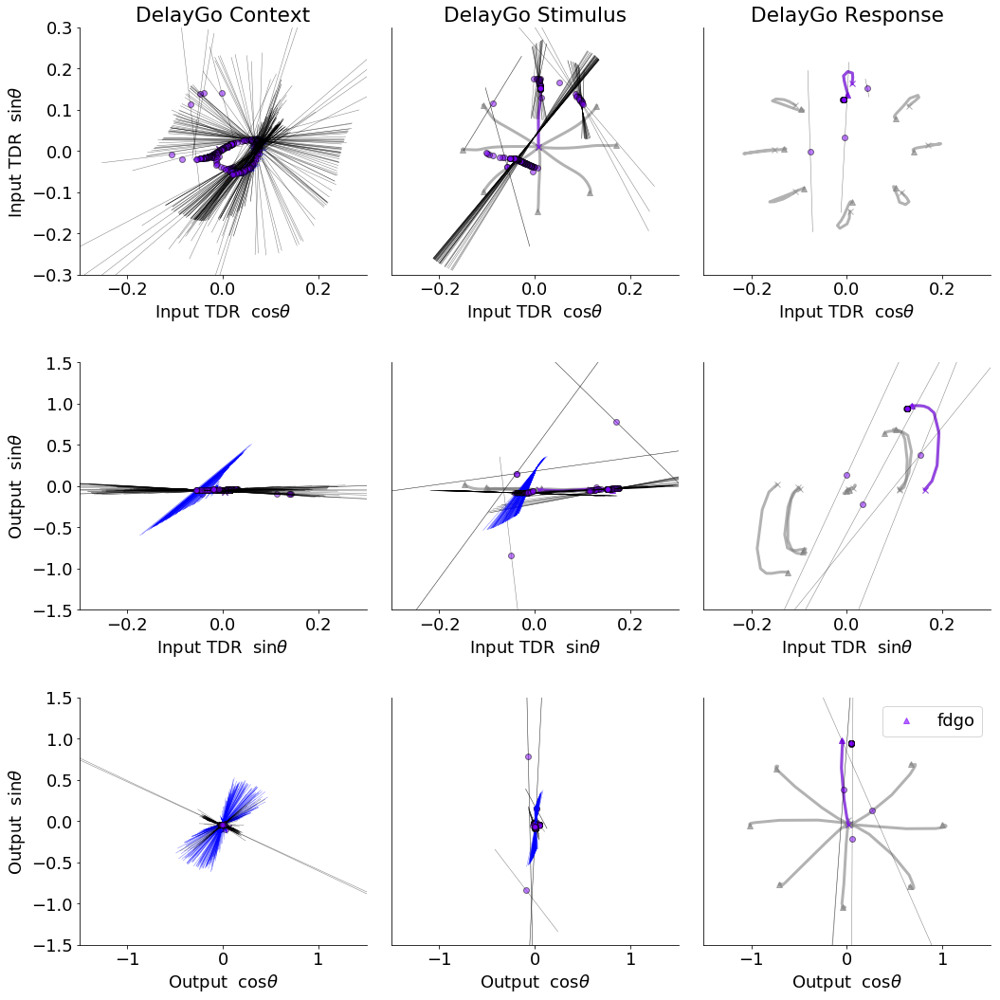

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
400
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kern

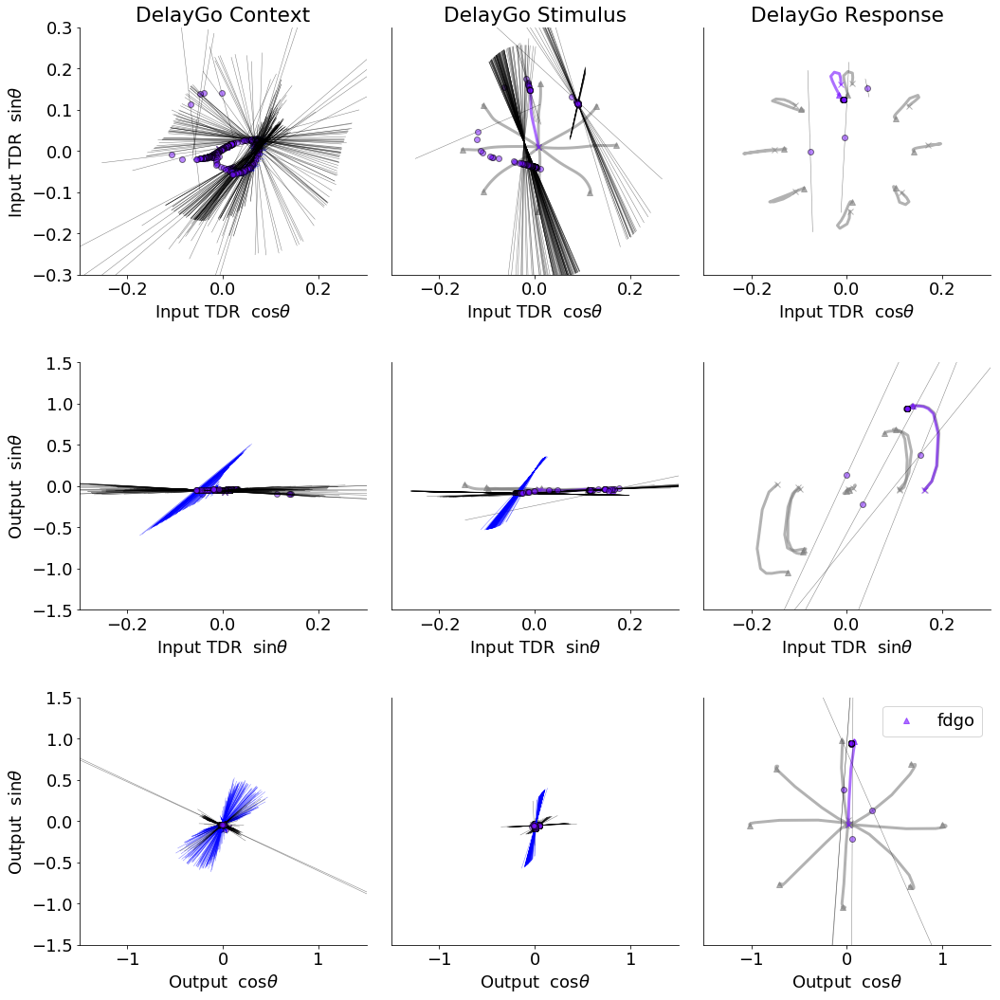

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
400
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kern

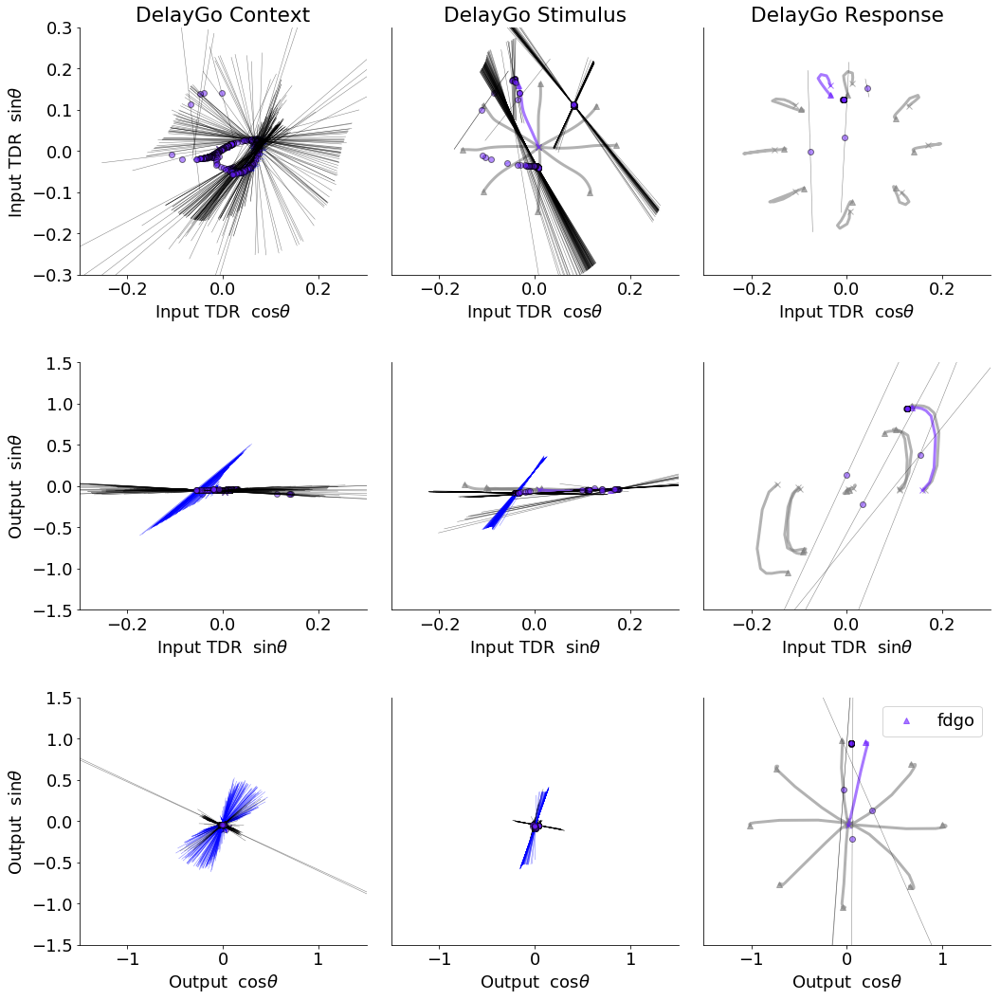

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
400
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kern

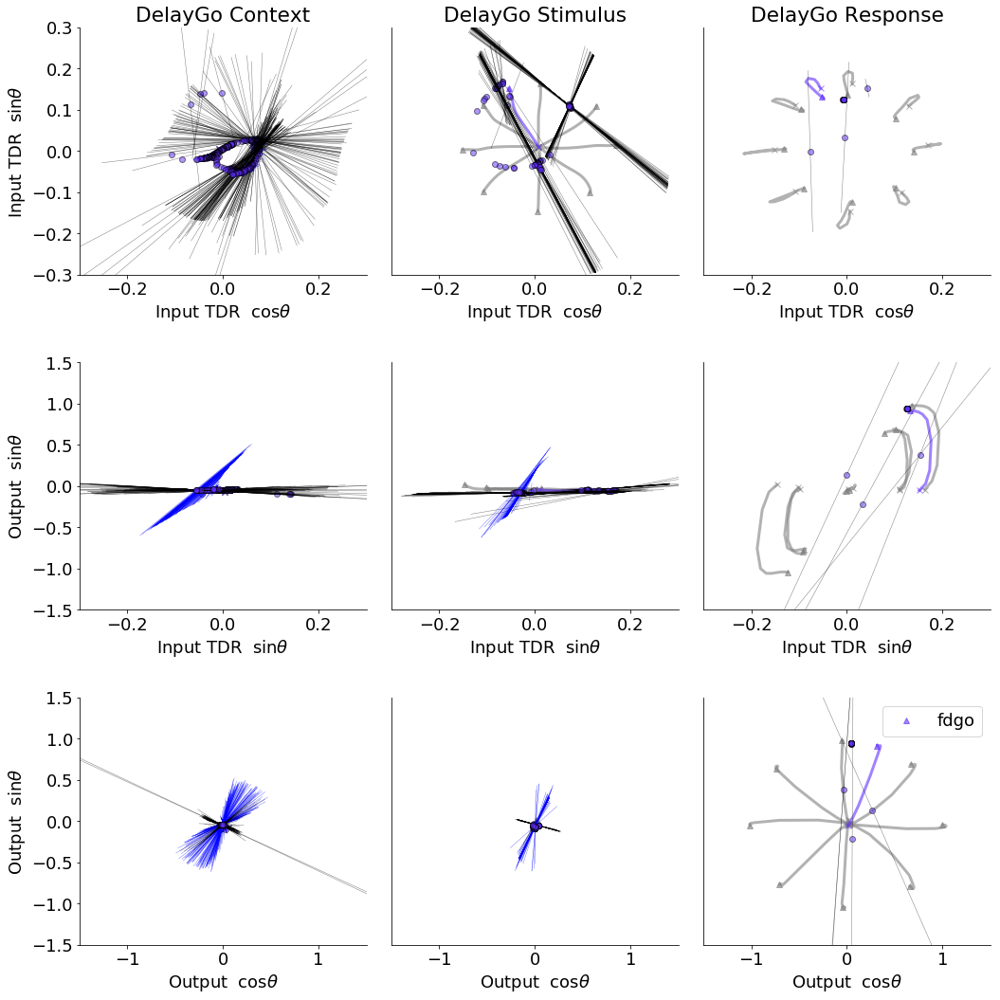

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
400
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kern

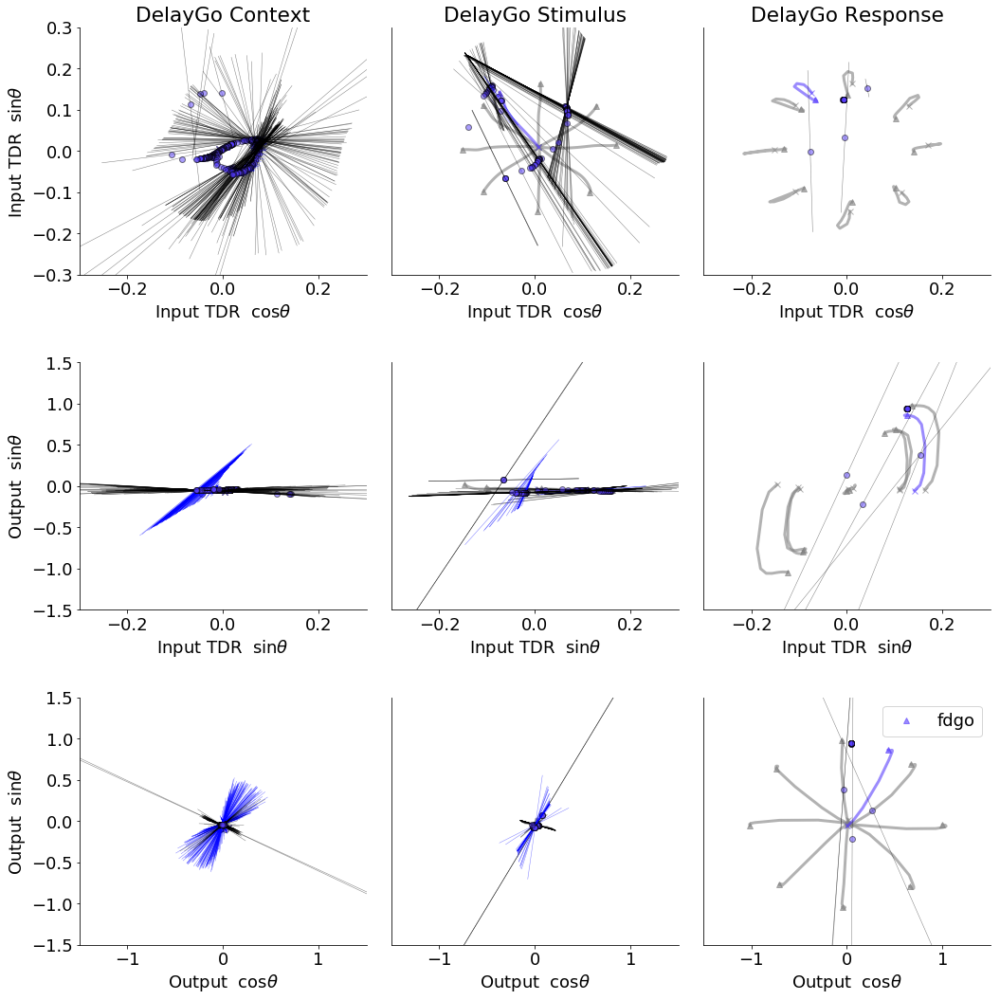

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2h00001/0/ckpts/model.ckpt-1235000
400
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kern

KeyboardInterrupt: 

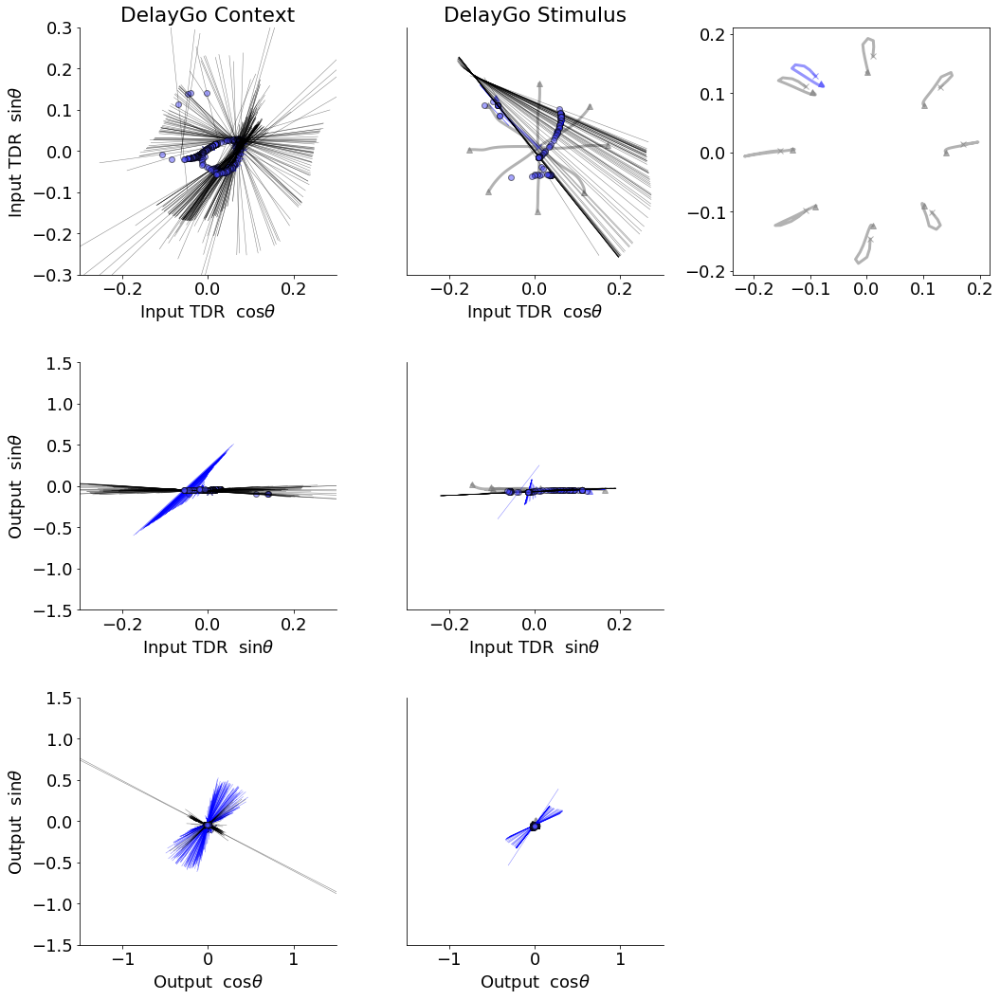

In [27]:
axes_epoch = 'stim1'
rule_ind = 0
do_plot = 1
nr = 3
t_num = 0
qlim = 1#.0000001
input_lim = .3

epoch_set = ['fix1','stim1','go1']
epoch_order = range(3)
rule = rules_dict['all'][rule_ind]

for t_num in range(0,400,8):
    fig = plt.figure(figsize=(len(epoch_set)*5,nr*5),tight_layout=True,facecolor='white')

    for fp_epoch_ind in range(len(epoch_set)):
        fp_epoch = epoch_set[epoch_order[fp_epoch_ind]]
        D_stim = make_axes(model_dir_all,ckpt_n_dir,rule,axes_epoch)

        ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1)
        plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_stim,fp_epoch,axes_epoch,
                                  do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
        plt.ylim((-input_lim,input_lim))    
        plt.xlim((-input_lim,input_lim))  
        plt.xlabel('Input TDR ' + r' $\cos{\theta}$')

        if fp_epoch_ind==0:
            plt.ylabel('Input TDR ' + r' $\sin{\theta}$')
        else:
            ax.get_yaxis().set_visible(False)

        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+len(epoch_set))
        D_innout = np.concatenate((D_stim[:,1:],w_out[:,2:]),axis = 1)
        plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_innout,fp_epoch,axes_epoch,
                                  do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
        plt.title(' ')
        plt.xlim((-input_lim,input_lim))
        plt.ylim((-1.5,1.5))  
        plt.xlabel('Input TDR ' + r' $\sin{\theta}$') 

        if fp_epoch_ind==0:
            plt.ylabel('Output ' + r' $\sin{\theta}$')
        else:
            ax.get_yaxis().set_visible(False)

        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+2*len(epoch_set))
        plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,w_out[:,1:],fp_epoch,axes_epoch,
                                  do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
        plt.title(' ')
        plt.ylim((-1.5,1.5))    
        plt.xlim((-1.5,1.5))  
        plt.xlabel('Output ' + r' $\cos{\theta}$')

        if fp_epoch_ind==0:
            plt.ylabel('Output ' + r' $\sin{\theta}$')
        else:
            ax.get_yaxis().set_visible(False)

        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

    plt.legend()
    figpath = os.path.join(model_dir_all,'Output Prep Figure',rule)
    figname = rule+'_Output_axes_FP_one_trials_'+str(t_num)+'.pdf'
    if not os.path.exists(figpath):
        os.makedirs(figpath)
    plt.savefig(os.path.join(figpath,figname))
    plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/ckpts/model.ckpt-414000
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/ckpts/model.ckpt-414000
400


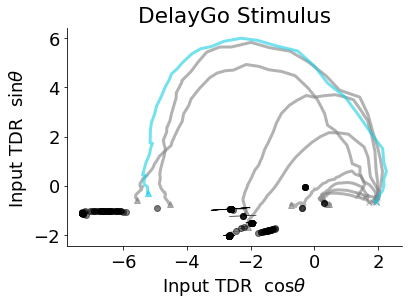

In [540]:
fp_epoch = 'stim1'
t_num = 120
m = model_dir_all
model = Model(m)
rule_ind = 0

with tf.Session() as sess:
    model.saver.restore(sess,ckpt_n_dir)
    hparams = model.hp
    rule = rules_dict['all'][rule_ind]
    trial = generate_trials(rule, hparams, mode='test', batch_size = np.max(trial_set),
                            noise_on=True, delay_fac =1)
    feed_dict = tools.gen_feed_dict(model, trial, hparams)
    h_tf, _ = sess.run([model.h, model.y_hat], feed_dict=feed_dict) #(n_time, n_condition, n_neuron)
    T_inds = get_T_inds(trial,fp_epoch) # grab epoch time indexing

pca = PCA(n_components = 2,whiten = True)
X_pca = pca.fit_transform(np.squeeze(h_tf[T_inds,t_num,:]))
D = pca.components_.T

qlim = .0001
ax = plt.subplot(1,1,1)
plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D,fp_epoch,axes_epoch,
                          do_plot_FP=1,t_num = t_num,qlim = qlim)
 
plt.xlabel('Input TDR ' + r' $\cos{\theta}$')
plt.ylabel('Input TDR ' + r' $\sin{\theta}$') 
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/

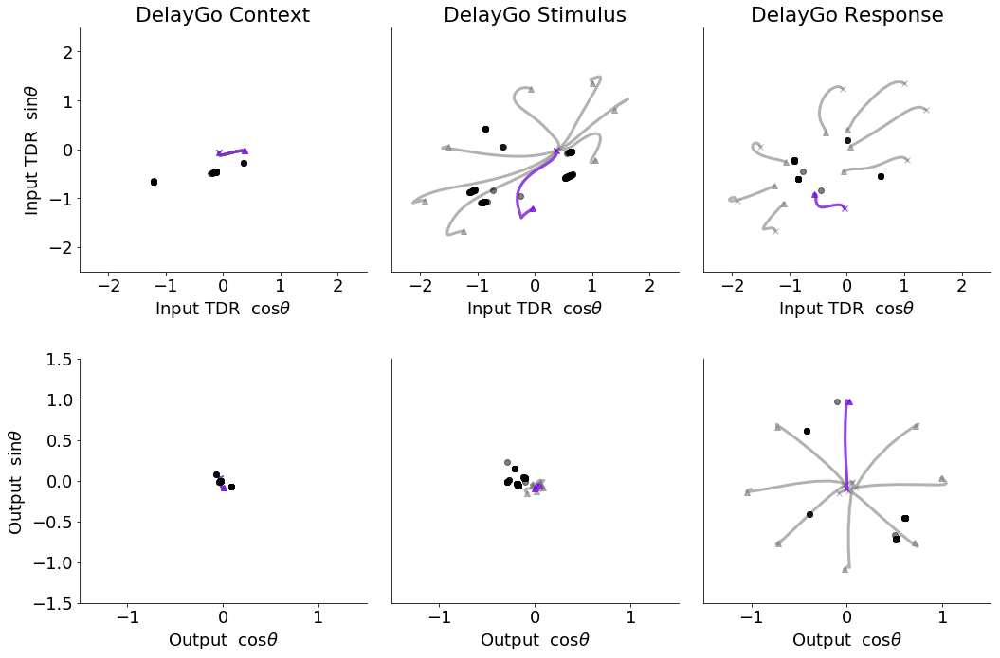

In [109]:
axes_epoch = 'stim1'
rule_ind = 0
do_plot = 1
nr = 2
t_num = 0
qlim = 1#.0000001

epoch_set = ['fix1','stim1','go1']
epoch_order = range(3)
rule = rules_dict['all'][rule_ind]
fig = plt.figure(figsize=(len(epoch_set)*5,nr*5),tight_layout=True,facecolor='white')

for fp_epoch_ind in range(len(epoch_set)):
    fp_epoch = epoch_set[epoch_order[fp_epoch_ind]]
    D_stim = make_axes(model_dir_all,ckpt_n_dir,rule,axes_epoch)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_stim,fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.ylim((-input_lim,input_lim))    
    plt.xlim((-input_lim,input_lim))  
    plt.xlabel('Input TDR ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Input TDR ' + r' $\sin{\theta}$')
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+len(epoch_set))
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,w_out[:,1:],fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.title(' ')
    plt.ylim((-1.5,1.5))    
    plt.xlim((-1.5,1.5))  
    plt.xlabel('Output ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$')
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

figpath = os.path.join(model_dir_all,'Output Prep Figure',rule)
figname = rule+'_Output_axes_FP_one_trials_small_'+str(t_num)+'.pdf'
if not os.path.exists(figpath):
    os.makedirs(figpath)
plt.savefig(os.path.join(figpath,figname))
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


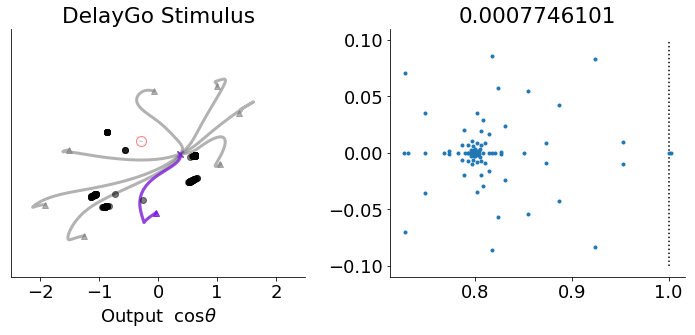

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


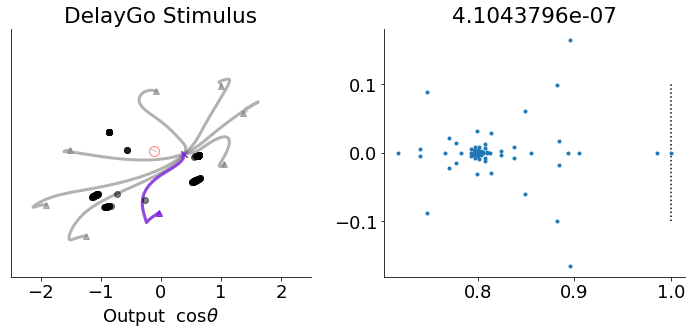

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


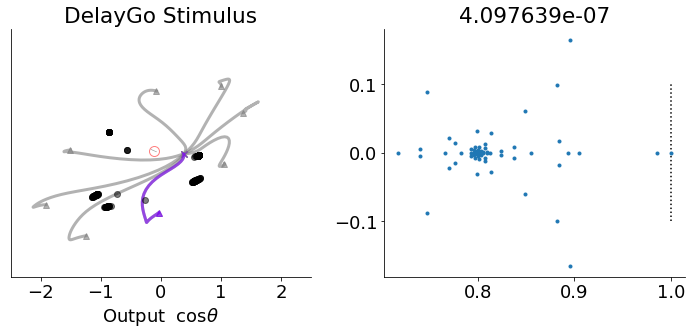

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


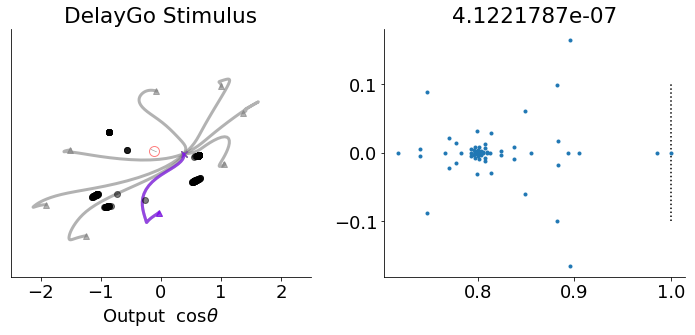

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/fdgo/stim1_0.npz


KeyboardInterrupt: 

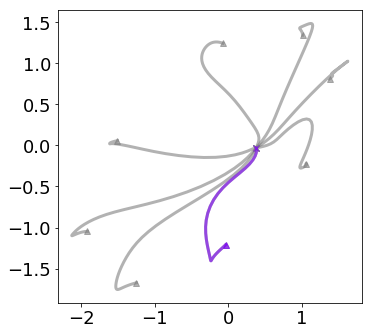

In [113]:
t_num = 0
rule_ind = 0
fp_epoch = 'stim1'
axes_epoch = 'stim1'
epoch_order = range(len(epoch_set))
rule = rules_dict['all'][rule_ind]
qlim = 1#.0000001
filename = os.path.join(model_dir_all,'golub_fixed_pts',rule,fp_epoch+'_'+str(t_num)+'.npz')
fp_struct = np.load(filename)

fp_logic = fp_struct['qstar']< 1
eig_decomps = comp_eig_decomp(fp_struct['J_xstar'][fp_logic,:,:])
sorted_fps = fp_struct['xstar'][fp_logic,:]

S = np.shape(fp_struct['qstar'])[0]
for s in range(S):
    fig = plt.figure(figsize=(10,5),tight_layout=True,facecolor='white')
    ax = plt.subplot(1,2,1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(100),rule,D_stim,fp_epoch,axes_epoch,
                              do_plot_FP=1,t_num = t_num,qlim = qlim)
    plot_FP_specific(s,sorted_fps, D.T, eig_decomps, c = 'r')
    plt.ylim((-2.5,2.5))    
    plt.xlim((-2.5,2.5))  
    plt.xlabel('Output ' + r' $\cos{\theta}$')

    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$')
    else:
        ax.get_yaxis().set_visible(False)

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)  
    
    ax = plt.subplot(1,2,2)
    
    plt.plot([1,1],[-.1,.1],':k')
    plt.plot(eig_decomps[s]['evals'].real,eig_decomps[s]['evals'].imag,'.')
    
    plt.title(str(fp_struct['qstar'][s]))
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)  
    plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
400
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/

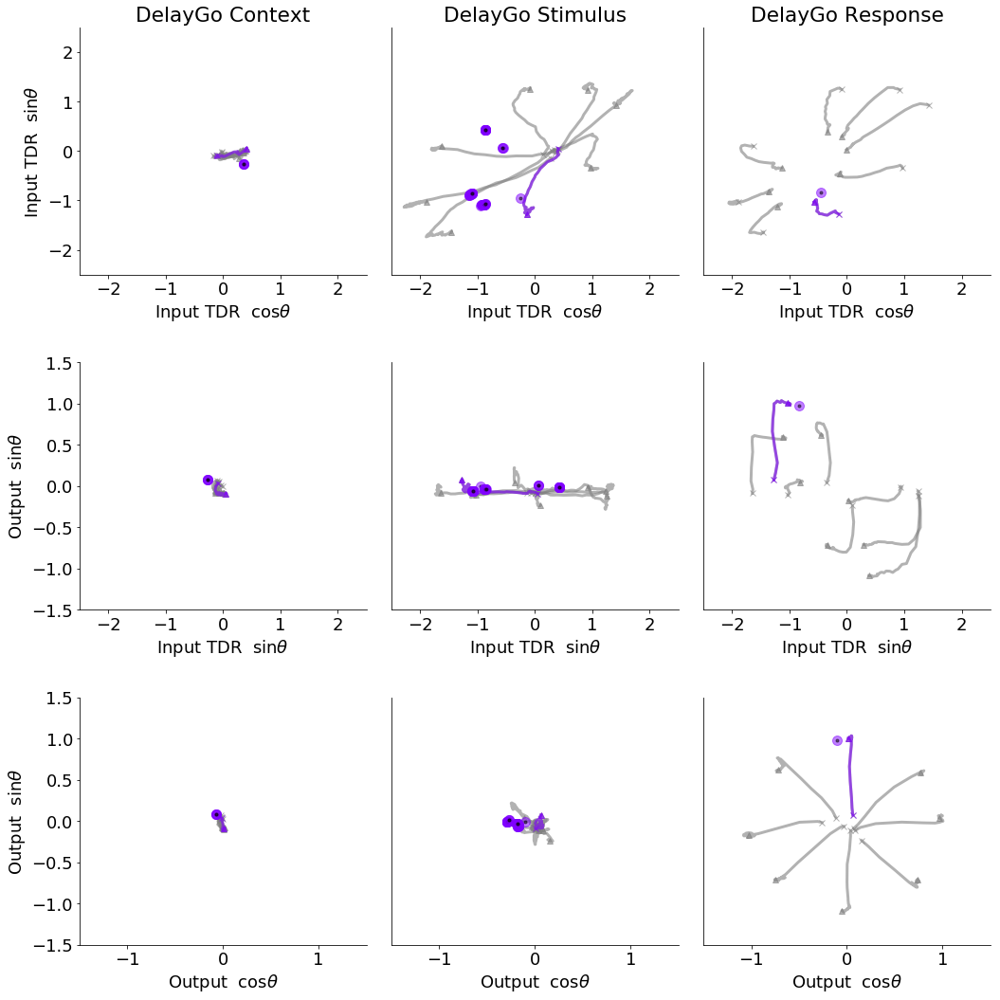

In [180]:
axes_epoch = 'stim1'
rule_ind = 0
do_plot = 1
nr = 3
t_num = 0
qlim = .0000001
input_lim = 2.5

epoch_set = ['fix1','stim1','go1']
epoch_order = range(3)
rule = rules_dict['all'][rule_ind]
fig = plt.figure(figsize=(len(epoch_set)*5,nr*5),tight_layout=True,facecolor='white')

for fp_epoch_ind in range(len(epoch_set)):
    fp_epoch = epoch_set[epoch_order[fp_epoch_ind]]
    D_stim = make_axes(model_dir_all,ckpt_n_dir,rule,axes_epoch)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_stim,fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.ylim((-input_lim,input_lim))    
    plt.xlim((-input_lim,input_lim))  
    plt.xlabel('Input TDR ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Input TDR ' + r' $\sin{\theta}$') 
    else:
        ax.get_yaxis().set_visible(False)
         
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+len(epoch_set))
    D_innout = np.concatenate((D_stim[:,1:],w_out[:,2:]),axis = 1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_innout,fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.title(' ')
    plt.xlim((-input_lim,input_lim))
    plt.ylim((-1.5,1.5))  
    plt.xlabel('Input TDR ' + r' $\sin{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$')
    else:
        ax.get_yaxis().set_visible(False)
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+2*len(epoch_set))
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,w_out[:,1:],fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.title(' ')
    plt.ylim((-1.5,1.5))    
    plt.xlim((-1.5,1.5))  
    plt.xlabel('Output ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$')
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

figpath = os.path.join(model_dir_all,'Output Prep Figure',rule)
figname = rule+'_Output_axes_FP_one_trials.pdf'
if not os.path.exists(figpath):
    os.makedirs(figpath)
plt.savefig(os.path.join(figpath,figname))
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
either
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
80
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/ke

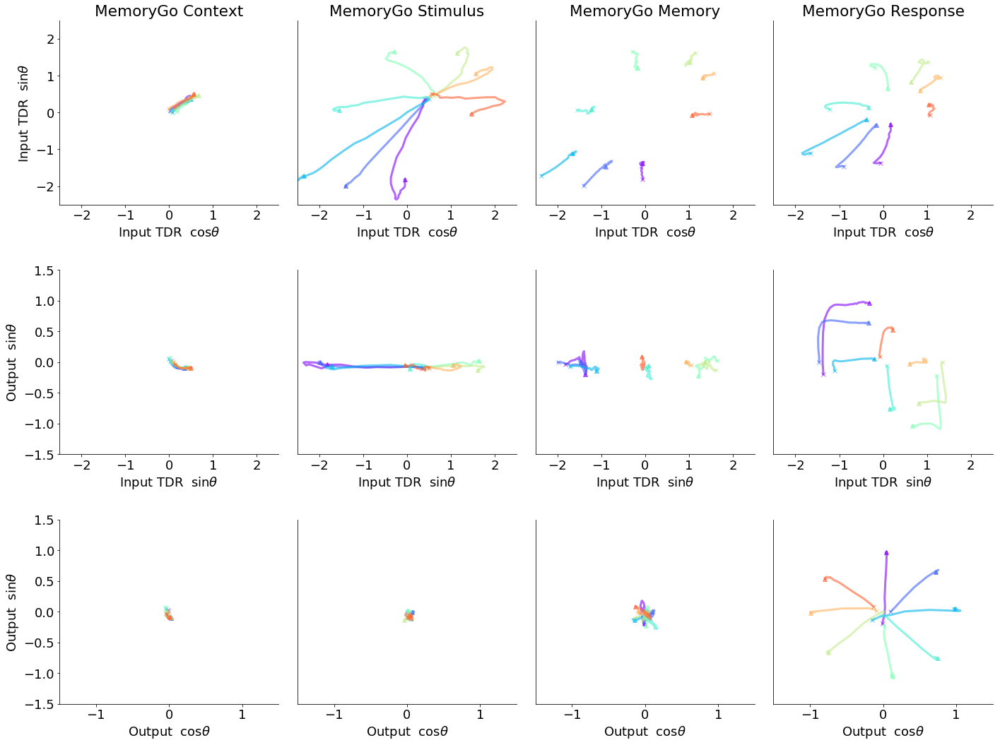

In [169]:
axes_epoch = 'stim1'
rule_ind = 2
do_plot = 1
nr = 3
t_num = 0
qlim = .0000001
do_plot = 0
input_lim = 2.5
rule = rules_dict['all'][rule_ind]

epoch_set = ['fix1','stim1','delay1','go1']
epoch_order = range(len(epoch_set))
fig = plt.figure(figsize=(len(epoch_set)*5,nr*5),tight_layout=True,facecolor='white')

for fp_epoch_ind in range(len(epoch_set)):
    fp_epoch = epoch_set[epoch_order[fp_epoch_ind]]
    D_stim = make_axes(model_dir_all,ckpt_n_dir,rule,axes_epoch)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_stim,fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.ylim((-input_lim,input_lim))    
    plt.xlim((-input_lim,input_lim))  
    plt.xlabel('Input TDR ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Input TDR ' + r' $\sin{\theta}$') 
    else:
        ax.get_yaxis().set_visible(False)
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+len(epoch_set))
    D_innout = np.concatenate((D_stim[:,1:],w_out[:,2:]),axis = 1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_innout,fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.title(' ')
    plt.xlim((-input_lim,input_lim))
    plt.ylim((-1.5,1.5))  
    plt.xlabel('Input TDR ' + r' $\sin{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$') 
    else:
        ax.get_yaxis().set_visible(False)
         
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+2*len(epoch_set))
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,w_out[:,1:],fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.title(' ')
    plt.ylim((-1.5,1.5))    
    plt.xlim((-1.5,1.5))  
    plt.xlabel('Output ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$') 
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

figpath = os.path.join(model_dir_all,'Output Prep Figure',rule)
figname = rule+'_Output_axes_Act_trials.pdf'
if not os.path.exists(figpath):
    os.makedirs(figpath)
plt.savefig(os.path.join(figpath,figname))
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/ckpts/model.ckpt-414000
either
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/ckpts/model.ckpt-414000
80
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/ke

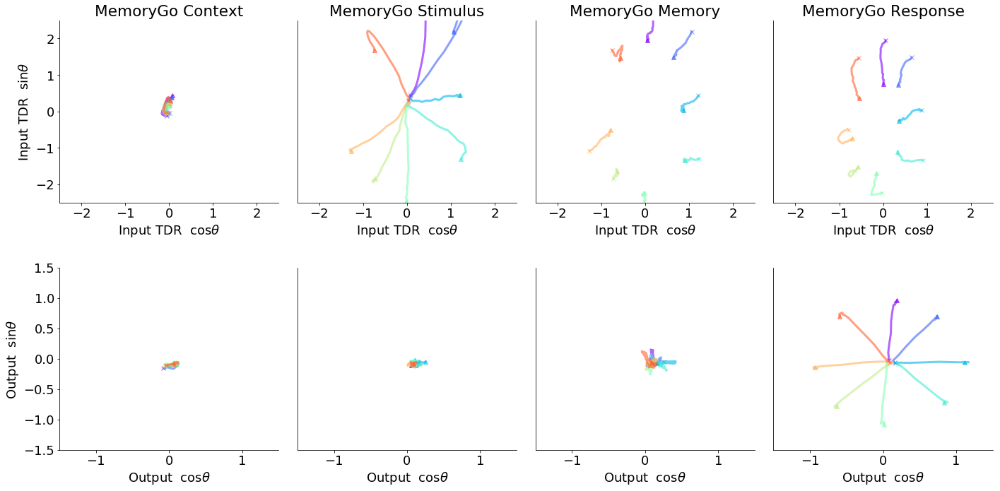

In [535]:
axes_epoch = 'stim1'
rule_ind = 2
do_plot = 1
nr = 2
t_num = 0
qlim = .0000001
do_plot = 0
input_lim = 2.5
rule = rules_dict['all'][rule_ind]

epoch_set = ['fix1','stim1','delay1','go1']
epoch_order = range(len(epoch_set))
fig = plt.figure(figsize=(len(epoch_set)*5,nr*5),tight_layout=True,facecolor='white')

for fp_epoch_ind in range(len(epoch_set)):
    fp_epoch = epoch_set[epoch_order[fp_epoch_ind]]
    D_stim = make_axes(model_dir_all,ckpt_n_dir,rule,axes_epoch)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_stim,fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.ylim((-input_lim,input_lim))    
    plt.xlim((-input_lim,input_lim))  
    plt.xlabel('Input TDR ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Input TDR ' + r' $\sin{\theta}$') 
    else:
        ax.get_yaxis().set_visible(False)
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+len(epoch_set))
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,w_out[:,1:],fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.title(' ')
    plt.ylim((-1.5,1.5))    
    plt.xlim((-1.5,1.5))  
    plt.xlabel('Output ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$') 
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

figpath = os.path.join(model_dir_all,'Output Prep Figure',rule)
figname = rule+'_Output_axes_Act_trials_small.pdf'
if not os.path.exists(figpath):
    os.makedirs(figpath)
plt.savefig(os.path.join(figpath,figname))
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
either
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
80
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/sof

INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/ckpts/model.ckpt-270000
80
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/0/golub_fixed_pts/delaygo/go1_0.npz


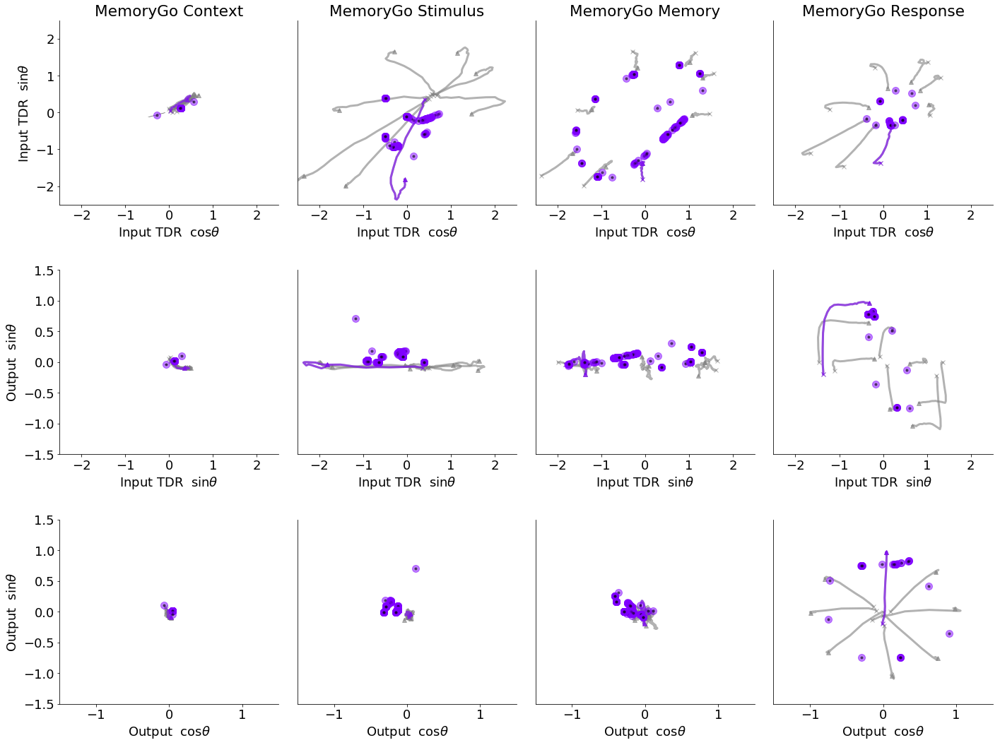

In [179]:
axes_epoch = 'stim1'
rule_ind = 2
do_plot = 1
nr = 3
t_num = 0
qlim = .000001
input_lim = 2.5
do_plot = 1
rule = rules_dict['all'][rule_ind]

epoch_set = ['fix1','stim1','delay1','go1']
epoch_order = range(len(epoch_set))
fig = plt.figure(figsize=(len(epoch_set)*5,nr*5),tight_layout=True,facecolor='white')

for fp_epoch_ind in range(len(epoch_set)):
    fp_epoch = epoch_set[epoch_order[fp_epoch_ind]]
    D_stim = make_axes(model_dir_all,ckpt_n_dir,rule,axes_epoch)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_stim,fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.ylim((-input_lim,input_lim))    
    plt.xlim((-input_lim,input_lim))  
    plt.xlabel('Input TDR ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Input TDR ' + r' $\sin{\theta}$') 
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+len(epoch_set))
    D_innout = np.concatenate((D_stim[:,1:],w_out[:,2:]),axis = 1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_innout,fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.title(' ')
    plt.xlim((-input_lim,input_lim))
    plt.ylim((-1.5,1.5))  
    plt.xlabel('Input TDR ' + r' $\sin{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$') 
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+2*len(epoch_set))
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,w_out[:,1:],fp_epoch,axes_epoch,
                              do_plot_FP=do_plot,t_num = t_num,qlim = qlim)
    plt.title(' ')
    plt.ylim((-1.5,1.5))    
    plt.xlim((-1.5,1.5))  
    plt.xlabel('Output ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$') 
    else:
        ax.get_yaxis().set_visible(False)
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

figpath = os.path.join(model_dir_all,'Output Prep Figure',rule)
figname = rule+'_Output_axes_FP_one_trials.pdf'
if not os.path.exists(figpath):
    os.makedirs(figpath)
plt.savefig(os.path.join(figpath,figname))
plt.show()

Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/ckpts/model.ckpt-414000
either
either
either
either
either
Variables being optimized:
<tf.Variable 'rnn/leaky_rnn_cell/kernel:0' shape=(281, 256) dtype=float32_ref>
<tf.Variable 'rnn/leaky_rnn_cell/bias:0' shape=(256,) dtype=float32_ref>
<tf.Variable 'output/weights:0' shape=(256, 3) dtype=float32_ref>
<tf.Variable 'output/biases:0' shape=(3,) dtype=float32_ref>
INFO:tensorflow:Restoring parameters from /Users/lauradriscoll/Documents/data/rnn/multitask/crystals/softplus/l2w0001/1/ckpts/model.ckpt-414000
80
/Users/lauradriscoll/Documents/data/rnn/multitask/crystals/sof

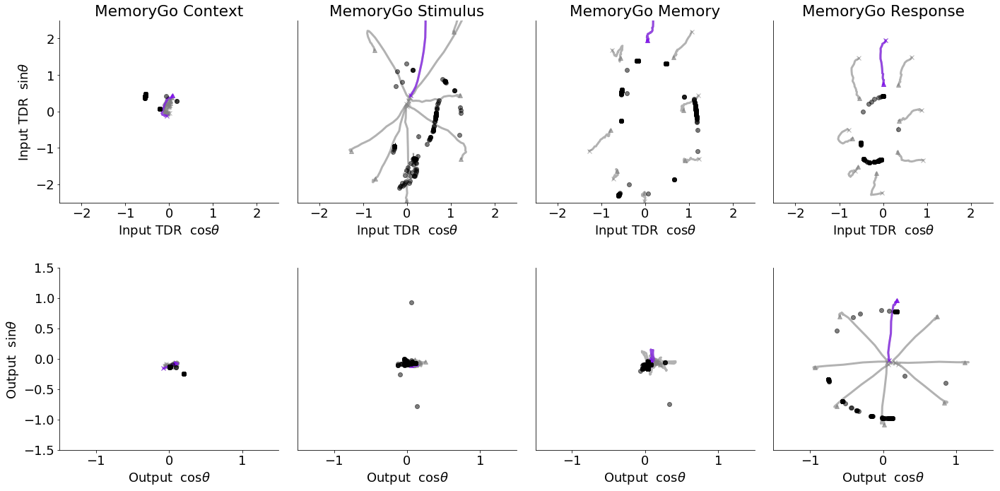

In [538]:
axes_epoch = 'stim1'
rule_ind = 2
do_plot = 1
nr = 2
t_num = 0
qlim = .001
input_lim = 2.5
do_plot = 1
rule = rules_dict['all'][rule_ind]

epoch_set = ['fix1','stim1','delay1','go1']
epoch_order = range(len(epoch_set))
fig = plt.figure(figsize=(len(epoch_set)*5,nr*5),tight_layout=True,facecolor='white')

for fp_epoch_ind in range(len(epoch_set)):
    fp_epoch = epoch_set[epoch_order[fp_epoch_ind]]
    D_stim = make_axes(model_dir_all,ckpt_n_dir,rule,axes_epoch)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1)
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,D_stim,fp_epoch,axes_epoch,
                              do_plot_FP=do_plot, t_num = t_num, qlim = qlim)
    plt.ylim((-input_lim,input_lim))    
    plt.xlim((-input_lim,input_lim))  
    plt.xlabel('Input TDR ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Input TDR ' + r' $\sin{\theta}$') 
    else:
        ax.get_yaxis().set_visible(False)
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax = plt.subplot(nr,len(epoch_set),fp_epoch_ind+1+len(epoch_set))
    plot_fp_struct_multicolor(model_dir_all,ckpt_n_dir,[rule_ind],range(200),rule,w_out[:,1:],fp_epoch,axes_epoch,
                              do_plot_FP=do_plot, t_num = t_num, qlim = qlim)
    plt.title(' ')
    plt.ylim((-1.5,1.5))    
    plt.xlim((-1.5,1.5))  
    plt.xlabel('Output ' + r' $\cos{\theta}$')
    
    if fp_epoch_ind==0:
        plt.ylabel('Output ' + r' $\sin{\theta}$') 
    else:
        ax.get_yaxis().set_visible(False)
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

figpath = os.path.join(model_dir_all,'Output Prep Figure',rule)
figname = rule+'_Output_axes_FP_one_trials_small.pdf'
if not os.path.exists(figpath):
    os.makedirs(figpath)
plt.savefig(os.path.join(figpath,figname))
plt.show()